In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import sklearn.metrics
from statsmodels.stats.multitest import multipletests
import statsmodels.api as sm
import scipy.stats
import scipy
import scipy as sp
from sklearn.decomposition import PCA
import pyranges as pr

In [2]:
from sklearn.cluster import SpectralBiclustering
from sklearn.cluster import SpectralCoclustering

## compile data

In [3]:
maindir = "/lila/data/deyk/fabiha/20231112_dingyu/data"

In [4]:

celltypes = ["D3_sample_H", "D3_sample_H_de1", "D3_sample_H_de2", "D7_sample_I", "D7_sample_I_liver", 
             "D7_sample_I_pfg1", "D7_sample_I_pfg2",
             "D11_sample_J", "D11_sample_J_ep", "D11_sample_J_pp1", "D11_sample_J_pp2",
             "D18_sample_L", "D18_sample_L_endo", "D18_sample_L_ep", "D18_sample_L_none", "D18_sample_L_scalpha", "D18_sample_L_scbeta", "D18_sample_L_scdelta", "D18_sample_L_scec", "D18_sample_L_stromal", "D18_sample_L_unk"]
"""
celltypes = ["D3_sample_H_de1", "D3_sample_H_de2", 
             "D7_sample_I_liver", "D7_sample_I_pfg1", "D7_sample_I_pfg2",
             "D11_sample_J_ep", "D11_sample_J_pp1", "D11_sample_J_pp2",
             "D18_sample_L_ep", "D18_sample_L_none", "D18_sample_L_scalpha", "D18_sample_L_scbeta", "D18_sample_L_scdelta", "D18_sample_L_scec", "D18_sample_L_stromal", "D18_sample_L_unk"]
"""

'\ncelltypes = ["D3_sample_H_de1", "D3_sample_H_de2", \n             "D7_sample_I_liver", "D7_sample_I_pfg1", "D7_sample_I_pfg2",\n             "D11_sample_J_ep", "D11_sample_J_pp1", "D11_sample_J_pp2",\n             "D18_sample_L_ep", "D18_sample_L_none", "D18_sample_L_scalpha", "D18_sample_L_scbeta", "D18_sample_L_scdelta", "D18_sample_L_scec", "D18_sample_L_stromal", "D18_sample_L_unk"]\n'

In [5]:
bag_genes = set()
deg = dict()
for ct in celltypes:
    print(ct)
    ko_files = os.listdir(f"{maindir}/{ct}")
    for ko_f in ko_files:
        ko = ko_f.split("_")[-4]
        df = pd.read_csv(f"{maindir}/{ct}/{ko_f}", index_col=0)
        df = df[(df["avg_log2FC"]>0.5)|(df["avg_log2FC"]<-0.5)]
        if len(df) > 0:
            print(ko_f, len(df))
            bag_genes = bag_genes.union(set(df.index))
            
            deg[f"{ct}_{ko}"] = dict(zip(df.index, df["avg_log2FC"]))
    print()

D3_sample_H
all_GATA6het_vs_WT_DEG.csv 201
all_HHEX_vs_WT_DEG.csv 52
all_HHEXhet_vs_WT_DEG.csv 13
all_HNF4A_vs_WT_DEG.csv 9
all_RFX6_vs_WT_DEG.csv 13
all_PROSER1_vs_WT_DEG.csv 42
all_GATA4het_vs_WT_DEG.csv 9
all_KDM2B_vs_WT_DEG.csv 66
all_GLIS3_vs_WT_DEG.csv 156
all_BMPR1A_vs_WT_DEG.csv 124
all_NKX6-1_vs_WT_DEG.csv 16
all_GATA4_vs_WT_DEG.csv 15
all_PBX1_vs_WT_DEG.csv 134
all_MNX1_vs_WT_DEG.csv 51
all_QSER1TET1_vs_WT_DEG.csv 168
all_GATA6_vs_WT_DEG.csv 744
all_FOXA2_vs_WT_DEG.csv 512
all_BCOR_vs_WT_DEG.csv 26
all_HHEXe_vs_WT_DEG.csv 9
all_QSER1_vs_WT_DEG.csv 31
all_TLE3_vs_WT_DEG.csv 14
all_NEUROD1_vs_WT_DEG.csv 52
all_FOXA1_vs_WT_DEG.csv 18
all_TET123_vs_WT_DEG.csv 133
all_GSC_vs_WT_DEG.csv 514
all_TET1_vs_WT_DEG.csv 65
all_UBA6_vs_WT_DEG.csv 74
all_PDX1het_vs_WT_DEG.csv 495
all_HES1_vs_WT_DEG.csv 136
all_PAX6_vs_WT_DEG.csv 4
all_NGN3_vs_WT_DEG.csv 11
all_ONECUT1e_vs_WT_DEG.csv 25
all_TADA2B_vs_WT_DEG.csv 480
all_ARX_vs_WT_DEG.csv 601
all_PDX1_vs_WT_DEG.csv 206
all_OTUD5_vs_WT_DEG.csv 

In [11]:
bag_genes = set()
deg_pval = dict()
for ct in celltypes:
    print(ct)
    ko_files = os.listdir(f"{maindir}/{ct}")
    for ko_f in ko_files:
        ko = ko_f.split("_")[-4]
        df = pd.read_csv(f"{maindir}/{ct}/{ko_f}", index_col=0)
        if len(df) > 0:
            print(ko_f)
            bag_genes = bag_genes.union(set(df.index))
            
            deg_pval[f"{ct}_{ko}"] = dict(zip(df.index, df["p_val_adj"]))
    print()

D3_sample_H_de1
DE_1_QSER1_vs_WT_DEG.csv
DE_1_ARX_vs_WT_DEG.csv
DE_1_GATA6het_vs_WT_DEG.csv
DE_1_MNX1_vs_WT_DEG.csv
DE_1_QSER1TET1_vs_WT_DEG.csv
DE_1_NKX6-1_vs_WT_DEG.csv
DE_1_GATA6_vs_WT_DEG.csv
DE_1_FOXA1_vs_WT_DEG.csv
DE_1_GATA4het_vs_WT_DEG.csv
DE_1_PROSER1_vs_WT_DEG.csv
DE_1_GATA4_vs_WT_DEG.csv
DE_1_GSC_vs_WT_DEG.csv
DE_1_FOXA2_vs_WT_DEG.csv

D3_sample_H_de2
DE_2_KDM2B_vs_WT_DEG.csv
DE_2_MNX1_vs_WT_DEG.csv
DE_2_GSC_vs_WT_DEG.csv
DE_2_TET1_vs_WT_DEG.csv
DE_2_PROSER1_vs_WT_DEG.csv
DE_2_NEUROD1_vs_WT_DEG.csv
DE_2_BCOR_vs_WT_DEG.csv
DE_2_ARX_vs_WT_DEG.csv
DE_2_GATA4het_vs_WT_DEG.csv
DE_2_TET123_vs_WT_DEG.csv
DE_2_GLIS3_vs_WT_DEG.csv
DE_2_NKX6-1_vs_WT_DEG.csv
DE_2_GATA6het_vs_WT_DEG.csv
DE_2_QSER1_vs_WT_DEG.csv
DE_2_QSER1TET1_vs_WT_DEG.csv
DE_2_PAX6_vs_WT_DEG.csv
DE_2_RFX6_vs_WT_DEG.csv
DE_2_FOXA2_vs_WT_DEG.csv
DE_2_ONECUT1e_vs_WT_DEG.csv
DE_2_PDX1_vs_WT_DEG.csv
DE_2_NANOGe_vs_WT_DEG.csv
DE_2_NKX2-2_vs_WT_DEG.csv
DE_2_FOXA1_vs_WT_DEG.csv
DE_2_UBA6_vs_WT_DEG.csv
DE_2_TLE3_vs_WT_DEG.csv


In [6]:
len(bag_genes)

13333

In [7]:
bag_genes = sorted(bag_genes)

In [8]:
prog_list = sorted(deg.keys())

In [9]:
prog_list = [i for i in prog_list if "D3" in i] + [i for i in prog_list if "D7" in i] + [i for i in prog_list if "D11" in i] + [i for i in prog_list if "D18" in i]

In [10]:
df = []
for g in bag_genes:
    temp = []
    for p in prog_list:
        if g in deg[p].keys():
            temp.append(deg[p][g])
        else:
            temp.append(0)
    df.append(temp)

In [446]:
df = []
for g in bag_genes:
    temp = []
    for p in prog_list:
        if g in deg[p].keys():
            temp.append(1)
        else:
            temp.append(0)
    df.append(temp)

In [314]:
df = []
for g in bag_genes:
    temp = []
    for p in prog_list:
        if g in deg[p].keys():
            if deg[p][g] < -5:
                temp.append(-5)
            elif deg[p][g] > 5:
                temp.append(5)
            else:
                temp.append(deg[p][g])
        else:
            temp.append(0)
    df.append(temp)

In [172]:
df = []
for g in bag_genes:
    temp = []
    for p in prog_list:
        if g in deg_pval[p].keys():
            pval = -np.log10(deg_pval[p][g])
            if pval > 10:
                temp.append(10)
            else:
                temp.append(pval)
        else:
            temp.append(0)
    df.append(temp)

In [11]:
df = pd.DataFrame(df)
df.columns = prog_list
df.index = bag_genes

In [12]:
df

,D3_sample_H_ARX,D3_sample_H_BCOR,D3_sample_H_BMPR1A,D3_sample_H_FOXA1,D3_sample_H_FOXA2,D3_sample_H_GATA4,D3_sample_H_GATA4het,D3_sample_H_GATA6,D3_sample_H_GATA6het,D3_sample_H_GLIS3,...,D18_sample_L_unk_FOXA1,D18_sample_L_unk_HNF4A,D18_sample_L_unk_MNX1,D18_sample_L_unk_NEUROD1,D18_sample_L_unk_NKX2-2,D18_sample_L_unk_NKX6-1,D18_sample_L_unk_PDX1,D18_sample_L_unk_PROSER1,D18_sample_L_unk_RFX6,D18_sample_L_unk_TLE3
A1BG,0.710425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1BG-AS1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1CF,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2M,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2ML1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM8,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZWILCH,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZWINT,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZYG11A,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
min(df.min()), max(df.max()),

(-7.29530415592493, 11.2164414491562)

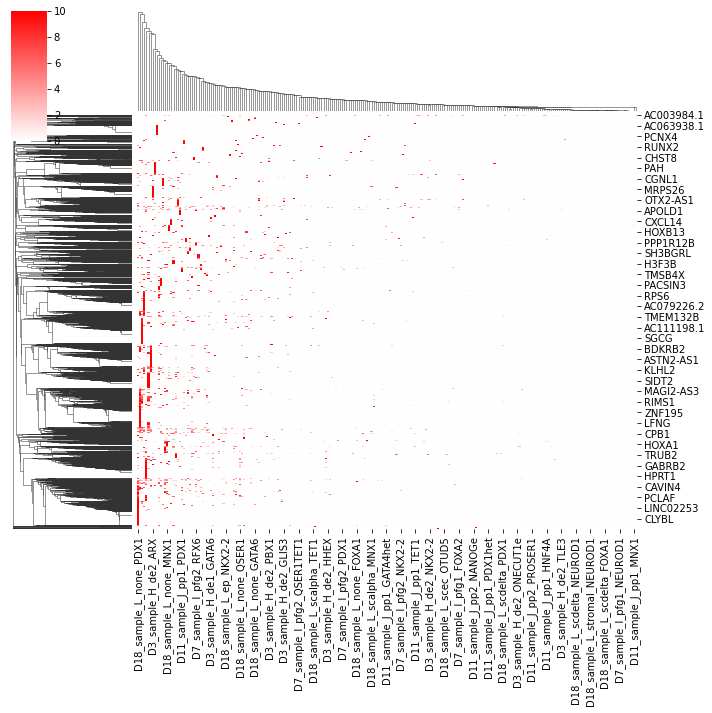

In [176]:
sns.clustermap(df, center=0, z_score=0, vmin=0, vmax=10, annot=False, fmt='.2f', cmap="bwr")
plt.show()

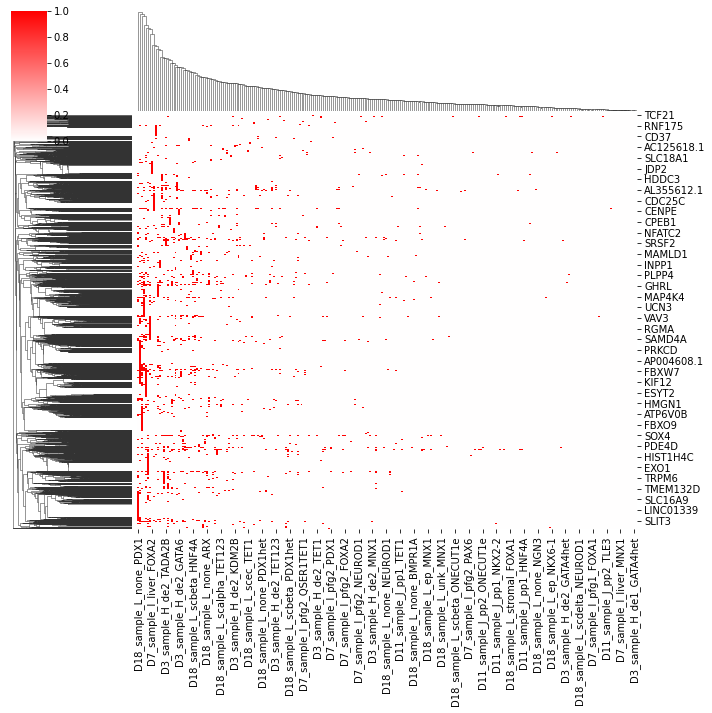

In [452]:
sns.clustermap(df, center=0, z_score=0, vmin=0, vmax=1, annot=False, fmt='.2f', cmap="bwr")
plt.show()

In [499]:
df_d18 = df[[i for i in df.columns if "D18" in i]]
df_d18 = df_d18.loc[(df_d18 != 0).any(axis=1),:]

In [500]:
df_max = []
for row in df_d18.iterrows():
    logfc = [i for i in row[1] if i != 0]
    
    if np.mean(logfc) > 0.01:
        #df_max.append([row[0], np.std(logfc)/np.mean(logfc)])
        df_max.append([row[0], np.std(logfc)])
    
df_max = pd.DataFrame(df_max)

In [501]:
top_deg = list(df_max.sort_values(1, ascending=False)[:50][0])

In [502]:
top_df = df_d18.loc[top_deg]
top_df = top_df.loc[:, (top_df != 0).any(axis=0)]

In [503]:
top_df

,D18_sample_L_ep_NKX2-2,D18_sample_L_ep_PDX1,D18_sample_L_none_ARX,D18_sample_L_none_BCOR,D18_sample_L_none_FOXA1,D18_sample_L_none_GATA4,D18_sample_L_none_GATA6,D18_sample_L_none_HNF4A,D18_sample_L_none_MNX1,D18_sample_L_none_NEUROD1,...,D18_sample_L_scec_PDX1,D18_sample_L_scec_PDX1het,D18_sample_L_scec_PROSER1,D18_sample_L_scec_RFX6,D18_sample_L_scec_TADA2B,D18_sample_L_scec_TET1,D18_sample_L_scec_TLE3,D18_sample_L_stromal_FOXA1,D18_sample_L_stromal_MNX1,D18_sample_L_unk_PDX1
TFAP2A,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AP000331.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PTH2R,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PRODH2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
RASSF9,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WNT5A,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,3.972608,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SHISAL2B,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
SLITRK4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AL513164.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
FST,4.073737,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


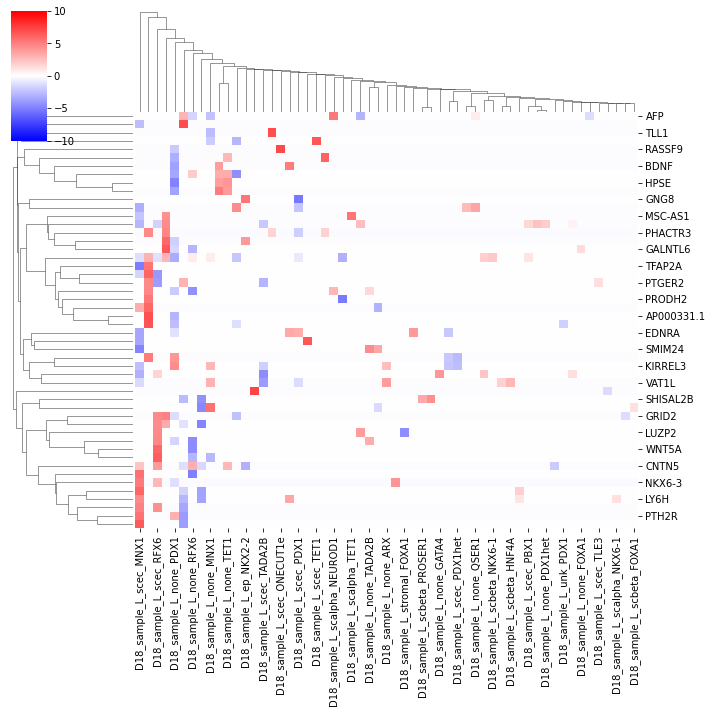

In [506]:
#sns.clustermap(top_df, col_cluster=False, center=0, z_score=0, vmin=-10, vmax=10, annot=False, fmt='.2f', cmap="bwr")
sns.clustermap(top_df, center=0, z_score=0, vmin=-10, vmax=10, annot=False, fmt='.2f', cmap="bwr")
plt.show()

In [453]:
df_max = []
for row in df.iterrows():
    logfc = [i for i in row[1] if i != 0]
    
    if np.mean(logfc) > 0.01:
        df_max.append([row[0], np.std(logfc)/np.mean(logfc)])
        #df_max.append([row[0], np.std(logfc)])
    
df_max = pd.DataFrame(df_max)

In [454]:
top_deg = list(df_max.sort_values(1, ascending=False)[:50][0])

In [455]:
top_df = df.loc[top_deg]
top_df = top_df.loc[:, (top_df != 0).any(axis=0)]

In [456]:
top_df

,D3_sample_H_de1_FOXA2,D3_sample_H_de1_GATA6,D3_sample_H_de2_ARX,D3_sample_H_de2_BMPR1A,D3_sample_H_de2_FOXA2,D3_sample_H_de2_GATA6,D3_sample_H_de2_GATA6het,D3_sample_H_de2_GSC,D3_sample_H_de2_HHEX,D3_sample_H_de2_MNX1,...,D18_sample_L_scec_PDX1,D18_sample_L_scec_PDX1het,D18_sample_L_scec_PROSER1,D18_sample_L_scec_RFX6,D18_sample_L_scec_TADA2B,D18_sample_L_scec_TET1,D18_sample_L_scec_TLE3,D18_sample_L_stromal_ARX,D18_sample_L_unk_PROSER1,D18_sample_L_unk_RFX6
A1BG,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
PARM1,0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,1,0,0,0,0,0
PAWR,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PAUPAR,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,0,1,0,0,0
PATJ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PARVB,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,0,0,0,0
PARVA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
PARPBP,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
PARP9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
PARP8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0


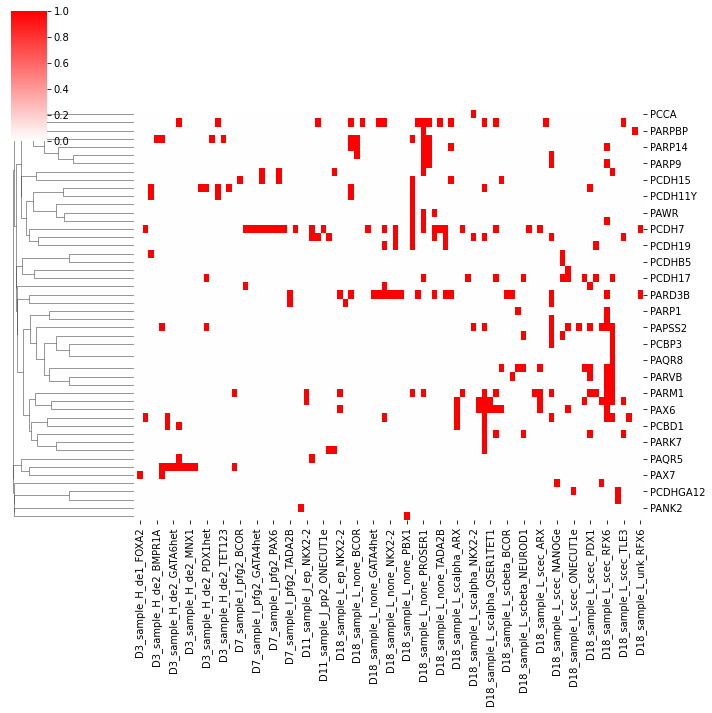

In [459]:
sns.clustermap(top_df, col_cluster=False, center=0, z_score=0, vmin=0, vmax=1, annot=False, fmt='.2f', cmap="bwr")
plt.show()

In [482]:
top_df_d18 = top_df[[i for i in top_df.columns if "D18" in i]]
top_df_d18 = top_df_d18.loc[(top_df_d18 != 0).any(axis=1),:]

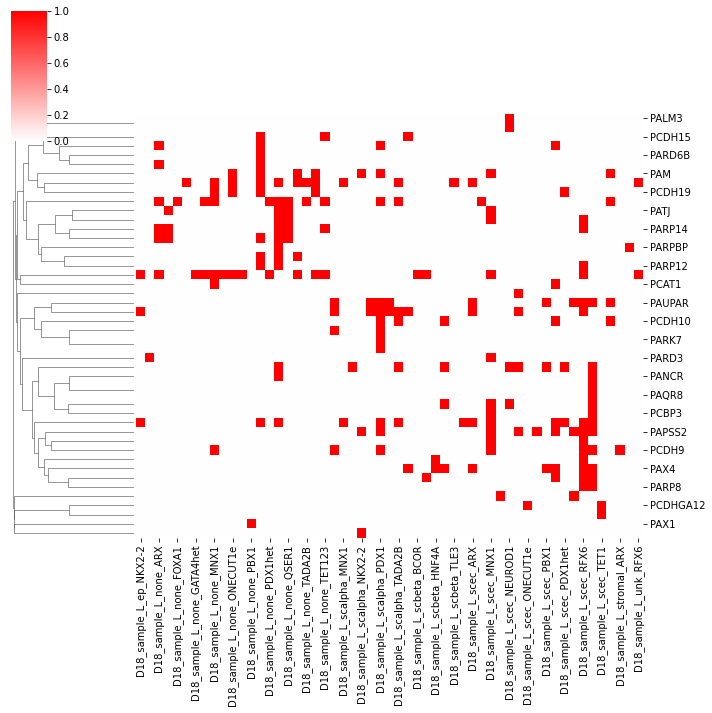

In [488]:
sns.clustermap(top_df_d18, col_cluster=False, center=0, z_score=0, vmin=0, vmax=1, annot=False, fmt='.2f', cmap="bwr")
plt.show()

In [483]:
clustering = SpectralBiclustering(n_clusters=5, random_state=0).fit(top_df_d18)

In [485]:
"""
deg_order = []
for cl in range(10):
    print(cl)
    temp = top_df.iloc[[i == cl for i in clustering.row_labels_],[i == cl for i in clustering.column_labels_]]
    deg_order.extend(list(set(temp.index).intersection(set(top_df.index))))
    print(list(set(temp.index).intersection(set(top_df.index))))
    print()
"""

deg_order = []
for cl in range(10):
    print(cl)
    temp = top_df_d18.iloc[[i == cl for i in clustering.row_labels_],[i == cl for i in clustering.column_labels_]]
    deg_order.extend(list(set(temp.index).intersection(set(top_df_d18.index))))
    print(list(set(temp.index).intersection(set(top_df_d18.index))))
    print()

0
['PARM1', 'PAUPAR', 'A1BG', 'PCBD1', 'PARP12', 'PAPSS1', 'PARP9', 'PCDH9-AS2', 'PCDH15', 'PARD3', 'PARK7', 'PARP1']

1
['PCDHB5', 'PAQR8', 'PAX1', 'PCCA', 'PANCR', 'PARD6B', 'PCBP3', 'PARPBP', 'PAPSS2', 'PCAT1', 'PARP8', 'PALM3', 'PCDHA5', 'PCDH9-AS4', 'PCDH19', 'PCDH11Y', 'PARVA', 'PARVB']

2
['PCDH7', 'PAM', 'PAWR', 'PCDH11X', 'PARD3B']

3
['PCDH10', 'PAX4', 'PATJ', 'PCDH17', 'PCBP4', 'PCDHGA12', 'PCAT14', 'PARP14', 'PCDH9-AS1']

4
['PAX6', 'PCDH9']

5
[]

6
[]

7
[]

8
[]

9
[]



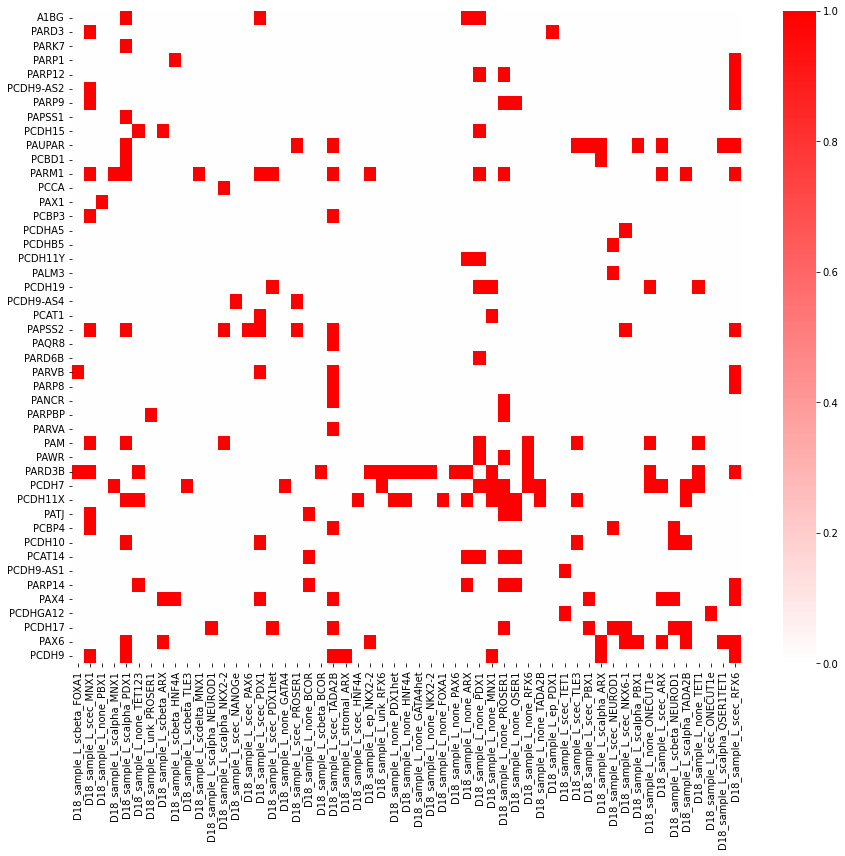

In [487]:
cm = ['vlag', 'Blues', 'Reds']
f, axs = plt.subplots(1, 1, gridspec_kw={'wspace': 0}, figsize=(15,12))

fit_data = top_df_d18.iloc[:,np.argsort(clustering.column_labels_)]
fit_data = fit_data.iloc[np.argsort(clustering.row_labels_)]

#hm = pd.DataFrame([ko_df_sumarized["Prog MODY neglog10P"].to_list(), ko_df_sumarized["Prog T2D neglog10P"].to_list()])
#sns.heatmap(top_df.loc[deg_order], yticklabels=["MODY","T2D"], xticklabels=order, annot=False, fmt='.2f', cmap='Reds')
sns.heatmap(fit_data, annot=False, fmt='.2f', cmap='bwr', center=0)

#plt.title("Average significance across programs per KO for MODY and T2D")
plt.show()
#plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_ko_heatmap_plot.png", bbox_inches="tight", dpi=900)

In [437]:
df_d3 = df[[i for i in df.columns if "D3" in i]]

In [438]:
clustering = SpectralBiclustering(n_clusters=10, random_state=0).fit(df_d3)

In [116]:
df_counts = []
for row in df.iterrows():
    df_counts.append([row[0], sum([1 for i in row[1] if i > 0 or i < 0])])
    
df_counts = pd.DataFrame(df_counts)

In [119]:
df_counts[df_counts[1]>2].sort_values(1, ascending=False)

,0,1
351,AC079062.1,136
1421,C5orf17,124
5909,SLC35F1,95
441,AC093898.1,85
336,AC069277.1,83
...,...,...
1868,CNTNAP3B,3
5156,PRKCE,3
1854,CNNM1,3
5171,PRODH2,3


In [112]:
df_counts = []
for row in df.T.iterrows():
    df_counts.append([row[0], sum([1 for i in row[1] if i > 0 or i < 0])])
    
df_counts = pd.DataFrame(df_counts)

In [115]:
df_counts[df_counts[1]>30].sort_values(1, ascending=False)

,0,1
219,D18_sample_L_scec_MNX1,1392
172,D18_sample_L_none_PDX1,1330
231,D18_sample_L_scec_RFX6,1254
189,D18_sample_L_scalpha_PDX1,1143
232,D18_sample_L_scec_TADA2B,1115
...,...,...
56,D7_sample_I_pfg1_FOXA2,33
223,D18_sample_L_scec_ONECUT1e,33
65,D7_sample_I_pfg1_TADA2B,32
182,D18_sample_L_scalpha_FOXA1,32


## pmd

In [29]:
clustering_scripts_path = "/lila/data/deyk/fabiha/20231112_dingyu/clustering_scripts"
clusters_path = "/lila/data/deyk/fabiha/20231112_dingyu/clusters"

base_path= "/data/deyk/fabiha/20231112_dingyu/all_days_celltypes"
post_results_path = "/data/deyk/fabiha/20231112_dingyu/all_days_celltypes"

In [30]:
st_pmd_sh = r'''IFS=""

module load gcc/10.2.0
module load R

cmd="Rscript pmd_{$NAME}.R"
bsub -W 600 -R "rusage[mem=250]" -e pmd_{$NAME}.err -o pmd_{$NAME}.out -n 1 "$cmd"
'''

st_pmd_r = r'''library(PMA)
library(data.table)

df = data.frame(fread("{$DATAFILE}"))
dim(df)

#df = df[,-1]
#df = abs(df)

min.abs <- max(1/sqrt(nrow(as.matrix(df))), 1/sqrt(ncol(as.matrix(df))))
cv.out <- PMD.cv(as.matrix(df), type="standard", center = FALSE, sumabss=seq(min.abs, 0.9, len=20), trace = FALSE)
sumabs <- cv.out$bestsumabs

xx = PMD(as.matrix(df), K = {$NUM_CLUSTERS}, sumabs = sumabs, type = "standard", center = FALSE)

save(xx, file = paste0("{$SAVEFILE}"))
write.table(xx$u, "{$SAVEFILE_U}", quote=FALSE, sep='\t', row.names=FALSE)
write.table(xx$v, "{$SAVEFILE_V}", quote=FALSE, sep='\t', row.names=FALSE)
'''

def pmd(name, num_clusters):
    filename = f"{clustering_scripts_path}/pmd_{name}.sh"
    with open(filename, "w") as f:
        temp = st_pmd_sh.replace("{$NAME}", name)
        f.write(temp)

    filename = f"{clustering_scripts_path}/pmd_{name}.R"
    datafile = f"{base_path}/{name}.tsv"
    savefile = f"{post_results_path}/{name}.rda"
    savefile_u = f"{post_results_path}/{name}_u.tsv"
    savefile_v = f"{post_results_path}/{name}_v.tsv"
    with open(filename, "w") as f:
        temp = st_pmd_r.replace("{$DATAFILE}", datafile)
        temp = temp.replace("{$NUM_CLUSTERS}", str(num_clusters))
        temp = temp.replace("{$SAVEFILE}", savefile)
        temp = temp.replace("{$SAVEFILE_U}", savefile_u)
        temp = temp.replace("{$SAVEFILE_V}", savefile_v)
        f.write(temp)


In [31]:
df

,D3_sample_H_de1_ARX,D3_sample_H_de1_FOXA1,D3_sample_H_de1_FOXA2,D3_sample_H_de1_GATA4,D3_sample_H_de1_GATA4het,D3_sample_H_de1_GATA6,D3_sample_H_de1_GATA6het,D3_sample_H_de1_GSC,D3_sample_H_de1_MNX1,D3_sample_H_de1_NKX6-1,...,D18_sample_L_unk_FOXA1,D18_sample_L_unk_HNF4A,D18_sample_L_unk_MNX1,D18_sample_L_unk_NEUROD1,D18_sample_L_unk_NKX2-2,D18_sample_L_unk_NKX6-1,D18_sample_L_unk_PDX1,D18_sample_L_unk_PROSER1,D18_sample_L_unk_RFX6,D18_sample_L_unk_TLE3
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A4GALT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAK1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZSWIM5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZSWIM6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZYG11A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
df.to_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_log2fc.tsv", sep="\t", header=None, index=None)

In [143]:
df.to_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_log2fc_incl_header_index.tsv", sep="\t")

In [33]:
name = "all_days_celltypes_log2fc"
num_clusters = 25
pmd(name, num_clusters)

## gene nomenclature loading

In [279]:
gene_loc="/lila/data/deyk/IGVF/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/supplemental_data/NCBI37.3.ensembl.gene.loc"

In [280]:
gene_nomenclature=pd.read_table(gene_loc)

In [281]:
gene_nomenclature = gene_nomenclature[~gene_nomenclature["Ensembl"].duplicated(keep='first')] # not best method but need to keep unique

In [282]:
gene_nomenclature

,NCBI,chr,start,end,strand,HGNC,Ensembl
0,79501,1,69091,70008,+,OR4F5,ENSG00000186092
1,100996442,1,142447,174392,-,LOC100996442,ENSG00000238009
2,729759,1,367659,368597,+,OR4F29,ENSG00000284733
3,81399,1,621096,622034,-,OR4F16,ENSG00000284662
4,148398,1,859993,879961,+,SAMD11,ENSG00000187634
...,...,...,...,...,...,...,...
18311,442867,Y,26764151,26785354,+,BPY2B,ENSG00000183795
18312,57054,Y,26909216,26959639,-,DAZ3,ENSG00000187191
18313,57135,Y,26979967,27053187,+,DAZ4,ENSG00000205916
18314,442868,Y,27177048,27198251,-,BPY2C,ENSG00000185894


# PoPS Code Setup

In [21]:
scripts_dir = "/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes"

## marginal linear regression

In [22]:
py_script = r'''# Type echo "set enable-bracketed-paste off" >> ~/.inputrc before pasting this code in the python console on the cluster. 
# you need 100 to 120GB for this code to run. You can try with smaller RAM but use memory_limit im dt.fread()

#module load gcc/10.2.0
#module load python/3.7.1
#echo "set enable-bracketed-paste off" >> ~/.inputrc
#source activate kge
#python

import pandas as pd
import numpy as np
import argparse
import statsmodels.api as sm
from scipy.stats import pearsonr
import scipy
import datatable as dt

# features="/data/deyk/kushal/IGVF_GWAS_benchmark/PoPS_P2D_benchmark/supplemental_data/PoPS.features.txt.gz"
# gene_loc="/data/deyk/kushal/IGVF_GWAS_benchmark/PoPS_P2D_benchmark/supplemental_data/NCBI37.3.ensembl.gene.loc"
# gene_results="/data/deyk/kushal/IGVF_GWAS_benchmark/PoPS_P2D_benchmark/supplemental_data/Year_ended_full_time_education.sumstats"
# chunk=0
# numchunks=50
# out="/data/deyk/kushal/IGVF_GWAS_benchmark/PoPS_P2D_benchmark/features/MAGMA_0kb/Year_ended_full_time_education.sumstats"

def marginal_ols(X, Y):
    model = sm.OLS(Y, X).fit()
    coef = model.params[0]
    std_er = model.bse[0]
    R2 = model.rsquared
    pval = model.pvalues[0]
    return coef, std_er, pval, R2

def munge_sigma(args):
    f = open(args.gene_results+'.gene_trait'+'.genes.raw')
    lines = list(f)[2:]
    lines = [np.asarray(line.strip('\n').split(' ')) for line in lines]
    sigmas = []
    for chrom in range(1,23):
        chr_start = min(np.where([int(line[1])==chrom for line in lines])[0])
        chr_end = max(np.where([int(line[1])==chrom for line in lines])[0])
        lines_chr = lines[chr_start:chr_end+1]
        n_genes = len(lines_chr)
        sigma_chr = np.zeros([n_genes, n_genes])
        for i in range(n_genes):
            line = lines_chr[i]
            if line.shape[0] > 9:
                gene_corrs = np.asarray([float(c) for c in line[9:]])
                sigma_chr[i, i-gene_corrs.shape[0]:i] = gene_corrs
        sigma_chr = sigma_chr+sigma_chr.T+np.identity(n_genes)
        sigmas.append(sigma_chr)
    return sigmas


def compute_Ls(sigmas, args):
    Ls = []
    min_lambda = 0
    for sigma in sigmas:
        W = np.linalg.eigvalsh(sigma)
        min_lambda = min(min_lambda, min(W))
    Y = pd.read_table(args.gene_results+'.gene_trait'+'.genes.out', delim_whitespace=True).ZSTAT.values
    ridge = abs(min(min_lambda, 0))+.05+.9*max(0, np.var(Y)-1)
    for sigma in sigmas:
        sigma = sigma+ridge*np.identity(sigma.shape[0])
        L = np.linalg.cholesky(np.linalg.inv(sigma))
        Ls.append(L)
    full_L = scipy.linalg.block_diag(Ls[0], Ls[1], Ls[2], Ls[3], Ls[4], Ls[5], Ls[6], Ls[7], Ls[8], Ls[9], Ls[10], Ls[11], Ls[12], Ls[13], Ls[14], Ls[15], Ls[16], Ls[17], Ls[18], Ls[19], Ls[20], Ls[21])
    return full_L

def main(args):
    f_df_chunk = dt.fread(args.features, memory_limit=75)
    f_df = f_df_chunk.to_pandas()
    gene_nomenclature=pd.read_table(args.gene_loc)
    intersect_ensembl = np.intersect1d(np.array(f_df.ENSGID), np.array(gene_nomenclature.Ensembl))
    oo = [ np.where(f_df.ENSGID == x)[0][0] for x in intersect_ensembl.astype('str') ]
    f_df2 = f_df.iloc[oo,:].reset_index(drop=True)
    oo2 = [ np.where(gene_nomenclature.Ensembl == x)[0][0] for x in intersect_ensembl.astype('str') ]
    gene_nomenclature2 = gene_nomenclature.iloc[oo2,:].reset_index(drop=True)
    f_df2.insert(0, 'NCBI', np.array(gene_nomenclature2.NCBI).astype('str').tolist())
    f_df2.ENSGID.equals(gene_nomenclature2.Ensembl)
    gene_scores = pd.read_table(args.gene_results+'.gene_trait'+'.genes.out', delim_whitespace=True)[['GENE', 'ZSTAT']]
    intersect_ncbi = np.intersect1d(np.array(f_df2.NCBI).astype(str), np.array(gene_scores.GENE).astype(str))
    oo3 = [ np.where(np.array(f_df2.NCBI).astype(str) == x)[0][0] for x in intersect_ncbi.astype('str') ]
    oo4 = [ np.where(np.array(gene_scores.GENE).astype(str) == x)[0][0] for x in intersect_ncbi.astype('str') ]
    gene_scores2 = gene_scores.iloc[oo4,:].reset_index(drop=True)
    gene_scores2.GENE = gene_scores2.GENE.astype(str)
    f_df3 = f_df2.iloc[oo3,:].reset_index(drop=True)
    f_df3.NCBI = f_df3.NCBI.astype(str)
    f_df3.NCBI.equals(gene_scores2.GENE)
    gene_scores_zstat = gene_scores2.ZSTAT.values - np.mean(gene_scores2.ZSTAT.values)
    f = open(args.gene_results+'.gene_trait'+'.genes.raw')
    lines = list(f)[2:]
    lines = [np.asarray(line.strip('\n').split(' ')) for line in lines]
    magma_genes = np.array([x[0] for x in lines])
    uu = [ np.where(magma_genes == x)[0][0] for x in np.array(f_df3.NCBI) ]
    magma_genes2 = magma_genes[uu]
    sigmas =munge_sigma(args)
    full_L = compute_Ls(sigmas, args)
    full_L2 = full_L[uu,:][:,uu]
    ## full_L2 has the same order as that of f_df3, magma_genes2 and gene_scores2
    LY = np.matmul(full_L2, gene_scores_zstat)
    Num_features=57743
    Xmat = f_df3.iloc[:,2:Num_features]
    #chunk_ids=np.array_split(range(Xmat.shape[1]), args.numchunks)
    #Xmat2 = Xmat.iloc[:,chunk_ids[int(args.chunk)]]
    Xmat2 = Xmat
    nf = Xmat2.shape[1]
    coefs = np.zeros(nf)
    std_ers = np.zeros(nf)
    pvals = np.zeros(nf)
    rsquared = np.zeros(nf)
    ## f_df3 and gene_scores2 has the same genes arranged in same order
    for i in range(nf):
        LX = np.matmul(full_L2, Xmat2.iloc[:,i].astype(float))
        coef, std_er, pval, r2 = marginal_ols(LX, LY)
        coefs[i] = coef
        std_ers[i] = std_er
        pvals[i] = pval
        rsquared[i] = r2
        print(i)
    sig_results = pd.DataFrame(data={'Feature': Xmat2.columns.values[0:], 'BETA': coefs, 'SE': std_ers, 'P': pvals, 'R2': rsquared})[['Feature', 'BETA', 'SE', 'P', 'R2']]
    #selected = sig_results.loc[sig_results.P<=.05, ['Feature', 'BETA', 'SE',  'P', 'R2']].values
    selected = sig_results.loc[sig_results.P<=1, ['Feature', 'BETA', 'SE',  'P', 'R2']].values
    #np.savetxt(args.out+'.chunk.'+ str(args.chunk) + '.features',  selected, fmt='%s')
    np.savetxt(args.out+'.features',  selected, fmt='%s')

parser = argparse.ArgumentParser()
parser.add_argument('--features', help='Path to gene features', type=str)
parser.add_argument('--gene_loc', help='Path to gene nomenclature', type=str)
parser.add_argument('--gene_results', help='Prefix to gene analysis output from MAGMA', type=str)
#parser.add_argument('--chunk', help='Chunk label (for parallel processing of features)', type=int)
#parser.add_argument('--numchunks', help='Number of chunks', type=int)
parser.add_argument('--out', help='Prefix to output for selected features', type=str)

if __name__ == '__main__':
    args = parser.parse_args()
    main(args)
'''

filename = f"{scripts_dir}/pops.marginal_program_benchmark.magma.py"
with open(filename, "w") as f:
    f.write(py_script)

In [23]:
magma_cell = "/data/deyk/IGVF/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/supplemental_data/MAGMA_GENE_CELL_0"
gene_loc = "/lila/data/deyk/IGVF/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/supplemental_data/NCBI37.3.ensembl.gene.loc"
sumstats_taskfile = "/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes/traits_pops_T2D.txt"

marginal_sh_script = r'''module load gcc/10.2.0

module load anaconda/anaconda3
source /lila/home/fabihat/anaconda3/etc/profile.d/conda.sh
conda activate benchmarking

magma_cell={$MAGMA_CELL}
output_cell={$OUTPUT_CELL}
features_file={$FEATURES_FILE}
gene_loc={$GENE_LOC}
sumstats_taskfile={$SUMSTATS_TASKFILE}

IFS="
"

for step in `cat $sumstats_taskfile | awk '{print $1}' | sort | uniq`;
do
    sumstats_file=`echo $step | awk '{print $1}'`
    echo $sumstats_file
    traitname=$sumstats_file
    if [ ! -f $output_cell/$traitname.features ]
    then
    cmd="python3 pops.marginal_program_benchmark.magma.py --features $features_file --gene_loc $gene_loc --gene_results $magma_cell/$traitname --out $output_cell/$traitname"
    bsub -W 2440 -R "rusage[mem=30]" -o {$SCRIPT_OUT} -e {$SCRIPT_ERR} -n 1 "$cmd"
    fi
done
'''

def marginal_writer(script_dir, features_file_cell, output_cell, name):
    output_cell = f"{output_cell}"
    features_file = f"{features_file_cell}/{name}.txt.gz"
    script_out = f"{script_dir}/{name}_marginal.out"
    script_err = f"{script_dir}/{name}_marginal.err"
    
    filename = f"{scripts_dir}/pops.marginal_program_benchmark_{name}.magma.sh"
    with open(filename, "w") as f:
        temp = marginal_sh_script.replace("{$MAGMA_CELL}", magma_cell)
        temp = temp.replace("{$OUTPUT_CELL}", output_cell)
        temp = temp.replace("{$FEATURES_FILE}", features_file)
        temp = temp.replace("{$GENE_LOC}", gene_loc)
        temp = temp.replace("{$SUMSTATS_TASKFILE}", sumstats_taskfile)
        temp = temp.replace("{$SCRIPT_OUT}", script_out)
        temp = temp.replace("{$SCRIPT_ERR}", script_err)
        f.write(temp)

## joint linear regression

In [24]:
py_script = r'''# source /n/groups/price/kushal/env/pops/bin/activate
## python 3.7.4, gcc: 6.2.0, use python3 and pip3 always

import pandas as pd
import numpy as np
import scipy as sc
import argparse
from sklearn.linear_model import LinearRegression,RidgeCV
from sklearn.metrics import make_scorer
import copy

# gene_loc='/n/groups/price/kushal/extras/NCBI37.3.ensembl.gene.loc'
# features_file='/data/deyk/kushal/IGVF_GWAS_benchmark/PoPS_P2D_benchmark/supplemental_data/PoPS.features.txt.gz'
# gene_results='/data/deyk/kushal/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/supplemental_data/MAGMA_GENE_CELL_0/UKB_460K.pigment_HAIR.sumstats'
# selected_features_file='/data/deyk/kushal/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/pooled_features/MAGMA_0kb/UKB_460K.pigment_HAIR.sumstats.features'
# chromosome=22
# out='/data/deyk/kushal/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/predicted_scores/MAGMA_0kb/UKB_460K.pigment_HAIR.sumstats'


def munge_sigma(args):
	f = open(args.gene_results+'.gene_trait' + '.genes.raw')
	lines = list(f)[2:]
	lines = [np.asarray(line.strip('\n').split(' ')) for line in lines]
	sigmas = []
	gene_metadata = []
	gene_lists = []
	for chrom in range(1,23):
		chr_start = min(np.where([int(line[1])==chrom for line in lines])[0])
		chr_end = max(np.where([int(line[1])==chrom for line in lines])[0])
		lines_chr = lines[chr_start:chr_end+1]
		n_genes = len(lines_chr)
		sigma_chr = np.zeros([n_genes, n_genes])
		gene_NSNPs = np.zeros(n_genes)
		gene_NPARAM = np.zeros(n_genes)
		gene_MAC = np.zeros(n_genes)
		for i in range(n_genes):
			line = lines_chr[i]
			gene_NSNPs[i] = line[4]
			gene_NPARAM[i] = line[5]
			gene_MAC[i] = line[7]
			if line.shape[0] > 9:
				gene_corrs = np.asarray([float(c) for c in line[9:]])
				sigma_chr[i, i-gene_corrs.shape[0]:i] = gene_corrs
		sigma_chr = sigma_chr+sigma_chr.T+np.identity(n_genes)
		sigmas.append(sigma_chr)
		gene_metadata_chr = pd.DataFrame(data={'NSNPS': gene_NSNPs, 'NPARAM': gene_NPARAM, 'MAC': gene_MAC})
		gene_metadata.append(gene_metadata_chr)
		gene_list_chr = [line[0] for line in lines_chr]
		gene_lists.append(gene_list_chr)
	return sigmas, gene_metadata, gene_lists

def compute_Ls(sigmas, args):
	Ls = []
	min_lambda=0
	for sigma in sigmas:
		W = np.linalg.eigvalsh(sigma)
		min_lambda = min(min_lambda, min(W))
	Y = pd.read_table(args.gene_results+'.gene_trait'+ '.genes.out', delim_whitespace=True).ZSTAT.values
	ridge = abs(min_lambda)+.05+.9*max(0, np.var(Y)-1)
	for sigma in sigmas:
		sigma = sigma+ridge*np.identity(sigma.shape[0])
		L = np.linalg.cholesky(np.linalg.inv(sigma))
		Ls.append(L)
	return Ls

def build_control_covariates(metadata):
	genesize = metadata.NPARAM.values.astype(float)
	genedensity = metadata.NPARAM.values/metadata.NSNPS.values
	inverse_mac = 1.0/metadata.MAC.values
	cov = np.stack((genesize, np.log(genesize), genedensity, np.log(genedensity), inverse_mac, np.log(inverse_mac)), axis=1)
	return cov

def build_training(matrix_list, chrom):
	full_matrix = np.concatenate(matrix_list[0:chrom-1]+matrix_list[chrom:22])
	full_matrix = np.real(full_matrix)
	return full_matrix

def project_out_cov(Y, C):
	lm = LinearRegression(fit_intercept=False)
	lm.fit(C, Y)
	Y_adj = Y - np.matmul(C, lm.coef_)
	return Y_adj

def corr_score(Y, Y_pred):
	score = sc.stats.pearsonr(Y, Y_pred)[0]
	return score

def initialize_regressor():
	scorer = make_scorer(corr_score)
	alphas = np.logspace(-2, 10, num=12)
	regr = RidgeCV(alphas=alphas, scoring=scorer, fit_intercept=False)
	return regr


def main(args):
	feature_df = pd.read_table(args.gene_loc)[['NCBI', 'Ensembl', 'chr']]
	#selected_features = np.loadtxt(args.selected_features_file, dtype=str).tolist()
	selected_features = pd.read_csv(args.selected_features_file, header=None)[0].to_list()
	f_cols = ['ENSGID']+selected_features
	print("feature_file", args.features_file)
	features = pd.read_table(args.features_file, sep=",", usecols=f_cols)
	#[s for s in features.columns if "control" in s]
	intersect_ensembl = np.intersect1d(np.array(features.ENSGID), np.array(feature_df.Ensembl))
	oo = [ np.where(features.ENSGID == x)[0][0] for x in intersect_ensembl.astype('str') ]
	oo2 = [ np.where(feature_df.Ensembl == x)[0][0] for x in intersect_ensembl.astype('str') ]
	features2 = features.iloc[oo, :].reset_index(drop=True)
	gene_nomenclature2 = feature_df.iloc[oo2, :].reset_index(drop=True)
	gene_nomenclature2.NCBI = gene_nomenclature2.NCBI.astype('str')
	features2.insert(0, 'NCBI', np.array(gene_nomenclature2.NCBI).astype('str').tolist())
	features2.ENSGID.equals(gene_nomenclature2.Ensembl)
	sigmas, metadata, gene_lists = munge_sigma(args)
	Ls = compute_Ls(sigmas, args)
	gene_scores = pd.read_table(args.gene_results+'.gene_trait' + '.genes.out', delim_whitespace=True)[['GENE', 'ZSTAT']]
	gene_scores.rename(columns={'GENE': 'NCBI'}, inplace=True)
	gene_scores.NCBI = gene_scores.NCBI.astype('str')
	features2.NCBI=features2.NCBI.astype('str')
	gene_features=gene_nomenclature2.merge(features2, on='NCBI', how='inner')
	LXs = []
	LCs = []
	LYs = []
	for chrom in range(22):
		L = Ls[chrom]
		genes_of_interest = np.intersect1d(gene_lists[chrom], features2.NCBI)
		genes = pd.DataFrame(data={'NCBI': genes_of_interest})
		genes.NCBI=genes.NCBI.astype('str')
		FF2 = genes.merge(gene_features, on='NCBI', how='inner')
		FF2 = gene_scores.merge(FF2, on="NCBI", how="inner")
		Y = FF2.ZSTAT.values
		oo = [np.where(np.array(gene_lists[chrom]) == x)[0][0] for x in FF2.NCBI.astype('str').tolist()]
		C = build_control_covariates(metadata[chrom].iloc[oo,:])
		L2=L[oo,:][:,oo]
		X = FF2.values[:,5:].astype(float)
		LX = np.matmul(L2, X)
		LC = np.matmul(L2, C)
		LY = np.matmul(L2, Y)
		LXs.append(LX)
		LCs.append(LC)
		LYs.append(LY)
		print("chr:", chrom)
	#chromosome=1
	X_train = build_training(LXs, args.chromosome)
	C_control = build_training(LCs, args.chromosome)
	Y_train = build_training(LYs, args.chromosome)
	Y_train = project_out_cov(Y_train, C_control) ## remove effect of the covariates 
	Y_train = Y_train-np.mean(Y_train)
	regr = initialize_regressor()
	regr.fit(X_train, Y_train)
	betahat = regr.coef_
	feature_df.rename(columns={'Ensembl': 'ENSGID'}, inplace=True)
	feature_df_pred = feature_df.merge(features, on='ENSGID', how='inner')
	print("unique chrm", set(feature_df_pred["chr"]))
	X_predict = feature_df_pred[feature_df_pred.chr==(str(args.chromosome))].values[:,3:].astype(float)
	Y_predict = np.matmul(X_predict, betahat)
	feature_names = feature_df_pred.columns.values[3:]
	genes = feature_df_pred.ENSGID[feature_df_pred.chr==(str(args.chromosome))]
	results_df = pd.DataFrame(data={'ENSGID': genes, 'Score': Y_predict})
	coefs_df = pd.DataFrame(data={'Feature': feature_names, 'beta_hat': betahat})
	results_df.to_csv(args.out+'.'+str(args.chromosome)+'.results', index=False, sep='\t')
	coefs_df.to_csv(args.out+'.'+str(args.chromosome)+'.coefs', index=False, sep='\t')


parser = argparse.ArgumentParser()
parser.add_argument('--gene_loc', help='Path to gene loc file', type=str)
parser.add_argument('--features_file', help='Path to gene features', type=str)
parser.add_argument('--gene_results', help='Prefix to gene analysis output from MAGMA', type=str)
parser.add_argument('--selected_features_file', help='Path to names of selected features', type=str)
parser.add_argument('--chromosome', help='Chromosome number', type=int)
parser.add_argument('--out', help='Prefix to output for selected features', type=str)

if __name__ == '__main__':
	args = parser.parse_args()
	main(args)
'''

filename = f"{scripts_dir}/pops.joint_program_benchmark.magma.py"
with open(filename, "w") as f:
    f.write(py_script)

In [25]:
magma_cell = "/data/deyk/IGVF/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/supplemental_data/MAGMA_GENE_CELL_0"
gene_loc = "/lila/data/deyk/IGVF/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/supplemental_data/NCBI37.3.ensembl.gene.loc"
sumstats_taskfile = "/lila/data/deyk/IGVF/IGVF_Cellular_Programs_Benchmark/PoPS_P2D_benchmark/supplemental_data/traits_pops_benchmark.txt"

joint_sh_script = r'''module load gcc/10.2.0

module load anaconda/anaconda3
source /lila/home/fabihat/anaconda3/etc/profile.d/conda.sh
conda activate benchmarking

magma_cell={$MAGMA_CELL}
features_file={$FEATURES_FILE}
gene_loc={$GENE_LOC}
selected_features_cell={$SELECTED_FEATURES_CELL}
output_cell={$OUTPUT_CELL}
sumstats_taskfile={$SUMSTATS_TASKFILE}

IFS="
"

for step in `cat $sumstats_taskfile | awk '{print $1}' | sort | uniq`;
do
    sumstats_file=`echo $step | awk '{print $1}'`
    echo $sumstats_file
    traitname=$sumstats_file
    for chrom in {1..22}
    do
	if [ ! -f $output_cell/$traitname.$chrom.results ]
	then
	    cmd="python3 pops.joint_program_benchmark.magma.py --gene_loc $gene_loc --features_file $features_file --gene_results $magma_cell/$traitname --selected_features_file $selected_features_cell/$traitname.features  --chromosome $chrom --out $output_cell/$traitname"
	    bsub -W 2440 -R "rusage[mem=2]" -o {$SCRIPT_OUT} -e {$SCRIPT_ERR} -n 1 "$cmd"
	fi
    done
done
'''

def joint_writer(script_dir, features_file_cell, output_cell, name):
    output_cell = f"{output_cell}"
    features_file = f"{features_file_cell}/{name}.txt.gz"
    script_out = f"{script_dir}/{name}_joint.out"
    script_err = f"{script_dir}/{name}_joint.err"
    
    filename = f"{scripts_dir}/pops.joint_program_benchmark_{name}.magma.sh"
    with open(filename, "w") as f:
        temp = joint_sh_script.replace("{$MAGMA_CELL}", magma_cell)
        temp = temp.replace("{$FEATURES_FILE}", features_file)
        temp = temp.replace("{$GENE_LOC}", gene_loc)
        temp = temp.replace("{$SUMSTATS_TASKFILE}", sumstats_taskfile)
        print("replace selected")
        temp = temp.replace("{$SELECTED_FEATURES_CELL}", output_cell)
        temp = temp.replace("{$OUTPUT_CELL}", output_cell)
        temp = temp.replace("{$SCRIPT_OUT}", script_out)
        temp = temp.replace("{$SCRIPT_ERR}", script_err)
        f.write(temp)

# Log Odds

## code

### logodds

In [15]:
def logodds(y, df):
    comm_genes = list(df.index)
    temp = []
    temp_se = []
    temp_L = []
    temp_P = []
    
    for col in df.columns:
        t0 = set(y)
        t1 = set(df[df[col]!=0].index)
        
        a = len(t0.intersection(t1))
        b = len((t1 - t0).intersection(comm_genes))
        c = len((t0 - t1).intersection(comm_genes))
        d = len(set(comm_genes) 
                - t0.intersection(t1)
                - (t1 - t0).intersection(comm_genes)
                - (t0 - t1).intersection(comm_genes))
        
        if a != 0 and b != 0 and c != 0 and d != 0:
            temp.append((a*d)/(b*c))
            se = np.sqrt(1/a + 1/b + 1/c + 1/d)
            abs_z = np.abs(np.log((a*d)/(b*c))) / np.sqrt(1/a + 1/b + 1/c + 1/d)
            p = scipy.stats.norm.sf(abs_z)
            temp_se.append(se)
            temp_P.append(p)
            temp_L.append(np.log((a*d)/(b*c)))
        elif a == 0:
            temp.append(1)
            temp_se.append(pd.NA)
            temp_P.append(1)
            temp_L.append(0)
        elif b == 0 and c == 0:
            temp.append(0)
            temp_se.append(pd.NA)
            temp_P.append(0)
            temp_L.append(10)
        else:
            temp.append(1)
            temp_se.append(pd.NA)
            temp_P.append(1)
            temp_L.append(0)
            
    stats = pd.DataFrame([list(df.columns), temp, temp_se, temp_P, temp_L]).T
    stats.columns = ["Feature", "OR", "SE", "P", "logOR"]
    
    alpha = 0.05
    fdr = multipletests(list(stats["P"]), alpha=alpha, method='fdr_bh')
    stats["FDR-corrected P"] = fdr[1]
            
    return stats

### acat

In [16]:
def acat_test(pvalues,weights=None):
    '''acat_test()
    Aggregated Cauchy Assocaition Test
    A p-value combination method using the Cauchy distribution.
    
    Inspired by: https://github.com/yaowuliu/ACAT/blob/master/R/ACAT.R
    
    Author: Ryan Neff
    
    Inputs:
        pvalues: <list or numpy array>
            The p-values you want to combine.
        weights: <list or numpy array>, default=None
            The weights for each of the p-values. If None, equal weights are used.
    
    Returns:
        pval: <float>
            The ACAT combined p-value.
    '''
    if any(np.isnan(pvalues)):
        raise Exception("Cannot have NAs in the p-values.")
    if any([(i>1)|(i<0) for i in pvalues]):
        raise Exception("P-values must be between 0 and 1.")
    if any([i==1 for i in pvalues])&any([i==0 for i in pvalues]):
        raise Exception("Cannot have both 0 and 1 p-values.")
    if any([i==0 for i in pvalues]):
        print("Warn: p-values are exactly 0.")
        return 0
    if any([i==1 for i in pvalues]):
        print("Warn: p-values are exactly 1.")
        return 1
    if weights==None:
        weights = [1/len(pvalues) for i in pvalues]
    elif len(weights)!=len(pvalues):
        raise Exception("Length of weights and p-values differs.")
    elif any([i<0 for i in weights]):
        raise Exception("All weights must be positive.")
    else:
        weights = [i/len(weights) for i in weights]
    
    pvalues = np.array(pvalues)
    weights = np.array(weights)
    
    if any([i<1e-16 for i in pvalues])==False:
        cct_stat = sum(weights*np.tan((0.5-pvalues)*np.pi))
    else:
        is_small = [i<(1e-16) for i in pvalues]
        is_large = [i>=(1e-16) for i in pvalues]
        cct_stat = sum((weights[is_small]/pvalues[is_small])/np.pi)
        cct_stat += sum(weights[is_large]*np.tan((0.5-pvalues[is_large])*np.pi))
    
    if cct_stat>1e15:
        pval = (1/cct_stat)/np.pi
    else:
        pval = 1 - sp.stats.cauchy.cdf(cct_stat)
    
    return pval

# run models figure 1

## polygenic - MAGMA

### regression

In [37]:
print("unique genes:", len(gene_nomenclature[gene_nomenclature["HGNC"].isin(set(df.index))]["Ensembl"]))

unique genes: 0


In [38]:
df = df[df.index.isin(gene_nomenclature[gene_nomenclature["HGNC"].isin(set(df.index))]["HGNC"].to_list())]
df = df.loc[:, (df != 0).any(axis=0)]
hgnc_ensembl = dict(zip(gene_nomenclature["HGNC"], gene_nomenclature["Ensembl"]))
df.index = [hgnc_ensembl[i] for i in list(df.index)]
df = df.reset_index().rename(columns={"index":"ENSGID"})

In [54]:
name = "all_days_celltypes_log2fc"

In [55]:
df.to_csv(f"/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/results/{name}.txt.gz", index=False)

In [58]:
features_file_cell = f"/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/results"
marginal_output_cell = f"/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/results/{name}_marginal"
marginal_writer(scripts_dir, features_file_cell, marginal_output_cell, name)

!mkdir $marginal_output_cell
print()

mkdir: cannot create directory ‘/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/results/all_days_celltypes_log2fc_marginal’: File exists



In [130]:
magma_reg = pd.read_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/results/all_days_celltypes_log2fc_marginal/PASS_Type_2_Diabetes.sumstats.features", sep=" ", header=None)
magma_reg.columns = ['Feature', 'BETA', 'SE', 'P', 'R2']
magma_reg["neglog10P"] = -np.log10(magma_reg["P"])
magma_reg["ct"] = ["_".join(i.split("_")[:-1]) for i in magma_reg["Feature"]]
magma_reg["ko"] = [i.split("_")[-1] for i in magma_reg["Feature"]]

### GLM

In [20]:
magma = pd.read_csv("/data/deyk/kushal/PolyPerturb/Gene_Scores/MAGMA-v108/MAGMA_v108_GENE_0_ZSTAT.txt", sep="\t")
magma = magma.fillna(0)

#trait = 'PASS_Type_1_Diabetes'
#trait = 'PASS_Type_2_Diabetes'
trait = 'UKB_460K.disease_T2D'

#magma = list(magma[(magma[trait]>3)][trait].index)
magma = list(magma[(magma[trait]>3)|(magma[trait]<-3)][trait].index)
#magma = list(magma[(magma[trait]>1.96)|(magma[trait]<(-1.96))][trait].index)

magma_binary = [1 if g in magma else 0 for g in list(df.index)]

In [247]:
sig = []
all_pval = []
for col in df:
    bin_model = sm.GLM(magma_binary, df[col].astype(float), family=sm.families.Binomial())
    bin_results = bin_model.fit()
    all_pval.append(bin_results.pvalues[0])

In [248]:
alpha = 0.05
cols = list(df.columns)
fdr = multipletests(all_pval, alpha=alpha, method='fdr_bh')
for en, i in enumerate(fdr[1]):
    if i < alpha:
        print(cols[en])

D3_sample_H_de1_GATA6
D3_sample_H_de2_FOXA2
D3_sample_H_de2_GATA6
D3_sample_H_de2_GATA6het
D3_sample_H_de2_KDM2B
D3_sample_H_de2_NANOGe
D3_sample_H_de2_PBX1
D3_sample_H_de2_PDX1het
D3_sample_H_de2_TET1
D7_sample_I_liver_FOXA2
D7_sample_I_pfg2_ARX
D7_sample_I_pfg2_BMPR1A
D7_sample_I_pfg2_GATA4
D7_sample_I_pfg2_GATA4het
D7_sample_I_pfg2_GLIS3
D7_sample_I_pfg2_NEUROD1
D7_sample_I_pfg2_PDX1
D7_sample_I_pfg2_PDX1het
D7_sample_I_pfg2_QSER1TET1
D7_sample_I_pfg2_RFX6
D7_sample_I_pfg2_TADA2B
D11_sample_J_ep_ARX
D11_sample_J_ep_NEUROD1
D11_sample_J_ep_NKX2-2
D11_sample_J_pp1_TADA2B
D11_sample_J_pp2_PDX1
D11_sample_J_pp2_TADA2B
D18_sample_L_ep_PDX1
D18_sample_L_ep_TLE3
D18_sample_L_none_ARX
D18_sample_L_none_GATA4
D18_sample_L_none_GATA4het
D18_sample_L_none_GATA6
D18_sample_L_none_GATA6het
D18_sample_L_none_ONECUT1e
D18_sample_L_none_PBX1
D18_sample_L_none_PDX1
D18_sample_L_none_PDX1het
D18_sample_L_none_PROSER1
D18_sample_L_none_QSER1
D18_sample_L_none_RFX6
D18_sample_L_none_TADA2B
D18_sample_L

In [249]:
cols = df.columns
#magma_glm = pd.DataFrame([cols, all_pval]).T
magma_glm = pd.DataFrame([cols, fdr[1]]).T
magma_glm.columns = ["Feature", "P"]
magma_glm["neglog10P"] = -1*np.log10(magma_glm["P"].astype(float).to_numpy())
magma_glm["ct"] = ["_".join(i.split("_")[:-1]) for i in magma_glm["Feature"]]
magma_glm["ko"] = [i.split("_")[-1] for i in magma_glm["Feature"]]

In [250]:
len(magma_glm[magma_glm["P"]<0.05])

73

### log odds ratio

In [17]:
magma = pd.read_csv("/data/deyk/kushal/PolyPerturb/Gene_Scores/MAGMA-v108/MAGMA_v108_GENE_0_ZSTAT.txt", sep="\t")
magma = magma.fillna(0)

#trait = 'PASS_Type_1_Diabetes'
#trait = 'PASS_Type_2_Diabetes'
trait = 'UKB_460K.disease_T2D'

#magma = list(magma[(magma[trait]>3)][trait].index)
magma = list(magma[(magma[trait]>3)|(magma[trait]<-3)][trait].index)
#magma = list(magma[(magma[trait]>1.96)|(magma[trait]<(-1.96))][trait].index)

magma_binary = [1 if g in magma else 0 for g in list(df.index)]

In [18]:
magma_or = logodds(list(set(magma).intersection(set(df.index))), df)
magma_or["ct"] = ["_".join(i.split("_")[:-1]) for i in magma_or["Feature"]]
magma_or["ko"] = [i.split("_")[-1] for i in magma_or["Feature"]]
magma_or["neglog10P"] = -np.log10(magma_or["P"].astype(float))

In [19]:
magma_or

,Feature,OR,SE,P,logOR,FDR-corrected P,ct,ko,neglog10P
0,D3_sample_H_ARX,1.322361,0.261085,0.14226,0.279419,0.516573,D3_sample_H,ARX,0.846918
1,D3_sample_H_BCOR,1,<NA>,1,0,1.000000,D3_sample_H,BCOR,-0.000000
2,D3_sample_H_BMPR1A,0.385241,1.005918,0.171495,-0.953887,0.538268,D3_sample_H,BMPR1A,0.765749
3,D3_sample_H_FOXA1,1,<NA>,1,0,1.000000,D3_sample_H,FOXA1,-0.000000
4,D3_sample_H_FOXA2,1.253695,0.287816,0.216064,0.226095,0.604068,D3_sample_H,FOXA2,0.665417
...,...,...,...,...,...,...,...,...,...
425,D18_sample_L_unk_NKX6-1,1,<NA>,1,0,1.000000,D18_sample_L_unk,NKX6-1,-0.000000
426,D18_sample_L_unk_PDX1,1.842322,0.591541,0.150816,0.611027,0.520505,D18_sample_L_unk,PDX1,0.821553
427,D18_sample_L_unk_PROSER1,0.469952,1.006797,0.22662,-0.755124,0.612871,D18_sample_L_unk,PROSER1,0.644702
428,D18_sample_L_unk_RFX6,1,<NA>,1,0,1.000000,D18_sample_L_unk,RFX6,-0.000000


In [20]:
len(magma_or[magma_or["P"]<0.05])

76

In [21]:
len(magma_or[magma_or["FDR-corrected P"]<0.05])

30

### combined - acat

In [139]:
reg_p = dict(zip(magma_reg["Feature"],magma_reg["P"]))
glm_p = dict(zip(magma_glm["Feature"],magma_glm["P"]))
or_p = dict(zip(magma_or["Feature"],magma_or["P"]))

comm_feat = set(reg_p.keys()).intersection(set(glm_p)).intersection(set(or_p))
magma_combined = []
for feat in comm_feat:
    magma_combined.append([feat, acat_test([reg_p[feat], glm_p[feat], or_p[feat]])])

magma_combined = pd.DataFrame(magma_combined)
magma_combined.columns = ["Feature", "P"]
magma_combined["ct"] = ["_".join(i.split("_")[:-1]) for i in magma_combined["Feature"]]
magma_combined["ko"] = [i.split("_")[-1] for i in magma_combined["Feature"]]
magma_combined["neglog10P"] = -np.log10(magma_combined["P"].astype(float))

Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-va

## polygenic - OpenTargets T2D

### GLM

In [26]:
opentargets = pd.read_csv("/lila/data/deyk/thahmina/diabetes/Type2Diabetes_disease_OpenTargets_L2G.Cleaned.03Jun24.csv")
opentargets = set(opentargets[opentargets["L2G"]>0.5]["gene_name"])
opentargets_binary = [1 if g in opentargets else 0 for g in list(df.index)]

In [255]:
sig = []
all_pval = []
for col in df:
    bin_model = sm.GLM(opentargets_binary, df[col], family=sm.families.Binomial())
    bin_results = bin_model.fit()
    all_pval.append(bin_results.pvalues[0])

In [256]:
alpha = 0.05
cols = list(df.columns)
fdr = multipletests(all_pval, alpha=alpha, method='bonferroni')
for en, i in enumerate(fdr[1]):
    if i < alpha:
        print(cols[en])

D3_sample_H_de1_GATA6
D3_sample_H_de2_FOXA2
D3_sample_H_de2_GATA6het
D3_sample_H_de2_KDM2B
D3_sample_H_de2_PDX1het
D7_sample_I_liver_FOXA2
D7_sample_I_pfg2_BMPR1A
D7_sample_I_pfg2_GATA4
D7_sample_I_pfg2_PDX1
D7_sample_I_pfg2_PDX1het
D7_sample_I_pfg2_RFX6
D11_sample_J_ep_ARX
D11_sample_J_ep_NKX2-2
D11_sample_J_pp1_TADA2B
D11_sample_J_pp2_TADA2B
D18_sample_L_ep_PDX1
D18_sample_L_none_ARX
D18_sample_L_none_GATA4
D18_sample_L_none_GATA6
D18_sample_L_none_ONECUT1e
D18_sample_L_none_PBX1
D18_sample_L_none_PROSER1
D18_sample_L_none_RFX6
D18_sample_L_none_TADA2B
D18_sample_L_none_TET1
D18_sample_L_none_TLE3
D18_sample_L_scalpha_ARX
D18_sample_L_scalpha_PDX1
D18_sample_L_scalpha_QSER1TET1
D18_sample_L_scalpha_TADA2B
D18_sample_L_scbeta_NEUROD1
D18_sample_L_scbeta_PDX1
D18_sample_L_scbeta_TLE3
D18_sample_L_scdelta_MNX1
D18_sample_L_scec_ARX
D18_sample_L_scec_FOXA1
D18_sample_L_scec_MNX1
D18_sample_L_scec_NEUROD1
D18_sample_L_scec_NKX6-1
D18_sample_L_scec_PBX1
D18_sample_L_scec_PDX1
D18_sample_L_

In [257]:
cols = df.columns
#ot_glm = pd.DataFrame([cols, all_pval]).T
ot_glm = pd.DataFrame([cols, fdr[1]]).T
ot_glm.columns = ["Feature", "P"]
ot_glm["neglog10P"] = -1*np.log10(ot_glm["P"].astype(float).to_numpy())
ot_glm["ct"] = ["_".join(i.split("_")[:-1]) for i in ot_glm["Feature"]]
ot_glm["ko"] = [i.split("_")[-1] for i in ot_glm["Feature"]]

### log odds ratio

In [22]:
opentargets = pd.read_csv("/lila/data/deyk/thahmina/diabetes/Type2Diabetes_disease_OpenTargets_L2G.Cleaned.03Jun24.csv")
opentargets = set(opentargets[opentargets["L2G"]>0.5]["gene_name"])
opentargets_binary = [1 if g in opentargets else 0 for g in list(df.index)]

In [23]:
ot_or = logodds(list(set(opentargets).intersection(set(df.index))), df)
ot_or["ct"] = ["_".join(i.split("_")[:-1]) for i in ot_or["Feature"]]
ot_or["ko"] = [i.split("_")[-1] for i in ot_or["Feature"]]
ot_or["neglog10P"] = -np.log10(ot_or["P"].astype(float))

In [24]:
len(ot_or[ot_or["P"]<0.05])

211

In [25]:
len(ot_or[ot_or["FDR-corrected P"]<0.05])

181

### combined - acat

In [147]:
glm_p = dict(zip(ot_glm["Feature"],ot_glm["P"]))
or_p = dict(zip(ot_or["Feature"],ot_or["P"]))

comm_feat = set(glm_p).intersection(set(or_p))
ot_combined = []
for feat in comm_feat:
    ot_combined.append([feat, acat_test([glm_p[feat], or_p[feat]])])

ot_combined = pd.DataFrame(ot_combined)
ot_combined.columns = ["Feature", "P"]
ot_combined["ct"] = ["_".join(i.split("_")[:-1]) for i in ot_combined["Feature"]]
ot_combined["ko"] = [i.split("_")[-1] for i in ot_combined["Feature"]]
ot_combined["neglog10P"] = -np.log10(ot_combined["P"].astype(float))

Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-va

## monogenic - MODY

### GLM

In [30]:
mody = pd.read_csv(f"/data/deyk/kushal/extras/mendelian_gene_sets/MODY_genes.gs", header=None, sep="\t")[0].to_list()
mody_binary = [1 if g in mody else 0 for g in list(df.index)]

In [262]:
sig = []
all_pval = []
for col in df:
    bin_model = sm.GLM(mody_binary, df[col], family=sm.families.Binomial())
    bin_results = bin_model.fit()
    all_pval.append(bin_results.pvalues[0])

In [263]:
alpha = 0.05
cols = list(df.columns)
fdr = multipletests(all_pval, alpha=alpha, method='bonferroni')
for en, i in enumerate(fdr[1]):
    if i < alpha:
        print(cols[en])

D3_sample_H_de2_FOXA2
D3_sample_H_de2_GATA6het
D3_sample_H_de2_KDM2B
D3_sample_H_de2_PDX1het
D7_sample_I_liver_FOXA2
D7_sample_I_pfg2_BMPR1A
D7_sample_I_pfg2_GATA4
D7_sample_I_pfg2_PDX1
D7_sample_I_pfg2_PDX1het
D7_sample_I_pfg2_RFX6
D11_sample_J_ep_ARX
D11_sample_J_ep_NKX2-2
D11_sample_J_pp1_TADA2B
D11_sample_J_pp2_TADA2B
D18_sample_L_none_ARX
D18_sample_L_none_GATA4
D18_sample_L_none_GATA4het
D18_sample_L_none_GATA6
D18_sample_L_none_ONECUT1e
D18_sample_L_none_PBX1
D18_sample_L_none_PROSER1
D18_sample_L_none_RFX6
D18_sample_L_none_TADA2B
D18_sample_L_none_TET1
D18_sample_L_none_TET123
D18_sample_L_none_TLE3
D18_sample_L_scalpha_ARX
D18_sample_L_scalpha_NKX2-2
D18_sample_L_scalpha_PDX1
D18_sample_L_scalpha_QSER1TET1
D18_sample_L_scalpha_TADA2B
D18_sample_L_scbeta_NEUROD1
D18_sample_L_scbeta_PDX1
D18_sample_L_scbeta_TLE3
D18_sample_L_scdelta_MNX1
D18_sample_L_scec_ARX
D18_sample_L_scec_FOXA1
D18_sample_L_scec_MNX1
D18_sample_L_scec_NEUROD1
D18_sample_L_scec_NKX6-1
D18_sample_L_scec_PBX1

In [264]:
cols = df.columns
#mody_glm = pd.DataFrame([cols, all_pval]).T
mody_glm = pd.DataFrame([cols, fdr[1]]).T
mody_glm.columns = ["Feature", "P"]
mody_glm["neglog10P"] = -1*np.log10(mody_glm["P"].astype(float).to_numpy())
mody_glm["ct"] = ["_".join(i.split("_")[:-1]) for i in mody_glm["Feature"]]
mody_glm["ko"] = [i.split("_")[-1] for i in mody_glm["Feature"]]

### log odds ratio

In [26]:
mody = pd.read_csv(f"/data/deyk/kushal/extras/mendelian_gene_sets/MODY_genes.gs", header=None, sep="\t")[0].to_list()
mody_binary = [1 if g in mody else 0 for g in list(df.index)]

In [27]:
mody_or = logodds(list(set(mody).intersection(set(df.index))), df)
mody_or["ct"] = ["_".join(i.split("_")[:-1]) for i in mody_or["Feature"]]
mody_or["ko"] = [i.split("_")[-1] for i in mody_or["Feature"]]
mody_or["neglog10P"] = -np.log10(mody_or["P"].astype(float))

In [28]:
len(mody_or[mody_or["P"]<0.05])

123

In [29]:
len(mody_or[mody_or["FDR-corrected P"]<0.05])

76

### combined - acat

In [155]:
glm_p = dict(zip(mody_glm["Feature"],mody_glm["P"]))
or_p = dict(zip(mody_or["Feature"],mody_or["P"]))

comm_feat = set(glm_p).intersection(set(or_p))
mody_combined = []
for feat in comm_feat:
    mody_combined.append([feat, acat_test([glm_p[feat], or_p[feat]])])

mody_combined = pd.DataFrame(mody_combined)
mody_combined.columns = ["Feature", "P"]
mody_combined["ct"] = ["_".join(i.split("_")[:-1]) for i in mody_combined["Feature"]]
mody_combined["ko"] = [i.split("_")[-1] for i in mody_combined["Feature"]]
mody_combined["neglog10P"] = -np.log10(mody_combined["P"].astype(float))

Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-va

# comparison figure 1

In [30]:
subset_features = list(magma_or["Feature"])

model_dfs = dict()
#model_dfs["magma_reg"] = magma_reg
#model_dfs["magma_glm"] = magma_glm[magma_glm["Feature"].isin(subset_features)]
model_dfs["magma_or"] = magma_or[magma_or["Feature"].isin(subset_features)]
#model_dfs["magma_combined"] = magma_combined[magma_combined["Feature"].isin(subset_features)]
#model_dfs["ot_glm"] = ot_glm[ot_glm["Feature"].isin(subset_features)]
model_dfs["ot_or"] = ot_or[ot_or["Feature"].isin(subset_features)]
#model_dfs["ot_combined"] = ot_combined[ot_combined["Feature"].isin(subset_features)]
#model_dfs["mody_glm"] = mody_glm[mody_glm["Feature"].isin(subset_features)]
model_dfs["mody_or"] = mody_or[mody_or["Feature"].isin(subset_features)]
#model_dfs["mody_combined"] = mody_combined[mody_combined["Feature"].isin(subset_features)]

In [31]:
#magma_or.to_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_magma_or.tsv", sep="\t", index=False)

In [32]:
#ot_or.to_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_opentargets_or.tsv", sep="\t", index=False)

In [33]:
#mody_or.to_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_mody_or.tsv", sep="\t", index=False)

## deg associations

In [34]:
columns = ["ko", "ct", "day", "deg", "T2D MAGMA", "T2D OT", "MODY"]

deg_associations = []
for prog in sorted(deg.keys()):
    print(prog)
    ko = prog.split("_")[-1]
    if len(prog.split("_")) == 4:
        ct = "all"
    else:
        ct = prog.split("_")[-2]
    day = prog.split("_")[0]
    
    degs = sorted(deg[prog].keys())
    for d in degs:
        _magma, _ot, _mody = 0, 0, 0
        if d in magma: _magma = 1
        if d in opentargets: _ot = 1
        if d in mody: _mody = 1
        
        deg_associations.append([ko, ct, day, d, _magma, _ot, _mody])
    
deg_associations = pd.DataFrame(deg_associations)
deg_associations.columns = columns

D11_sample_J_ARX
D11_sample_J_BCOR
D11_sample_J_BMPR1A
D11_sample_J_FOXA1
D11_sample_J_FOXA2
D11_sample_J_GATA4
D11_sample_J_GATA4het
D11_sample_J_GATA6
D11_sample_J_GATA6het
D11_sample_J_GLIS3
D11_sample_J_GSC
D11_sample_J_HHEX
D11_sample_J_HHEXe
D11_sample_J_HHEXhet
D11_sample_J_HNF4A
D11_sample_J_KDM2B
D11_sample_J_MNX1
D11_sample_J_NANOGe
D11_sample_J_NEUROD1
D11_sample_J_NGN3
D11_sample_J_NKX2-2
D11_sample_J_NKX6-1
D11_sample_J_ONECUT1e
D11_sample_J_OTUD5
D11_sample_J_PAX6
D11_sample_J_PBX1
D11_sample_J_PDX1
D11_sample_J_PDX1het
D11_sample_J_PROSER1
D11_sample_J_QSER1
D11_sample_J_QSER1TET1
D11_sample_J_RFX6
D11_sample_J_TADA2B
D11_sample_J_TET1
D11_sample_J_TET123
D11_sample_J_TLE3
D11_sample_J_UBA6
D11_sample_J_ep_ARX
D11_sample_J_ep_FOXA1
D11_sample_J_ep_MNX1
D11_sample_J_ep_NEUROD1
D11_sample_J_ep_NKX2-2
D11_sample_J_ep_RFX6
D11_sample_J_ep_TLE3
D11_sample_J_pp1_ARX
D11_sample_J_pp1_FOXA1
D11_sample_J_pp1_GATA4het
D11_sample_J_pp1_HNF4A
D11_sample_J_pp1_MNX1
D11_sample_J_pp1_N

In [35]:
deg_associations

,ko,ct,day,deg,T2D MAGMA,T2D OT,MODY
0,ARX,all,D11,A1BG,0,0,0
1,ARX,all,D11,ABCG2,0,0,1
2,ARX,all,D11,ABHD12,0,0,0
3,ARX,all,D11,ABTB2,0,0,0
4,ARX,all,D11,AC005100.2,0,0,0
...,...,...,...,...,...,...,...
99108,TET123,pfg2,D7,TNNT1,0,0,0
99109,TET123,pfg2,D7,TTR,0,0,0
99110,TET123,pfg2,D7,VCAN,0,0,0
99111,TET123,pfg2,D7,VIM,0,0,0


In [48]:
deg_associations.to_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_deg_associations.tsv", sep="\t", index=False)

## PCA + Leiden

In [269]:
import igraph as ig
import leidenalg as la
from sklearn.manifold import TSNE
from ica import ica1
import umap
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
import cufflinks as cf
import umap.umap_ as umap

cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

pyo.init_notebook_mode()

In [270]:
df

,D3_sample_H_de1_ARX,D3_sample_H_de1_FOXA1,D3_sample_H_de1_FOXA2,D3_sample_H_de1_GATA4,D3_sample_H_de1_GATA4het,D3_sample_H_de1_GATA6,D3_sample_H_de1_GATA6het,D3_sample_H_de1_GSC,D3_sample_H_de1_MNX1,D3_sample_H_de1_NKX6-1,...,D18_sample_L_unk_FOXA1,D18_sample_L_unk_HNF4A,D18_sample_L_unk_MNX1,D18_sample_L_unk_NEUROD1,D18_sample_L_unk_NKX2-2,D18_sample_L_unk_NKX6-1,D18_sample_L_unk_PDX1,D18_sample_L_unk_PROSER1,D18_sample_L_unk_RFX6,D18_sample_L_unk_TLE3
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A4GALT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAK1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZSWIM5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZSWIM6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZYG11A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### deg

In [271]:
temp_df = df.T.copy(deep=True)

In [272]:
for column in temp_df.columns: 
    temp_df[column] = temp_df[column] / temp_df[column].abs().max()       

In [273]:
pca = PCA(n_components=20, svd_solver='full')
deg_components = np.transpose(pca.fit(temp_df).components_)

In [274]:
deg_components.shape

(7140, 20)

In [273]:
deg_distances = []
for en, deg_1 in enumerate(deg_components):
    print(en)
    temp = [0 for i in range(en)]
    for deg_2 in deg_components[en:]:
        temp.append(np.linalg.norm(deg_1 - deg_2))
    deg_distances.append(temp)
deg_distances = pd.DataFrame(deg_distances)
deg_distances = deg_distances + deg_distances.T
deg_distances = deg_distances + np.diag(np.ones(len(deg_distances))*10)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

KeyboardInterrupt: 

In [ ]:
deg_distances

In [ ]:
closest_neighbors = []
for ar in deg_distances.to_numpy():
    closest_neighbors.append( np.argsort(ar)[:10] )

In [ ]:
g = ig.Graph(directed=False)
g.add_vertices(len(closest_neighbors))
for en, nn in enumerate(closest_neighbors):
    print(en)
    for neigh in nn:
        g.add_edges([(en,neigh)])

In [ ]:
partition = la.find_partition(g, la.ModularityVertexPartition, n_iterations=-1)
cluster_assignment = np.zeros(len(deg_components))

for en, cl in enumerate(partition):
    for i in cl:
        cluster_assignment[i] = en

In [ ]:
part_sizes = []
for en, cl in enumerate(partition):
    part_sizes.append(len(cl))

In [ ]:
np.min(part_sizes), np.max(part_sizes), np.median(part_sizes), np.mean(part_sizes)

In [94]:
umapper = umap.UMAP().fit(deg_components)
umapper = pd.DataFrame(umapper.embedding_, columns=['UMAP_1', 'UMAP_2'])
umapper["name"] = list(df.index)
umapper["cluster"] = cluster_assignment.astype(int)
umapper = umapper.sort_values("cluster")
umapper["cluster"] = umapper["cluster"].astype(str)

In [95]:
umapper

,UMAP_1,UMAP_2,name,cluster
5350,8.912116,8.690406,RAPGEF5,0
6885,8.277047,9.127867,VWA5A,0
6546,8.254129,8.659472,TMEM51,0
5657,7.598947,9.034693,SCARB2,0
2143,7.942090,8.993381,DEPP1,0
...,...,...,...,...
5446,-9.690555,-0.155564,RGPD6,66
5880,-9.690566,-0.155576,SLC25A30-AS1,66
749,-9.690527,-0.155547,AL049557.1,66
3835,-9.690516,-0.155544,LINC02512,66


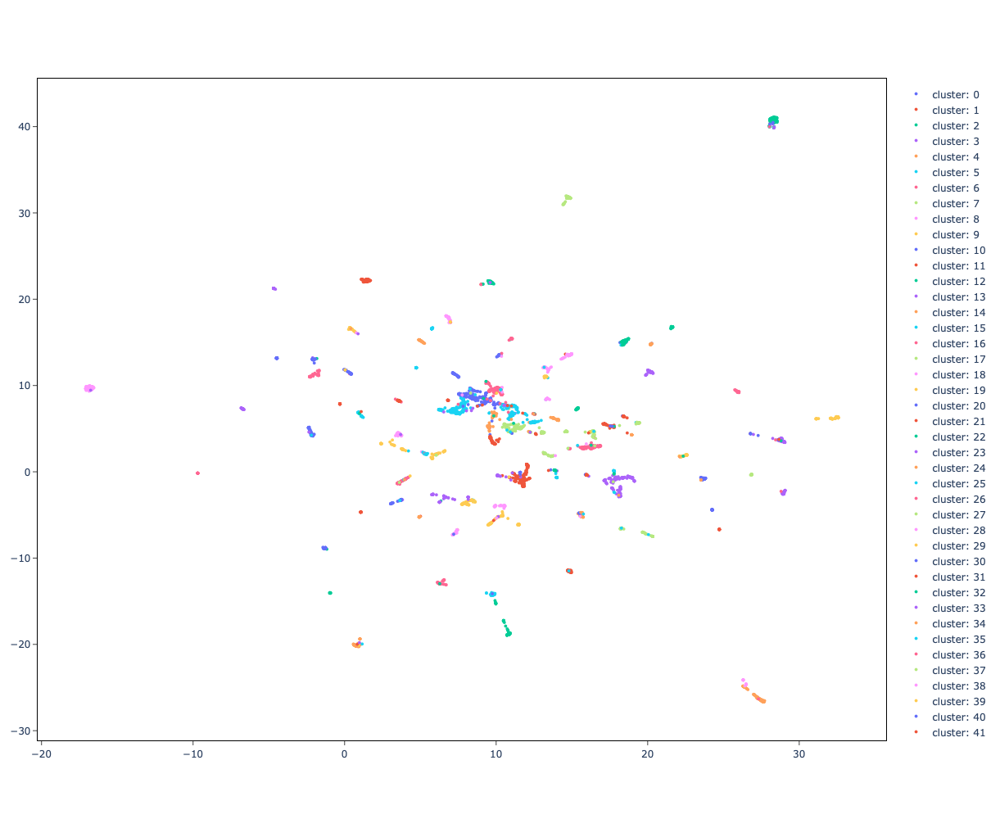

In [96]:
data = []

for cl in range(len(set(umapper["cluster"]))):
    deg = go.Scatter(name=f"cluster: {cl}",
            x=umapper[(umapper["cluster"]==f"{cl}")]["UMAP_1"],
            y=umapper[(umapper["cluster"]==f"{cl}")]["UMAP_2"],
            customdata=umapper[(umapper["cluster"]==f"{cl}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=4, color=0, showscale=False)
    )
    data.append(deg)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

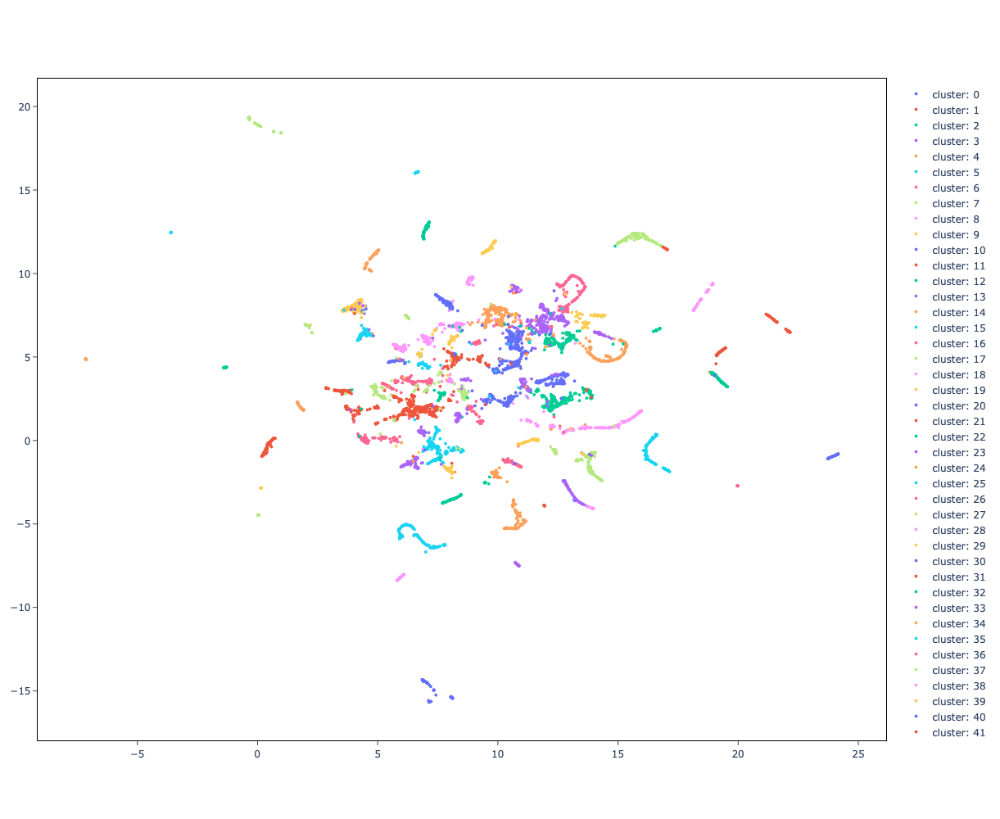

In [25]:
data = []

for cl in range(len(set(umapper["cluster"]))):
    deg = go.Scatter(name=f"cluster: {cl}",
            x=umapper[(umapper["cluster"]==f"{cl}")]["UMAP_1"],
            y=umapper[(umapper["cluster"]==f"{cl}")]["UMAP_2"],
            customdata=umapper[(umapper["cluster"]==f"{cl}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=4, color=0, showscale=False)
    )
    data.append(deg)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

In [169]:
tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)  # n_jobs=-1 to use all processors
tsne_results = tsne.fit_transform(deg_components)
tsne_df = pd.DataFrame(tsne_results, columns=['t-SNE_1', 't-SNE_2'])
tsne_df["name"] = list(df.index)
tsne_df["cluster"] = cluster_assignment.astype(int)
tsne_df = tsne_df.sort_values("cluster")
tsne_df["cluster"] = tsne_df["cluster"].astype(str)

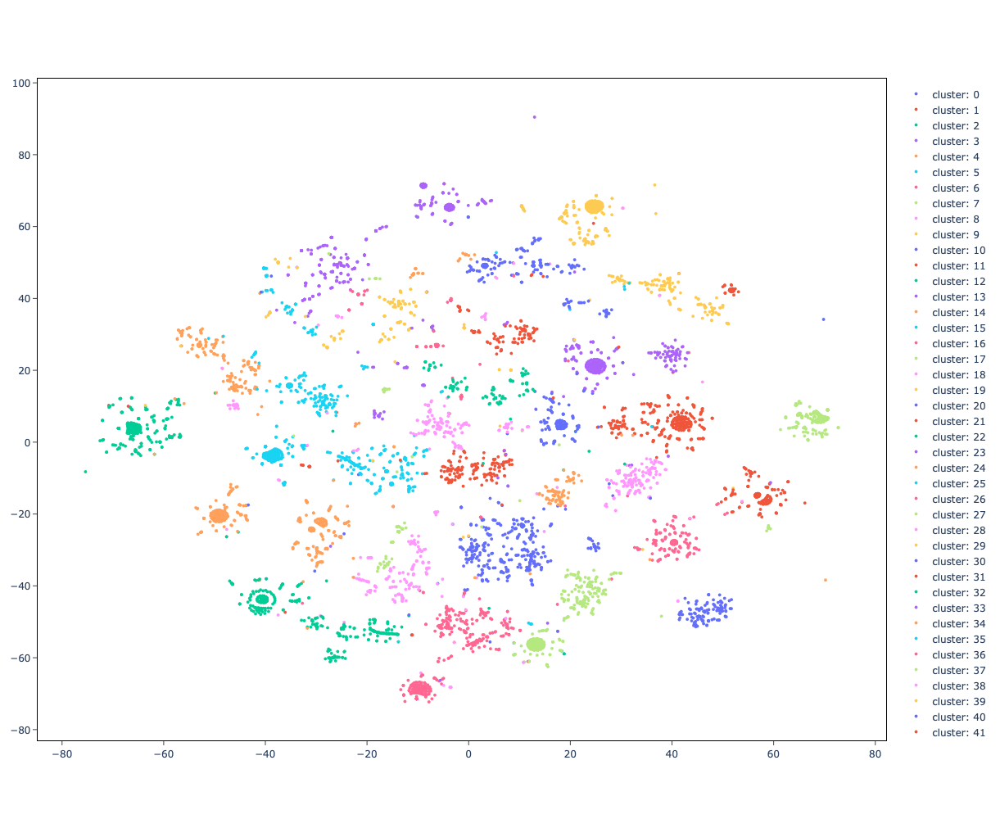

In [170]:
data = []

for cl in range(len(set(tsne_df["cluster"]))):
    deg = go.Scatter(name=f"cluster: {cl}",
            x=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_1"],
            y=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_2"],
            customdata=tsne_df[(tsne_df["cluster"]==f"{cl}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=4, color=0, showscale=False)
    )
    data.append(deg)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

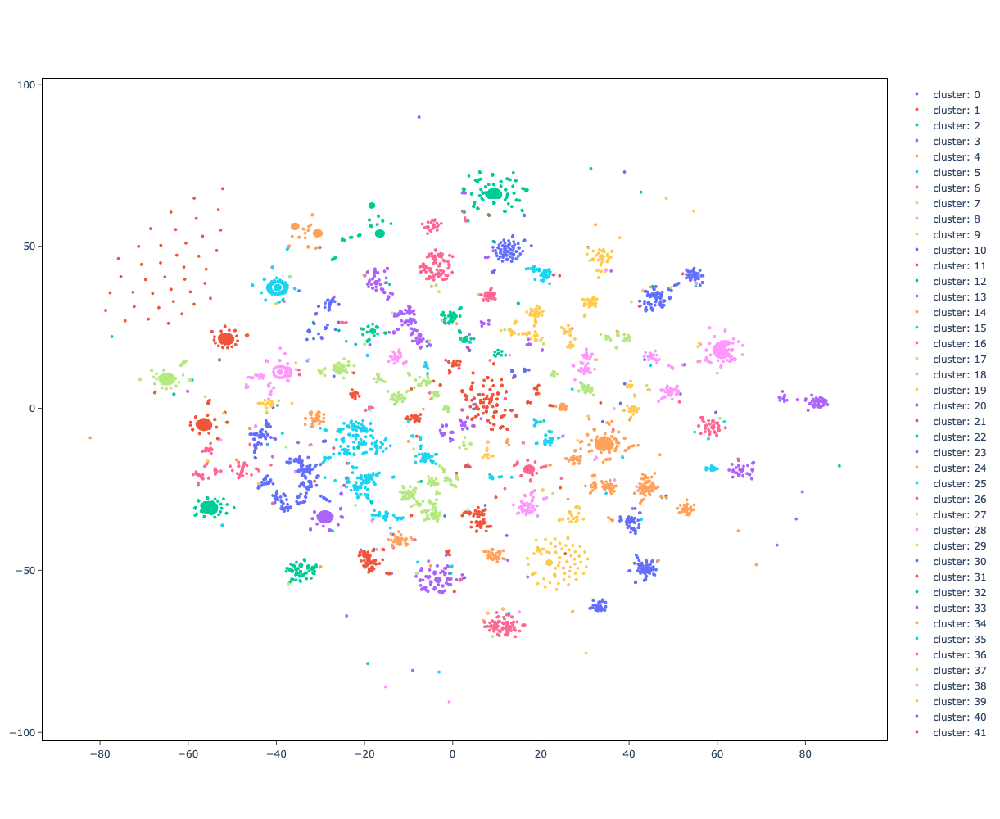

In [98]:
data = []

for cl in range(len(set(tsne_df["cluster"]))):
    deg = go.Scatter(name=f"cluster: {cl}",
            x=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_1"],
            y=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_2"],
            customdata=tsne_df[(tsne_df["cluster"]==f"{cl}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=4, color=0, showscale=False)
    )
    data.append(deg)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

### ko

In [99]:
temp_df = df.copy(deep=True)

In [100]:
for column in temp_df.columns: 
    temp_df[column] = temp_df[column] / temp_df[column].abs().max()       

In [101]:
pca = PCA(n_components=20, svd_solver='full')
ko_components = np.transpose(pca.fit(temp_df).components_)

In [102]:
ko_distances = []
for en, ko_1 in enumerate(ko_components):
    print(en)
    temp = [0 for i in range(en)]
    for ko_2 in ko_components[en:]:
        temp.append(np.linalg.norm(ko_1 - ko_2))
    ko_distances.append(temp)
ko_distances = pd.DataFrame(ko_distances)
ko_distances = ko_distances + ko_distances.T
ko_distances = ko_distances + np.diag(np.ones(len(ko_distances))*10)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253


In [103]:
ko_distances

,0,1,2,3,4,5,6,7,8,9,...,244,245,246,247,248,249,250,251,252,253
0,10.000000,0.118431,0.075522,0.085577,0.035431,0.143356,0.046733,0.118653,0.040814,8.557661e-02,...,0.120535,0.061058,0.128939,0.072993,0.064115,0.146387,0.180784,0.216035,0.141231,0.077102
1,0.118431,10.000000,0.133529,0.074288,0.110175,0.071152,0.097654,0.027397,0.101464,7.428752e-02,...,0.011373,0.085280,0.075074,0.076742,0.095522,0.034519,0.200013,0.233142,0.166440,0.073506
2,0.075522,0.133529,10.000000,0.095555,0.089604,0.134174,0.071960,0.136691,0.069376,9.555500e-02,...,0.134937,0.079340,0.144159,0.107068,0.076252,0.156995,0.208298,0.208455,0.150646,0.090909
3,0.085577,0.074288,0.095555,10.000000,0.077013,0.094336,0.055664,0.083388,0.063091,5.408323e-16,...,0.075114,0.035782,0.113259,0.083705,0.052356,0.094525,0.206818,0.205287,0.130775,0.018991
4,0.035431,0.110175,0.089604,0.077013,10.000000,0.144519,0.039034,0.110996,0.038050,7.701313e-02,...,0.112489,0.049633,0.115168,0.067006,0.049267,0.140513,0.176545,0.217099,0.131889,0.066504
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,0.146387,0.034519,0.156995,0.094525,0.140513,0.060313,0.127355,0.050353,0.131303,9.452528e-02,...,0.034353,0.113022,0.094553,0.107492,0.125372,10.000000,0.219231,0.247107,0.180080,0.095958
250,0.180784,0.200013,0.208298,0.206818,0.176545,0.230325,0.185962,0.193890,0.181693,2.068184e-01,...,0.201071,0.196104,0.173057,0.164352,0.192618,0.219231,10.000000,0.288368,0.210582,0.202487
251,0.216035,0.233142,0.208455,0.205287,0.217099,0.249514,0.208869,0.236828,0.210169,2.052872e-01,...,0.233692,0.199300,0.247714,0.225731,0.210365,0.247107,0.288368,10.000000,0.257579,0.207762
252,0.141231,0.166440,0.150646,0.130775,0.131889,0.170685,0.131089,0.167474,0.132295,1.307753e-01,...,0.166979,0.129412,0.156094,0.148964,0.130361,0.180080,0.210582,0.257579,10.000000,0.125057


In [104]:
closest_neighbors = []
for ar in ko_distances.to_numpy():
    closest_neighbors.append( np.argsort(ar)[:10] )

In [105]:
g = ig.Graph(directed=False)
g.add_vertices(len(closest_neighbors))
for en, nn in enumerate(closest_neighbors):
    print(en)
    for neigh in nn:
        g.add_edges([(en,neigh)])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253


In [106]:
partition = la.find_partition(g, la.ModularityVertexPartition, n_iterations=-1)
cluster_assignment = np.zeros(len(ko_components))

for en, cl in enumerate(partition):
    for i in cl:
        cluster_assignment[i] = en

In [107]:
umapper = umap.UMAP().fit(ko_components)
umapper = pd.DataFrame(umapper.embedding_, columns=['UMAP_1', 'UMAP_2'])
umapper["name"] = list(df.columns)
umapper["cluster"] = cluster_assignment.astype(int)
umapper = umapper.sort_values("cluster")
umapper["cluster"] = umapper["cluster"].astype(str)

In [140]:
umapper["ct"] = ["_".join(i.split("_")[:-1]) for i in umapper["name"]]
umapper["day"] = [i.split("_")[0] for i in umapper["name"]]

In [141]:
umapper

,UMAP_1,UMAP_2,name,cluster,ct,day
126,-2.708130,0.224952,D11_sample_J_pp2_GATA6het,0,D11_sample_J_pp2,D11
34,-0.766712,-0.079161,D3_sample_H_de2_NKX6-1,0,D3_sample_H_de2,D3
37,-1.915383,-0.254830,D3_sample_H_de2_PAX6,0,D3_sample_H_de2,D3
222,-0.639296,0.494356,D18_sample_L_scec_NKX6-1,0,D18_sample_L_scec,D18
133,-1.284322,0.079112,D11_sample_J_pp2_ONECUT1e,0,D11_sample_J_pp2,D11
...,...,...,...,...,...,...
209,-2.828257,6.242603,D18_sample_L_scdelta_FOXA1,7,D18_sample_L_scdelta,D18
187,-3.821735,6.071772,D18_sample_L_scalpha_ONECUT1e,7,D18_sample_L_scalpha,D18
58,-2.879315,6.234437,D7_sample_I_pfg1_HHEXe,7,D7_sample_I_pfg1,D7
10,-3.068807,5.878637,D3_sample_H_de1_PROSER1,7,D3_sample_H_de1,D3


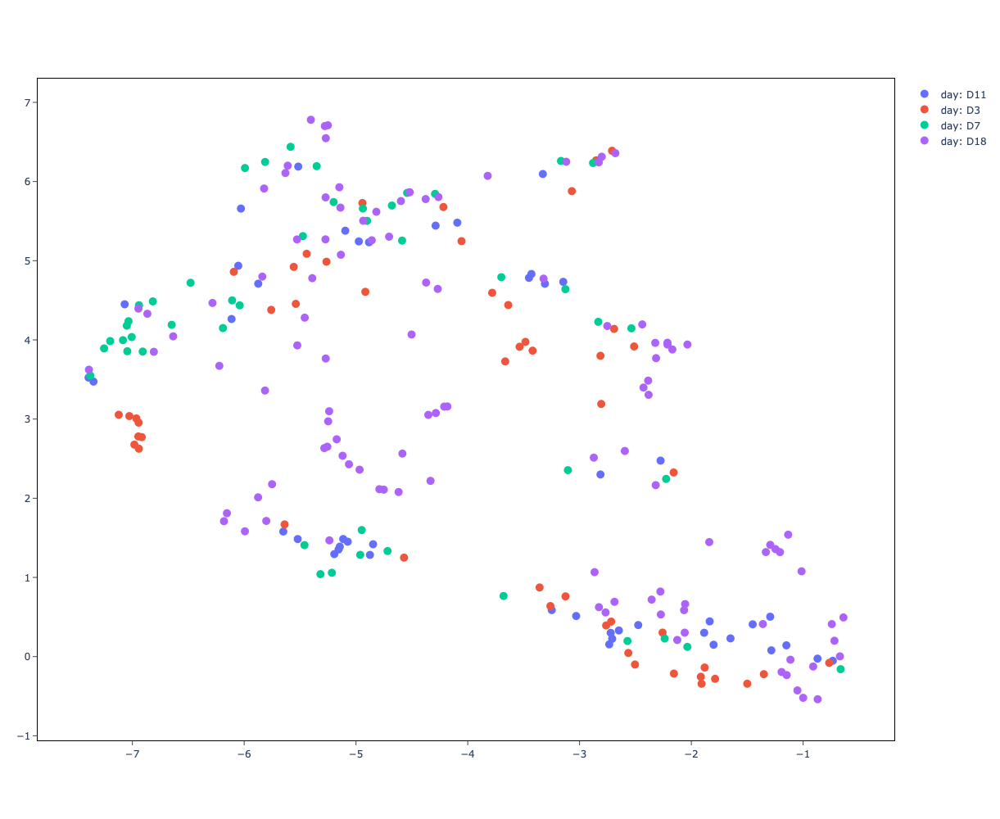

In [142]:
data = []

for en, day in enumerate(set(umapper["day"])):
    ko = go.Scatter(name=f"day: {day}",
            x=umapper[(umapper["day"]==f"{day}")]["UMAP_1"],
            y=umapper[(umapper["day"]==f"{day}")]["UMAP_2"],
            customdata=umapper[(umapper["day"]==f"{day}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=10, color=0, showscale=False)
    )
    data.append(ko)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

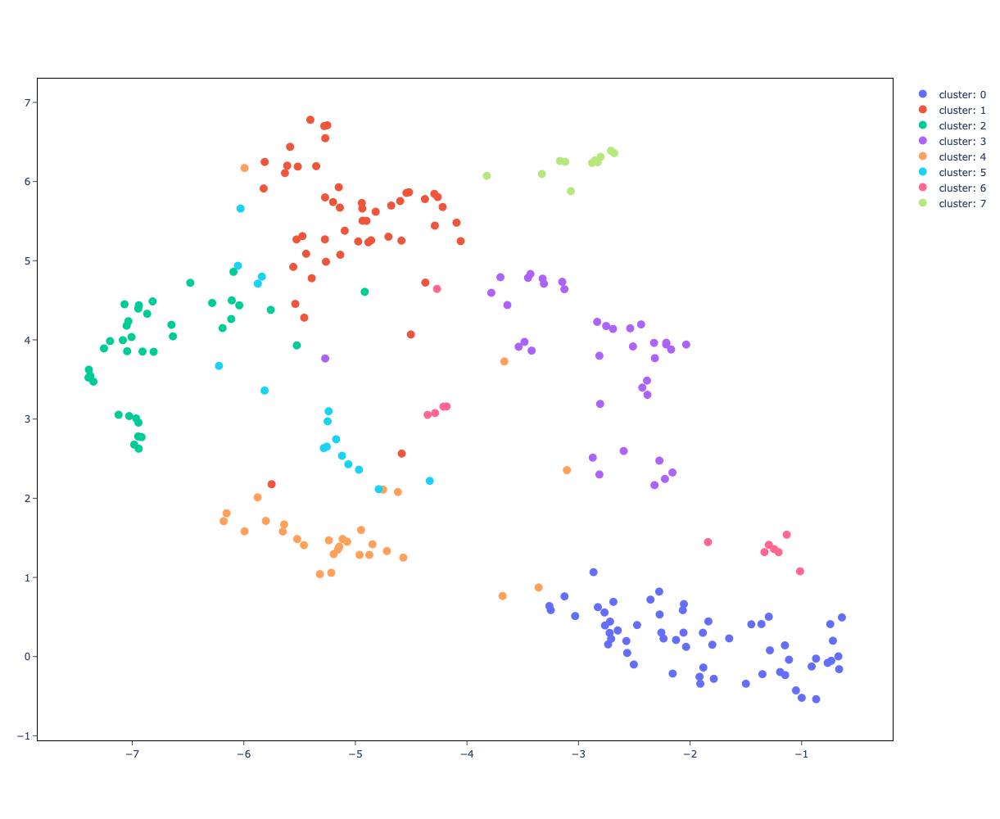

In [139]:
data = []

for cl in range(len(set(umapper["cluster"]))):
    ko = go.Scatter(name=f"cluster: {cl}",
            x=umapper[(umapper["cluster"]==f"{cl}")]["UMAP_1"],
            y=umapper[(umapper["cluster"]==f"{cl}")]["UMAP_2"],
            customdata=umapper[(umapper["cluster"]==f"{cl}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=10, color=0, showscale=False)
    )
    data.append(ko)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

In [135]:
pca_df = pd.DataFrame(np.transpose(np.transpose(ko_components)[:2]), columns=['PCA_1', 'PCA_2'])
pca_df["name"] = list(df.columns)
pca_df["cluster"] = cluster_assignment.astype(int)
pca_df = pca_df.sort_values("cluster")
pca_df["cluster"] = pca_df["cluster"].astype(str)
pca_df["ct"] = ["_".join(i.split("_")[:-1]) for i in pca_df["name"]]
pca_df["day"] = [i.split("_")[0] for i in pca_df["name"]]

In [136]:
pca_df

,PCA_1,PCA_2,name,cluster,ct,day
126,-0.032674,-0.011233,D11_sample_J_pp2_GATA6het,0,D11_sample_J_pp2,D11
34,-0.036249,-0.010324,D3_sample_H_de2_NKX6-1,0,D3_sample_H_de2,D3
37,-0.029174,-0.005179,D3_sample_H_de2_PAX6,0,D3_sample_H_de2,D3
222,-0.045481,0.005078,D18_sample_L_scec_NKX6-1,0,D18_sample_L_scec,D18
133,-0.036997,-0.011017,D11_sample_J_pp2_ONECUT1e,0,D11_sample_J_pp2,D11
...,...,...,...,...,...,...
209,-0.001977,0.002647,D18_sample_L_scdelta_FOXA1,7,D18_sample_L_scdelta,D18
187,-0.009414,-0.001889,D18_sample_L_scalpha_ONECUT1e,7,D18_sample_L_scalpha,D18
58,-0.001101,0.002770,D7_sample_I_pfg1_HHEXe,7,D7_sample_I_pfg1,D7
10,-0.005045,-0.000006,D3_sample_H_de1_PROSER1,7,D3_sample_H_de1,D3


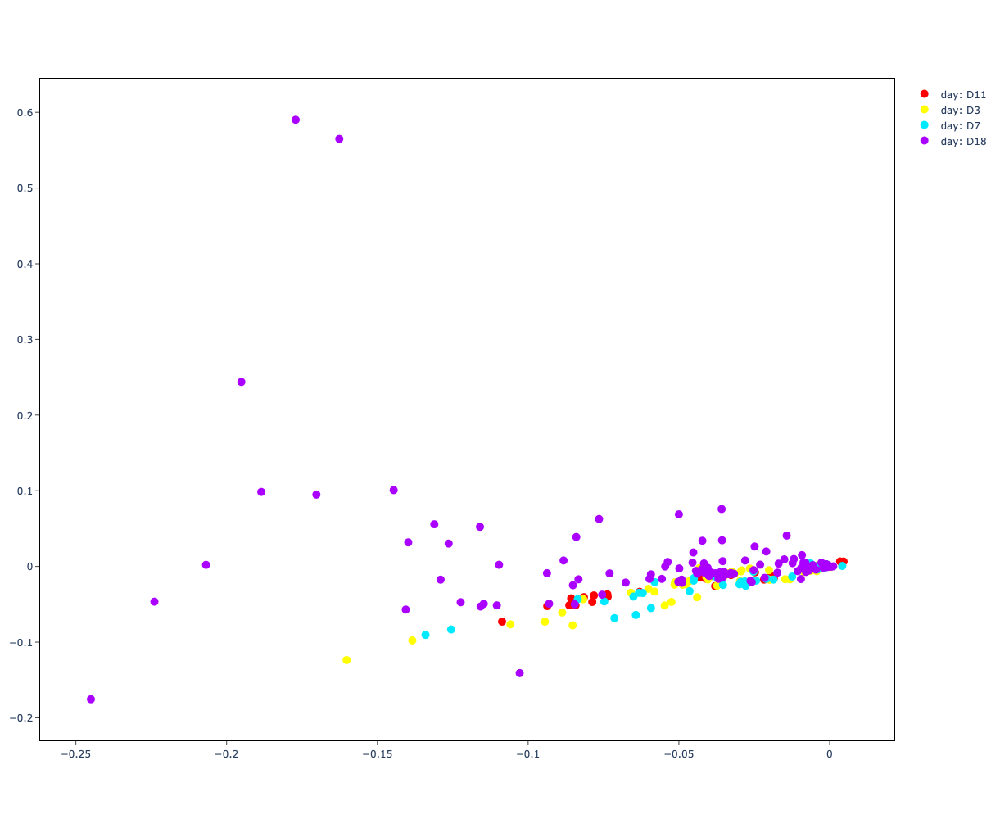

In [138]:
colors = ["#FF0000", "#FFFF00", "#00EAFF", "#AA00FF", "#FF7F00", "#BFFF00", "#0095FF", "#FF00AA", "#FFD400", "#6AFF00", 
          "#0040FF", "#EDB9B9", "#B9D7ED", "#E7E9B9", "#DCB9ED", "#B9EDE0", "#8F2323", "#23628F", "#8F6A23", "#6B238F", 
          "#4F8F23"]
data = []

for en, day in enumerate(set(pca_df["day"])):
    ko = go.Scatter(name=f"day: {day}",
            x=pca_df[(pca_df["day"]==f"{day}")]["PCA_1"],
            y=pca_df[(pca_df["day"]==f"{day}")]["PCA_2"],
            customdata=pca_df[(pca_df["day"]==f"{day}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=10, color=colors[en], showscale=False)
    )
    data.append(ko)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

In [110]:
tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)  # n_jobs=-1 to use all processors
tsne_results = tsne.fit_transform(ko_components)
tsne_df = pd.DataFrame(tsne_results, columns=['t-SNE_1', 't-SNE_2'])
tsne_df["name"] = list(df.columns)
tsne_df["cluster"] = cluster_assignment.astype(int)
tsne_df = tsne_df.sort_values("cluster")
tsne_df["cluster"] = tsne_df["cluster"].astype(str)

In [124]:
tsne_df["ct"] = ["_".join(i.split("_")[:-1]) for i in tsne_df["name"]]
tsne_df["day"] = [i.split("_")[0] for i in tsne_df["name"]]

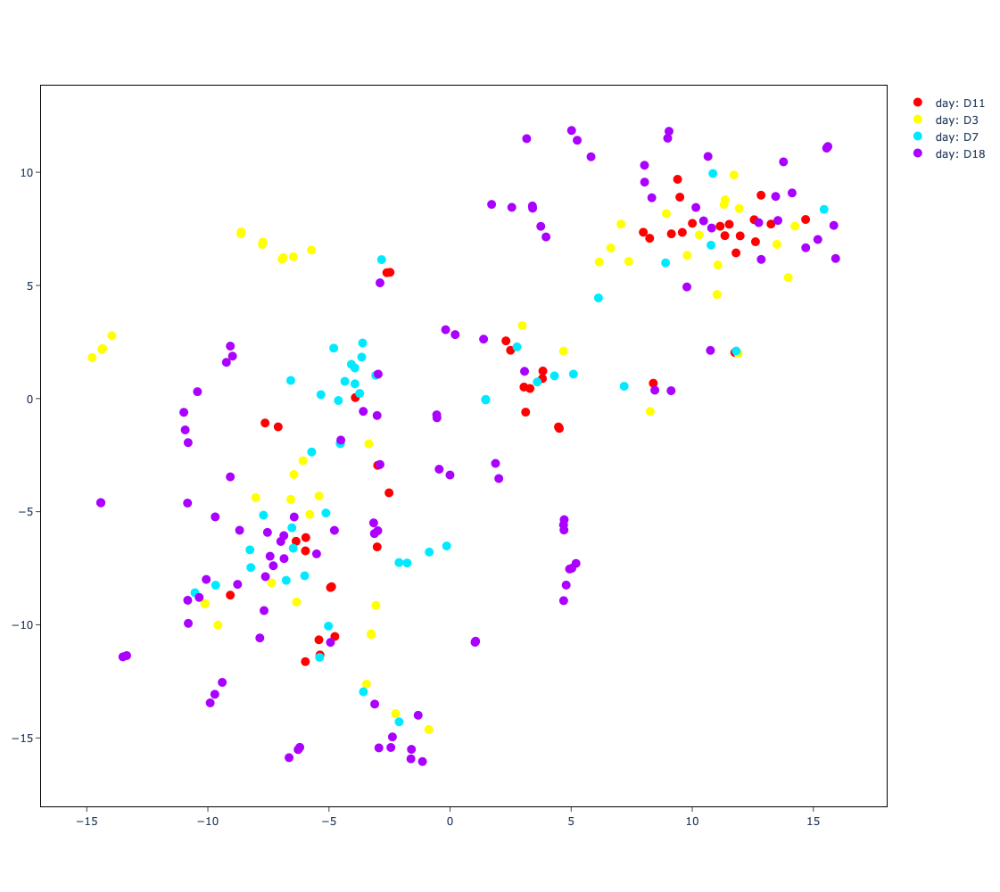

In [126]:
colors = ["#FF0000", "#FFFF00", "#00EAFF", "#AA00FF", "#FF7F00", "#BFFF00", "#0095FF", "#FF00AA", "#FFD400", "#6AFF00", 
          "#0040FF", "#EDB9B9", "#B9D7ED", "#E7E9B9", "#DCB9ED", "#B9EDE0", "#8F2323", "#23628F", "#8F6A23", "#6B238F", 
          "#4F8F23"]
data = []

for en, day in enumerate(set(tsne_df["day"])):
    ko = go.Scatter(name=f"day: {day}",
            x=tsne_df[(tsne_df["day"]==f"{day}")]["t-SNE_1"],
            y=tsne_df[(tsne_df["day"]==f"{day}")]["t-SNE_2"],
            customdata=tsne_df[(tsne_df["day"]==f"{day}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=10, color=colors[en], showscale=False)
    )
    data.append(ko)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

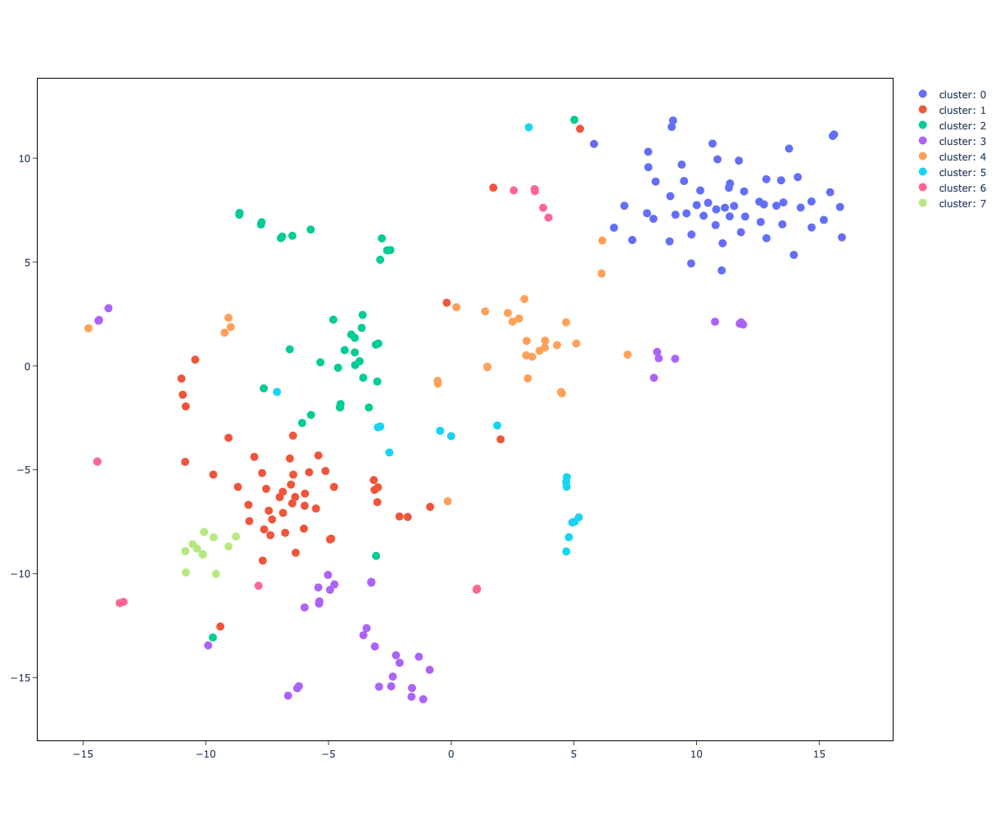

In [122]:
data = []

for cl in range(len(set(tsne_df["cluster"]))):
    ko = go.Scatter(name=f"cluster: {cl}",
            x=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_1"],
            y=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_2"],
            customdata=tsne_df[(tsne_df["cluster"]==f"{cl}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=10, color=0, showscale=False)
    )
    data.append(ko)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

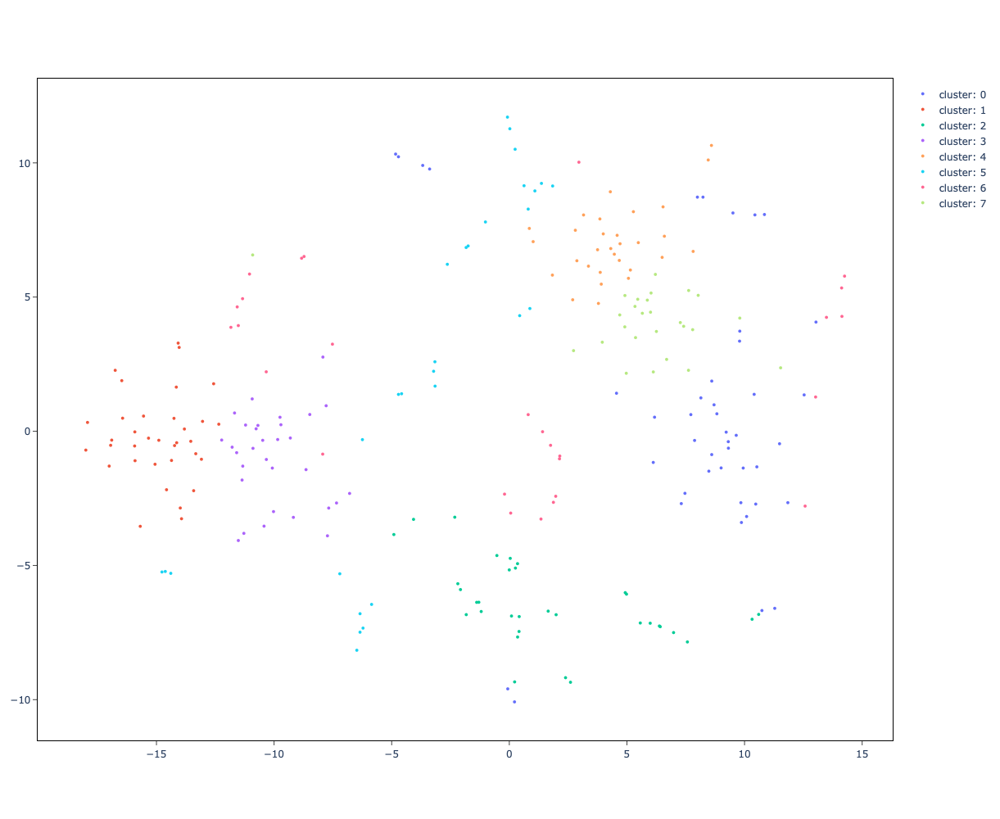

In [40]:
data = []

for cl in range(len(set(tsne_df["cluster"]))):
    ko = go.Scatter(name=f"cluster: {cl}",
            x=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_1"],
            y=tsne_df[(tsne_df["cluster"]==f"{cl}")]["t-SNE_2"],
            customdata=tsne_df[(tsne_df["cluster"]==f"{cl}")],
            hovertemplate='<b>name: %{customdata[2]}</b> <br>cluster: %{customdata[3]}',
            mode="markers",
            marker=dict(size=4, color=0, showscale=False)
    )
    data.append(ko)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    xaxis=go.layout.XAxis(linecolor="black", linewidth=1, mirror=True),
    yaxis=go.layout.YAxis(linecolor="black", linewidth=1, mirror=True),
    margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
)

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    plot_bgcolor='white'
)
fig.update_xaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
fig.update_yaxes(
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='white'
)
#pyo.plot(fig, filename=f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.html')
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters_gray.pdf', scale = 4)
#fig.write_image(f'/lila/home/fabihat/msk_labwork/20231112_dingyu/{name}_clusters.png', scale = 4)

In [68]:
deg_programs = deg_components
deg_programs = pd.DataFrame(deg_programs)
deg_programs.columns = [f"PCA_{i}" for i in range(deg_programs.shape[1])]

In [73]:
deg_programs

,PCA_0,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,...,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,PCA_49
0,0.003867,0.003353,-0.020044,-0.013602,0.022231,-0.012887,0.004098,-0.003570,-0.007020,0.009558,...,-0.040538,0.018039,0.043488,0.007040,-0.036925,-0.001567,-0.000646,-0.002380,-0.002200,0.000135
1,-0.011795,-0.000217,-0.010626,0.005088,-0.017014,-0.001849,0.055180,0.013680,0.001846,0.011306,...,0.021494,-0.016495,0.004135,-0.000533,0.018985,0.012357,-0.005945,0.015059,-0.002051,-0.000574
2,0.012286,-0.001200,0.000749,0.024045,0.004880,0.012577,-0.001782,-0.004587,-0.015578,0.005433,...,-0.001890,-0.003958,0.000365,-0.001384,0.000045,-0.001027,0.002887,0.001402,-0.002324,0.001698
3,-0.007302,-0.000376,-0.002823,0.006567,-0.004919,0.001949,-0.006591,-0.001600,0.000381,-0.001093,...,0.000593,0.000174,0.000503,0.000283,-0.000654,0.000183,-0.000412,-0.000665,-0.000064,0.000195
4,-0.005221,-0.000252,-0.000661,0.005698,0.004191,-0.001525,-0.004927,-0.002897,-0.001403,-0.006129,...,-0.000352,-0.000509,0.000277,0.003428,0.001631,0.001749,0.001547,0.004199,-0.003666,0.004743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7135,-0.001451,-0.000705,0.002470,0.000966,-0.001707,0.001180,0.004482,0.000814,-0.000286,-0.000386,...,-0.003442,0.001082,0.002347,-0.005811,-0.004365,-0.008640,0.002458,0.000687,0.002910,-0.001766
7136,-0.000109,0.000112,-0.000358,-0.000168,0.000316,-0.002122,-0.000231,-0.000438,-0.000013,-0.000804,...,-0.001685,0.000075,0.005395,0.004531,0.002647,0.000100,-0.000231,-0.004632,0.001718,-0.001956
7137,0.006974,-0.000644,0.013038,-0.005674,0.002492,0.003482,-0.000534,0.002353,-0.006137,0.008246,...,-0.008694,-0.010453,0.010290,0.003203,0.003629,0.001926,0.005150,-0.000876,-0.001868,0.000888
7138,-0.000304,-0.001077,0.007681,0.002295,-0.004106,0.014574,0.003922,0.000999,0.001549,-0.002562,...,0.003956,0.001196,0.001107,0.055750,-0.002691,0.012987,0.013141,-0.006449,0.025130,0.006023


In [69]:
A,S,W = ica1(df.to_numpy(), 15)

In [70]:
A.shape, S.shape, W.shape

((7140, 15), (15, 254), (15, 15))

In [74]:
ica_deg_programs = pd.DataFrame(A)
ica_deg_programs.columns = [f"ICA_{i}" for i in range(ica_deg_programs.shape[1])]

In [75]:
ica_deg_programs

,ICA_0,ICA_1,ICA_2,ICA_3,ICA_4,ICA_5,ICA_6,ICA_7,ICA_8,ICA_9,ICA_10,ICA_11,ICA_12,ICA_13,ICA_14
0,0.009924,-0.011908,0.000160,-0.006147,-0.142973,-0.004567,0.022195,0.007204,0.033697,0.028830,0.108035,-0.007533,0.057853,0.000362,0.002972
1,0.017401,0.038196,-0.073181,0.056554,-0.014882,0.159756,0.056370,-0.000730,-0.125498,-0.056618,0.000811,0.046192,0.046791,-0.000383,0.035774
2,-0.000464,-0.002617,0.000200,0.002588,-0.002783,-0.000120,-0.009453,0.000051,-0.001656,0.000577,-0.000126,-0.149978,0.002558,0.000107,0.000105
3,-0.000096,-0.001269,-0.000305,-0.002129,0.000523,0.000353,-0.001087,-0.000026,-0.001104,0.001292,-0.031315,-0.000113,-0.000057,0.000053,0.049831
4,-0.004611,-0.001968,-0.001891,-0.011677,0.001290,-0.003341,0.002412,-0.000459,0.000323,0.007294,-0.000549,0.001917,-0.035282,-0.000140,0.036022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7135,0.004862,0.018086,0.001461,0.019431,0.003530,0.002676,0.006049,0.001906,-0.005982,-0.020437,-0.001988,0.002574,-0.002468,-0.002056,0.001678
7136,-0.001631,0.001619,0.000100,0.003032,-0.014852,0.000062,0.004988,0.000646,0.000410,0.000706,-0.000881,-0.000242,-0.000391,-0.000132,0.000143
7137,0.000504,0.012408,-0.006975,-0.016848,0.010994,-0.001817,-0.047099,-0.000537,0.002998,-0.039599,0.005214,-0.002575,-0.015743,0.000877,-0.060714
7138,-0.004866,0.025844,0.003128,0.026558,0.079376,-0.010980,-0.005719,0.001014,0.006569,-0.035583,-0.001658,-0.002599,-0.010010,0.000265,-0.003222


In [78]:
programs = pd.concat([deg_programs, ica_deg_programs], axis=1)

In [79]:
programs

,PCA_0,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,...,ICA_5,ICA_6,ICA_7,ICA_8,ICA_9,ICA_10,ICA_11,ICA_12,ICA_13,ICA_14
0,0.003867,0.003353,-0.020044,-0.013602,0.022231,-0.012887,0.004098,-0.003570,-0.007020,0.009558,...,-0.004567,0.022195,0.007204,0.033697,0.028830,0.108035,-0.007533,0.057853,0.000362,0.002972
1,-0.011795,-0.000217,-0.010626,0.005088,-0.017014,-0.001849,0.055180,0.013680,0.001846,0.011306,...,0.159756,0.056370,-0.000730,-0.125498,-0.056618,0.000811,0.046192,0.046791,-0.000383,0.035774
2,0.012286,-0.001200,0.000749,0.024045,0.004880,0.012577,-0.001782,-0.004587,-0.015578,0.005433,...,-0.000120,-0.009453,0.000051,-0.001656,0.000577,-0.000126,-0.149978,0.002558,0.000107,0.000105
3,-0.007302,-0.000376,-0.002823,0.006567,-0.004919,0.001949,-0.006591,-0.001600,0.000381,-0.001093,...,0.000353,-0.001087,-0.000026,-0.001104,0.001292,-0.031315,-0.000113,-0.000057,0.000053,0.049831
4,-0.005221,-0.000252,-0.000661,0.005698,0.004191,-0.001525,-0.004927,-0.002897,-0.001403,-0.006129,...,-0.003341,0.002412,-0.000459,0.000323,0.007294,-0.000549,0.001917,-0.035282,-0.000140,0.036022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7135,-0.001451,-0.000705,0.002470,0.000966,-0.001707,0.001180,0.004482,0.000814,-0.000286,-0.000386,...,0.002676,0.006049,0.001906,-0.005982,-0.020437,-0.001988,0.002574,-0.002468,-0.002056,0.001678
7136,-0.000109,0.000112,-0.000358,-0.000168,0.000316,-0.002122,-0.000231,-0.000438,-0.000013,-0.000804,...,0.000062,0.004988,0.000646,0.000410,0.000706,-0.000881,-0.000242,-0.000391,-0.000132,0.000143
7137,0.006974,-0.000644,0.013038,-0.005674,0.002492,0.003482,-0.000534,0.002353,-0.006137,0.008246,...,-0.001817,-0.047099,-0.000537,0.002998,-0.039599,0.005214,-0.002575,-0.015743,0.000877,-0.060714
7138,-0.000304,-0.001077,0.007681,0.002295,-0.004106,0.014574,0.003922,0.000999,0.001549,-0.002562,...,-0.010980,-0.005719,0.001014,0.006569,-0.035583,-0.001658,-0.002599,-0.010010,0.000265,-0.003222


## clustering

In [19]:
import matplotlib.colors

In [37]:
#cvals  = [-2, 0, 2]
#colors = ["blue","white","red"]

cvals = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
colors = ["#e6194B", "#3cb44b", "white","#4363d8","#f58231","#911eb4","#42d4f4","#f032e6","#bfef45","#fabed4","#469990"]#, "#dcbeff", "#800000", "#aaffc3", "#808000", "#ffd8b1", "#000075"]

norm=plt.Normalize(min(cvals),max(cvals))
tuples = list(zip(map(norm,cvals), colors))
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", tuples)

In [59]:
clustering = SpectralBiclustering(n_clusters=10, random_state=0).fit(df)

In [151]:
for cl in range(10):
    print(cl)
    temp = df.iloc[[i == cl for i in clustering.row_labels_],[i == cl for i in clustering.column_labels_]]
    print(list(set(temp.columns).intersection(set(top_df.columns))))
    print()
    print(list(set(temp.index).intersection(set(top_df.index))))
    print()
    print()

0
['D7_sample_I_pfg2_GATA4', 'D7_sample_I_pfg2_RFX6', 'D18_sample_L_scbeta_PDX1het', 'D18_sample_L_unk_PROSER1', 'D18_sample_L_scec_NEUROD1', 'D11_sample_J_pp2_TADA2B', 'D18_sample_L_scalpha_TET1', 'D18_sample_L_scec_PDX1', 'D18_sample_L_stromal_ARX', 'D7_sample_I_pfg2_QSER1TET1', 'D18_sample_L_scbeta_PDX1', 'D11_sample_J_pp2_ARX', 'D3_sample_H_de2_GLIS3', 'D3_sample_H_de2_KDM2B', 'D18_sample_L_scbeta_PROSER1', 'D3_sample_H_de2_ARX', 'D11_sample_J_ep_NKX2-2', 'D18_sample_L_scec_PBX1', 'D18_sample_L_none_GATA4', 'D7_sample_I_pfg2_BCOR', 'D7_sample_I_pfg2_TADA2B', 'D3_sample_H_de2_TET123', 'D7_sample_I_liver_FOXA2', 'D18_sample_L_none_TET1', 'D3_sample_H_de2_PDX1het', 'D18_sample_L_scec_ARX', 'D11_sample_J_pp1_PDX1', 'D18_sample_L_scec_PDX1het', 'D18_sample_L_none_ARX', 'D3_sample_H_de2_FOXA2', 'D11_sample_J_pp1_TADA2B', 'D11_sample_J_ep_ARX', 'D3_sample_H_de2_TADA2B', 'D3_sample_H_de1_FOXA2', 'D18_sample_L_none_QSER1', 'D3_sample_H_de2_GATA6']

['KCNJ16', 'SCN7A', 'PPP2R2B', 'NTN4', 'NE

In [35]:
fit_data = df.iloc[:,np.argsort(clustering.column_labels_)]
fit_data = fit_data.iloc[np.argsort(clustering.row_labels_)]

In [ ]:
#fig, ax = plt.subplots(figsize=(50,10))
#ax.matshow(fit_data, cmap=plt.cm.Blues)

plt.figure(figsize=(15,15))
plt.matshow(fit_data, cmap=cmap, fignum=1, aspect='auto')
plt.title("After biclustering; rearranged to show biclusters")

plt.show()

In [115]:
clustering = SpectralCoclustering(n_clusters=2, random_state=0).fit(df)

In [116]:
fit_data = df.iloc[:,np.argsort(clustering.column_labels_)]
fit_data = fit_data.iloc[np.argsort(clustering.row_labels_)]

In [ ]:
#fig, ax = plt.subplots(figsize=(50,10))
#ax.matshow(fit_data, cmap=plt.cm.Blues)

plt.figure(figsize=(15,15))
plt.matshow(fit_data, cmap=cmap, fignum=1, aspect='auto')
plt.title("After biclustering; rearranged to show biclusters")

plt.show()

## program comparison

In [37]:
prog_comparison = []
cols = ["vs", "sig-sig", "sig-nsig", "nsig-sig", "nsig-nsig", "or", "pval or"]
for en, c1 in enumerate(sorted(model_dfs.keys())):
    for c2 in sorted(model_dfs.keys())[en+1:]:
        temp = []
        
        all_feats = set(model_dfs[c1]["Feature"])
        li_1 = set(model_dfs[c1][model_dfs[c1]["P"]<0.05]["Feature"])
        li_2 = set(model_dfs[c2][model_dfs[c2]["P"]<0.05]["Feature"])
        
        temp.append(f"{c1}-{c2}")
        
        a = len(li_1.intersection(li_2))
        b = len(li_1 - li_2)
        c = len(li_2 - li_1)
        d = len(all_feats - li_1 - li_2)
        temp.extend([a,b,c,d])
        
        if a != 0 and b != 0 and c != 0 and d != 0:
            odds_r = (a*d)/(b*c)
            se = np.sqrt(1/a + 1/b + 1/c + 1/d)
            abs_z = np.abs(odds_r) / np.sqrt(1/a + 1/b + 1/c + 1/d)
            p = scipy.stats.norm.sf(abs_z)
        elif a == 0:
            odds_r = 1
            p = 1
        elif b == 0 and c == 0:
            odds_r = 0
            p = 0
        else:
            odds_r = 1
            p = 1
        temp.extend([odds_r, p])
        
        prog_comparison.append(temp)
prog_comparison = pd.DataFrame(prog_comparison)
prog_comparison.columns = cols

In [38]:
prog_comparison

,vs,sig-sig,sig-nsig,nsig-sig,nsig-nsig,or,pval or
0,magma_or-mody_or,48,28,75,279,6.377143,1.054015e-122
1,magma_or-ot_or,70,6,141,213,17.624113,0.000000e+00
2,mody_or-ot_or,103,20,108,199,9.489352,6.238737e-267


## ko comparison

In [39]:
ko_comparison = []
cols = ["vs", "sig-sig", "sig-nsig", "nsig-sig", "nsig-nsig", "or", "pval or"]
for en, c1 in enumerate(sorted(model_dfs.keys())):
    for c2 in sorted(model_dfs.keys())[en+1:]:
        temp = []
        
        all_feats = set(model_dfs[c1]["ko"])
        li_1 = set(model_dfs[c1][model_dfs[c1]["P"]<0.05]["ko"])
        li_2 = set(model_dfs[c2][model_dfs[c2]["P"]<0.05]["ko"])
        
        temp.append(f"{c1}-{c2}")
        
        a = len(li_1.intersection(li_2))
        b = len(li_1 - li_2)
        c = len(li_2 - li_1)
        d = len(all_feats - li_1 - li_2)
        temp.extend([a,b,c,d])
        
        if a != 0 and b != 0 and c != 0 and d != 0:
            odds_r = (a*d)/(b*c)
            se = np.sqrt(1/a + 1/b + 1/c + 1/d)
            abs_z = np.abs(odds_r) / np.sqrt(1/a + 1/b + 1/c + 1/d)
            p = scipy.stats.norm.sf(abs_z)
        elif a == 0:
            odds_r = 1
            p = 1
        elif b == 0 and c == 0:
            odds_r = 0
            p = 0
        else:
            odds_r = 1
            p = 1
        temp.extend([odds_r, p])
        
        ko_comparison.append(temp)
ko_comparison = pd.DataFrame(ko_comparison)
ko_comparison.columns = cols

In [40]:
ko_comparison

,vs,sig-sig,sig-nsig,nsig-sig,nsig-nsig,or,pval or
0,magma_or-mody_or,28,1,5,4,22.400000,9.993527e-76
1,magma_or-ot_or,29,0,6,3,1.000000,1.000000e+00
2,mody_or-ot_or,32,1,3,2,21.333333,2.533155e-55


## kos table

In [41]:
list(model_dfs.keys())

['magma_or', 'ot_or', 'mody_or']

In [42]:
all_kos = set(magma_or["ko"])

In [43]:
#mody_kos = [i for i in all_kos if i in mody]
dingyu_mody = ["GATA6", "PDX1", "GATA4", "FOXA2", "MNX1", "NEUROD1", "NKX2-2", "ONECUT1e", "RFX6", "HNF4A", "PAX6", "GLIS3", "NGN3"]
mody_kos = [i for i in all_kos if i in dingyu_mody]

#t2d_kos = [i for i in all_kos if i not in mody]
t2d_kos = [i for i in all_kos if i not in dingyu_mody]

In [44]:
subset_features = list(magma_or["Feature"])
all_kos = set(magma_or["ko"])
#mody_kos = [i for i in all_kos if i in mody]
dingyu_mody = ["GATA6", "PDX1", "GATA4", "FOXA2", "MNX1", "NEUROD1", "NKX2-2", "ONECUT1e", "RFX6", "HNF4A", "PAX6", "GLIS3", "NGN3"]
mody_kos = [i for i in all_kos if i in dingyu_mody]

#t2d_kos = [i for i in all_kos if i not in mody]
t2d_kos = [i for i in all_kos if i not in dingyu_mody]

cols = ["Feature", "ko", "ko-type", "ct", "day", "Prog MODY", "Prog MODY P", "Prog T2D", "Prog T2D P"]

#mono = ['mody_glm','mody_or','mody_combined']
mono = ['mody_or']
#poly = ['magma_reg','magma_glm','magma_or','magma_combined','ot_glm','ot_or','ot_combined',]
poly = ['magma_or','ot_or']
#poly = ['ot_or']

ko_df = []

for feat in subset_features:
    temp = [feat, feat.split("_")[-1], 'mody' if feat.split("_")[-1] in mody_kos else 't2d', feat.split("_")[-2], feat.split("_")[0]]
    
    mono_sig = []
    mono_pval = []
    for k in mono:
        mono_sig.append(True if model_dfs[k][model_dfs[k]["Feature"]==feat].iloc[0]["P"] < 0.05 else False)
        mono_pval.append(model_dfs[k][model_dfs[k]["Feature"]==feat].iloc[0]["P"])
    temp.append(any(mono_sig))
    temp.append(acat_test(mono_pval))
    
    poly_sig = []
    poly_pval = []
    for k in poly:
        poly_sig.append(True if model_dfs[k][model_dfs[k]["Feature"]==feat].iloc[0]["P"] < 0.05 else False)
        poly_pval.append(model_dfs[k][model_dfs[k]["Feature"]==feat].iloc[0]["P"])
    temp.append(any(poly_sig))
    temp.append(acat_test(poly_pval))
    
    
    ko_df.append(temp)
    
ko_df = pd.DataFrame(ko_df)
ko_df.columns = cols
ko_df["Prog MODY neglog10P"] = -np.log10(ko_df["Prog MODY P"].astype(float))
ko_df["Prog T2D neglog10P"] = -np.log10(ko_df["Prog T2D P"].astype(float))
ko_df["Prog MODY & T2D"] = ko_df["Prog MODY"] & ko_df["Prog T2D"]

Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-values are exactly 1.
Warn: p-va

In [45]:
ko_df

,Feature,ko,ko-type,ct,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P,Prog MODY & T2D
0,D3_sample_H_ARX,ARX,t2d,H,D3,False,0.056093,False,0.200602,1.251093,0.697664,False
1,D3_sample_H_BCOR,BCOR,t2d,H,D3,False,0.330895,False,1.000000,0.480310,-0.000000,False
2,D3_sample_H_BMPR1A,BMPR1A,t2d,H,D3,False,0.138100,False,0.174388,0.859807,0.758484,False
3,D3_sample_H_FOXA1,FOXA1,t2d,H,D3,False,1.000000,False,1.000000,-0.000000,-0.000000,False
4,D3_sample_H_FOXA2,FOXA2,mody,H,D3,False,0.410058,True,0.000106,0.387155,3.974074,False
...,...,...,...,...,...,...,...,...,...,...,...,...
425,D18_sample_L_unk_NKX6-1,NKX6-1,t2d,unk,D18,False,1.000000,False,1.000000,-0.000000,-0.000000,False
426,D18_sample_L_unk_PDX1,PDX1,mody,unk,D18,False,0.244184,False,0.126043,0.612284,0.899483,False
427,D18_sample_L_unk_PROSER1,PROSER1,t2d,unk,D18,False,0.062986,True,0.011619,1.200754,1.934843,False
428,D18_sample_L_unk_RFX6,RFX6,mody,unk,D18,False,0.222490,True,1.000000,0.652690,-0.000000,False


In [132]:
a = len(ko_df[(ko_df["day"]=="D18")&(ko_df["ko-type"]=="mody")&(ko_df["Prog MODY"]==True)])
b = len(ko_df[(ko_df["day"]=="D18")&(ko_df["ko-type"]=="mody")&(ko_df["Prog T2D"]==True)])
c = len(ko_df[(ko_df["day"]=="D18")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog MODY"]==True)])
d = len(ko_df[(ko_df["day"]=="D18")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog T2D"]==True)])

a, b, c, d

(14, 18, 8, 30)

In [46]:
ko_df[(ko_df["day"]=="D18")&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==True)]

,ko,ko-type,ct,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P
147,NKX2-2,mody,ep,D18,True,0.000021,True,0.003929,4.670835,2.405692
162,MNX1,mody,none,D18,True,0.000496,True,0.000028,3.304940,4.549450
168,ONECUT1e,mody,none,D18,True,0.048225,True,0.000548,1.316729,3.261507
176,RFX6,mody,none,D18,True,0.007044,True,0.000026,2.152156,4.587129
181,ARX,t2d,scalpha,D18,True,0.000493,True,0.062433,3.307055,1.204583
184,NEUROD1,mody,scalpha,D18,True,0.000004,True,0.045441,5.416552,1.342554
185,NKX2-2,mody,scalpha,D18,True,0.020157,True,0.000065,1.695579,4.187987
188,PBX1,t2d,scalpha,D18,True,0.015550,True,0.017110,1.808260,1.766755
189,PDX1,mody,scalpha,D18,True,0.049536,True,0.004943,1.305083,2.306007
191,QSER1TET1,t2d,scalpha,D18,True,0.030939,True,0.052522,1.509492,1.279661


In [47]:
ko_df[(ko_df["day"]=="D18")].groupby("ko").count()

,ko-type,ct,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P
ko,,,,,,,,,
ARX,5,5,5,5,5,5,5,5,5
BCOR,3,3,3,3,3,3,3,3,3
BMPR1A,1,1,1,1,1,1,1,1,1
FOXA1,8,8,8,8,8,8,8,8,8
FOXA2,2,2,2,2,2,2,2,2,2
GATA4,1,1,1,1,1,1,1,1,1
GATA4het,2,2,2,2,2,2,2,2,2
GATA6,1,1,1,1,1,1,1,1,1
GATA6het,3,3,3,3,3,3,3,3,3


In [48]:
ko_df[(ko_df["day"]=="D18")&(ko_df["ko-type"]=="mody")&(ko_df["Prog T2D"]==True)]

,ko,ko-type,ct,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P
147,NKX2-2,mody,ep,D18,True,0.000021,True,0.003929,4.670835,2.405692
156,GATA4,mody,none,D18,False,0.318762,True,0.011102,0.496534,1.954618
162,MNX1,mody,none,D18,True,0.000496,True,0.000028,3.304940,4.549450
165,NGN3,mody,none,D18,False,1.000000,True,0.040819,-0.000000,1.389140
168,ONECUT1e,mody,none,D18,True,0.048225,True,0.000548,1.316729,3.261507
172,PDX1,mody,none,D18,False,0.073900,True,0.000508,1.131358,3.294480
176,RFX6,mody,none,D18,True,0.007044,True,0.000026,2.152156,4.587129
183,MNX1,mody,scalpha,D18,False,0.068900,True,0.003209,1.161781,2.493682
184,NEUROD1,mody,scalpha,D18,True,0.000004,True,0.045441,5.416552,1.342554
185,NKX2-2,mody,scalpha,D18,True,0.020157,True,0.000065,1.695579,4.187987


In [49]:
(a*d)/(b*c)

2.9166666666666665

In [133]:
a = len(ko_df[(ko_df["day"]=="D11")&(ko_df["ko-type"]=="mody")&(ko_df["Prog MODY"]==True)])
b = len(ko_df[(ko_df["day"]=="D11")&(ko_df["ko-type"]=="mody")&(ko_df["Prog T2D"]==True)])
c = len(ko_df[(ko_df["day"]=="D11")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog MODY"]==True)])
d = len(ko_df[(ko_df["day"]=="D11")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog T2D"]==True)])

a, b, c, d

(4, 6, 3, 6)

In [134]:
(a*d)/(b*c)

1.3333333333333333

In [135]:
a = len(ko_df[(ko_df["day"]=="D7")&(ko_df["ko-type"]=="mody")&(ko_df["Prog MODY"]==True)])
b = len(ko_df[(ko_df["day"]=="D7")&(ko_df["ko-type"]=="mody")&(ko_df["Prog T2D"]==True)])
c = len(ko_df[(ko_df["day"]=="D7")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog MODY"]==True)])
d = len(ko_df[(ko_df["day"]=="D7")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog T2D"]==True)])

a, b, c, d

(2, 6, 5, 7)

In [136]:
(a*d)/(b*c)

0.4666666666666667

In [137]:
a = len(ko_df[(ko_df["day"]=="D3")&(ko_df["ko-type"]=="mody")&(ko_df["Prog MODY"]==True)])
b = len(ko_df[(ko_df["day"]=="D3")&(ko_df["ko-type"]=="mody")&(ko_df["Prog T2D"]==True)])
c = len(ko_df[(ko_df["day"]=="D3")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog MODY"]==True)])
d = len(ko_df[(ko_df["day"]=="D3")&(ko_df["ko-type"]=="t2d")&(ko_df["Prog T2D"]==True)])

a, b, c, d

(0, 3, 2, 4)

In [138]:
(a*d)/(b*c)

0.0

In [139]:
len(ko_df[(ko_df["ko-type"]=="mody")&(ko_df["Prog MODY"]==True)])

20

In [140]:
len(ko_df[(ko_df["ko-type"]=="mody")&(ko_df["Prog T2D"]==True)])

33

In [141]:
len(ko_df[(ko_df["ko-type"]=="t2d")&(ko_df["Prog MODY"]==True)])

18

In [142]:
len(ko_df[(ko_df["ko-type"]=="t2d")&(ko_df["Prog T2D"]==True)])

47

In [61]:
(20*47)/(33*18)

1.5824915824915824

## phewas plot

In [90]:
#name, t2d = "magma", magma_or
#name, t2d = "mody", mody_or
name, t2d = "opentargets", ot_or

#fdr_threshold = np.max(t2d[t2d["FDR-corrected P"] < 0.05]["P"])
fdr_threshold = 0.05/len(t2d)

t2d_d3 = t2d[t2d["Feature"].isin([i for i in prog_list if "D3" in i])].sort_values(["ct", "neglog10P"], ascending=[True, False]).reset_index(drop=True)
t2d_d7 = t2d[t2d["Feature"].isin([i for i in prog_list if "D7" in i])].sort_values(["ct", "neglog10P"], ascending=[True, False]).reset_index(drop=True)
t2d_d11 = t2d[t2d["Feature"].isin([i for i in prog_list if "D11" in i])].sort_values(["ct", "neglog10P"], ascending=[True, False]).reset_index(drop=True)
t2d_d18 = t2d[t2d["Feature"].isin([i for i in prog_list if "D18" in i])].sort_values(["ct", "neglog10P"], ascending=[True, False]).reset_index(drop=True)

ordered_labels = sorted(set(t2d_d3["ct"])) + sorted(set(t2d_d7["ct"])) + sorted(set(t2d_d11["ct"])) + sorted(set(t2d_d18["ct"]))
ordered_t2d = pd.concat([t2d_d3, t2d_d7, t2d_d11, t2d_d18])

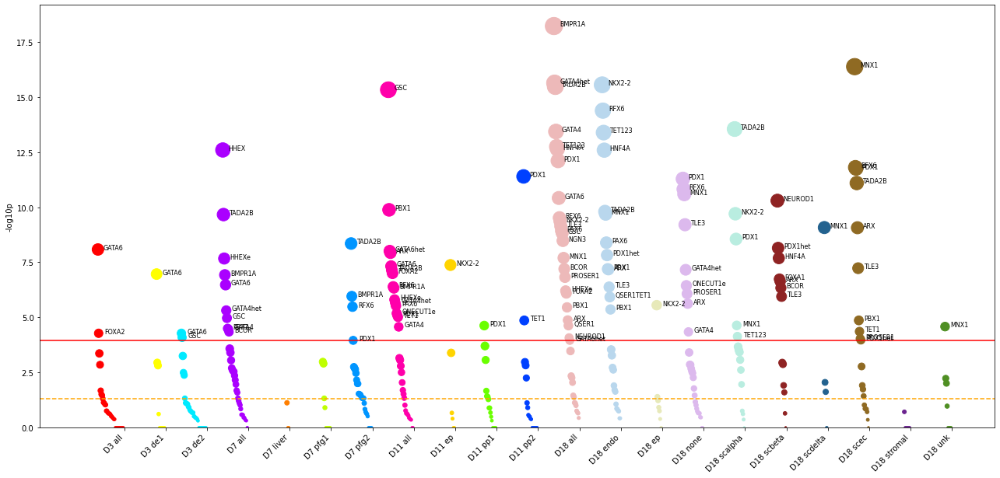

In [92]:
colors = ["#FF0000", "#FFFF00", "#00EAFF", "#AA00FF", "#FF7F00", "#BFFF00", "#0095FF", "#FF00AA", "#FFD400", "#6AFF00", 
          "#0040FF", "#EDB9B9", "#B9D7ED", "#E7E9B9", "#DCB9ED", "#B9EDE0", "#8F2323", "#23628F", "#8F6A23", "#6B238F", 
          "#4F8F23"]

fig = plt.figure(figsize =(22,10))
xtop_mids = []
#size_mult = 3.2
size_mult = 3
spacing = 60
annot_spacing = 8
annotfont_size = 8

counter = 0
for en, c in enumerate(ordered_labels):
    last_annot = []
    ct_df = ordered_t2d[ordered_t2d["ct"]==c]
    x_values = [i for i in range(spacing*counter, spacing*(counter+1))]
    y_values = list(ct_df["neglog10P"])
    y_values = [-1 for i in range(spacing-len(y_values))] + y_values
    ko_values = list(ct_df["ko"])
    ko_values = ["" for i in range(spacing-len(ko_values))] + ko_values
    plt.scatter(x_values, y_values, s=list((np.array(y_values)+0.2)*size_mult**size_mult), color=colors[en])
    for en, y in enumerate(y_values):
        if y >= -np.log10(fdr_threshold):
            plt.annotate(ko_values[en], (annot_spacing+x_values[en], y), fontsize=annotfont_size)
    mid = (ct_df.index[0] + ct_df.index[0]+len(ct_df))/2
    xtop_mids.append(spacing*(counter+1))
    counter += 1

plt.ylim(0)
plt.ylabel("-log10p")
plt.axhline(y = -np.log10(fdr_threshold), color = 'r', linestyle = '-') 
plt.axhline(y = -np.log10(0.05), color = 'orange', linestyle = '--') 
labels = ordered_labels
labels = [l if len(l.split("_")) > 3 else l+"_all" for l in labels]
labels = [l.split("_")[0]+" "+l.split("_")[-1] for l in labels]
plt.xticks(xtop_mids, labels, rotation=45, ha="right")
#plt.show()
plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_{name}_phewas_descending.png", bbox_inches="tight", dpi=900)

## double bar graph

In [143]:
len(ko_df[(ko_df["day"]=="D3")&(ko_df["Prog MODY"]==False)&(ko_df["Prog T2D"]==True)])

7

In [144]:
ko_df

,Feature,ko,ko-type,ct,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P
0,D3_sample_H_de1_ARX,ARX,t2d,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
1,D3_sample_H_de1_FOXA1,FOXA1,t2d,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
2,D3_sample_H_de1_FOXA2,FOXA2,mody,de1,D3,False,0.340168,True,0.033905,0.468307,1.469740
3,D3_sample_H_de1_GATA4,GATA4,mody,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
4,D3_sample_H_de1_GATA4het,GATA4het,t2d,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...
249,D18_sample_L_unk_NKX6-1,NKX6-1,t2d,unk,D18,False,1.000000,False,1.000000,-0.000000,-0.000000
250,D18_sample_L_unk_PDX1,PDX1,mody,unk,D18,False,0.354097,False,0.267039,0.450878,0.573425
251,D18_sample_L_unk_PROSER1,PROSER1,t2d,unk,D18,False,0.130572,False,0.098360,0.884151,1.007181
252,D18_sample_L_unk_RFX6,RFX6,mody,unk,D18,False,0.306884,False,1.000000,0.513026,-0.000000


In [145]:
len(ko_df[(ko_df["ko-type"]=="mody")&(ko_df["Prog MODY"]==True)])

20

In [146]:
len(ko_df[(ko_df["ko-type"]=="mody")&(ko_df["Prog T2D"]==True)])

33

In [147]:
len(ko_df[(ko_df["ko-type"]=="t2d")&(ko_df["Prog MODY"]==True)])

18

In [148]:
len(ko_df[(ko_df["ko-type"]=="t2d")&(ko_df["Prog T2D"]==True)])

47

In [149]:
(62*14)/(18*24)

2.009259259259259

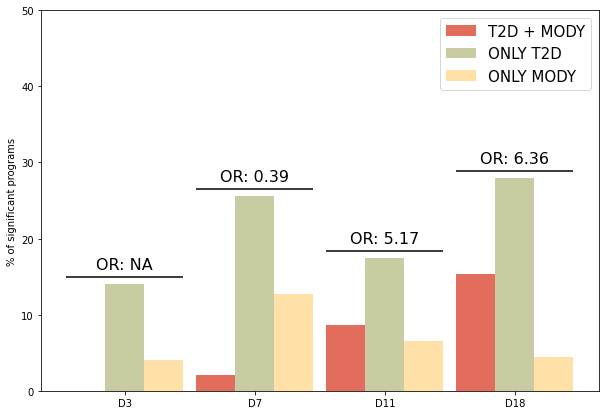

In [151]:
days = ["D3", "D7", "D11", "D18"]

poly_mono_prog = []
poly_prog = []
mono_prog = []
none_prog = []
for d in days:
    poly_mono_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==True)])/len(ko_df[(ko_df["day"]==d)]) *100)
    poly_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==False)&(ko_df["Prog T2D"]==True)])/len(ko_df[(ko_df["day"]==d)]) *100)
    mono_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==False)])/len(ko_df[(ko_df["day"]==d)]) *100)
    none_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==False)&(ko_df["Prog T2D"]==False)])/len(ko_df[(ko_df["day"]==d)]) *100)

fig = plt.figure(figsize=(10,7))
x_axis = np.arange(len(days))

plt.ylabel("% of significant programs")

b1 = plt.bar(x_axis - 0.3, poly_mono_prog, 0.3, label = 'T2D + MODY', color="#e26d5c", capsize=20) 
b2 = plt.bar(x_axis, poly_prog, 0.3, label = 'ONLY T2D', color="#c9cba3", capsize=20) 
b3 = plt.bar(x_axis + 0.3, mono_prog, 0.3, label = 'ONLY MODY', color="#ffe1a8", capsize=20)

targets = [poly_prog[i]+1 for i in range(4)]
x_start = [i-0.45 for i in range(4)]
x_end = [i+0.45 for i in range(4)]
plt.hlines(targets, x_start, x_end, color="black")

day_ors = (np.array(poly_mono_prog) * np.array(none_prog))/(np.array(poly_prog) * np.array(mono_prog))
for en, o in enumerate(day_ors):
    if en == 0:
        plt.annotate(f"OR: NA", (en, targets[en]+1), size=16, ha="center")
    else:
        plt.annotate(f"OR: {o:.2f}", (en, targets[en]+1), size=16, ha="center")

plt.ylim(0, 50)
plt.xticks(x_axis, days)
plt.legend(fontsize=15) 
#plt.show()
plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_or_plot.png", bbox_inches="tight", dpi=900)

In [192]:
ko_df[ko_df["day"]=="D18"].groupby("ct").count()

,Feature,ko,ko-type,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P,Prog MODY & T2D
ct,,,,,,,,,,,
ep,8,8,8,8,8,8,8,8,8,8,8
none,30,30,30,30,30,30,30,30,30,30,30
scalpha,15,15,15,15,15,15,15,15,15,15,15
scbeta,13,13,13,13,13,13,13,13,13,13,13
scdelta,5,5,5,5,5,5,5,5,5,5,5
scec,21,21,21,21,21,21,21,21,21,21,21
stromal,9,9,9,9,9,9,9,9,9,9,9
unk,10,10,10,10,10,10,10,10,10,10,10


In [258]:
d18_t2d_mody_count = ko_df[(ko_df["day"]=="D18")&(ko_df["Prog MODY & T2D"]==True)].groupby("ct").count()
d18_count = ko_df[(ko_df["day"]=="D18")].groupby("ct").count().loc[d18_t2d_mody_count.index]
d18_ct_t2d_mody_proportion = pd.DataFrame(d18_t2d_mody_count["ko"]/d18_count["ko"]).sort_values("ko", ascending=False)

d18_t2d_count = ko_df[(ko_df["day"]=="D18")&(ko_df["Prog T2D"]==True)&(ko_df["Prog MODY"]==False)].groupby("ct").count()
d18_count = ko_df[(ko_df["day"]=="D18")].groupby("ct").count().loc[d18_t2d_count.index]
d18_ct_t2d_proportion = pd.DataFrame(d18_t2d_count["ko"]/d18_count["ko"])

d18_mody_count = ko_df[(ko_df["day"]=="D18")&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==False)].groupby("ct").count()
d18_count = ko_df[(ko_df["day"]=="D18")].groupby("ct").count().loc[d18_mody_count.index]
d18_ct_mody_proportion = pd.DataFrame(d18_mody_count["ko"]/d18_count["ko"])

d18_count = ko_df[(ko_df["day"]=="D18")].groupby("ct").count()

In [263]:
d18_count

,Feature,ko,ko-type,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P,Prog MODY & T2D
ct,,,,,,,,,,,
ep,8,8,8,8,8,8,8,8,8,8,8
none,30,30,30,30,30,30,30,30,30,30,30
scalpha,15,15,15,15,15,15,15,15,15,15,15
scbeta,13,13,13,13,13,13,13,13,13,13,13
scdelta,5,5,5,5,5,5,5,5,5,5,5
scec,21,21,21,21,21,21,21,21,21,21,21
stromal,9,9,9,9,9,9,9,9,9,9,9
unk,10,10,10,10,10,10,10,10,10,10,10


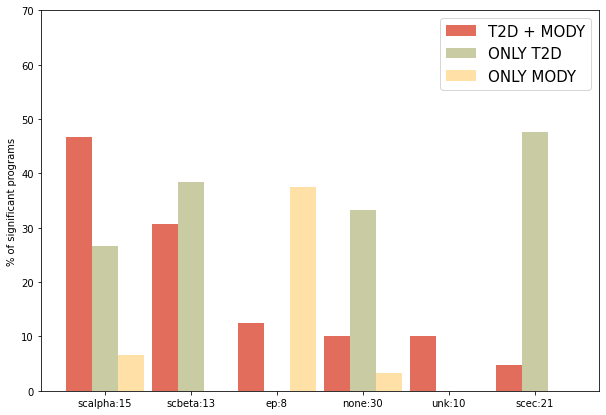

In [262]:
cts = list(d18_ct_proportion.index)

poly_mono_prog = []
poly_prog = []
mono_prog = []
for c in cts:
    poly_mono_prog.append(d18_ct_t2d_mody_proportion.loc[c].item()*100)
    if c in list(d18_ct_t2d_proportion.index):
        poly_prog.append(d18_ct_t2d_proportion.loc[c].item()*100)
    else:
        poly_prog.append(0)
    if c in list(d18_ct_mody_proportion.index):
        mono_prog.append(d18_ct_mody_proportion.loc[c].item()*100)
    else:
        mono_prog.append(0)


fig = plt.figure(figsize=(10,7))
x_axis = np.arange(len(cts))

plt.ylabel("% of significant programs")

b1 = plt.bar(x_axis - 0.3, poly_mono_prog, 0.3, label = 'T2D + MODY', color="#e26d5c", capsize=20) 
b2 = plt.bar(x_axis, poly_prog, 0.3, label = 'ONLY T2D', color="#c9cba3", capsize=20) 
b3 = plt.bar(x_axis + 0.3, mono_prog, 0.3, label = 'ONLY MODY', color="#ffe1a8", capsize=20)

#targets = [poly_prog[i]+1 for i in range(4)]
#x_start = [i-0.45 for i in range(4)]
#x_end = [i+0.45 for i in range(4)]
#plt.hlines(targets, x_start, x_end, color="black")

#day_ors = (np.array(poly_mono_prog) * np.array(none_prog))/(np.array(poly_prog) * np.array(mono_prog))
#for en, o in enumerate(day_ors):
#    if en == 0:
#        plt.annotate(f"OR: NA", (en, targets[en]+1), size=16, ha="center")
#    else:
#        plt.annotate(f"OR: {o:.2f}", (en, targets[en]+1), size=16, ha="center")

plt.ylim(0, 70)
plt.xticks(x_axis, [f"{c}:{d18_count['ko'].loc[c].item()}" for c in cts])
plt.legend(fontsize=15) 
#plt.show()
plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_d18_or_plot.png", bbox_inches="tight", dpi=900)

## cell composition

In [373]:
days = ["D3", "D7", "D11", "D18"]

In [381]:
ko_df[(ko_df["day"]==days[3])&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==True)]

,ko,ko-type,ct,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P
134,NKX2-2,t2d,ep,D18,True,0.000021,True,0.003929,4.670835,2.405692
148,MNX1,t2d,none,D18,True,0.000496,True,0.000028,3.304940,4.549450
154,ONECUT1e,t2d,none,D18,True,0.048225,True,0.000548,1.316729,3.261507
162,RFX6,mody,none,D18,True,0.007044,True,0.000026,2.152156,4.587129
167,ARX,t2d,scalpha,D18,True,0.000493,True,0.062433,3.307055,1.204583
170,NEUROD1,mody,scalpha,D18,True,0.000004,True,0.045441,5.416552,1.342554
171,NKX2-2,t2d,scalpha,D18,True,0.020157,True,0.000065,1.695579,4.187987
174,PBX1,mody,scalpha,D18,True,0.015550,True,0.017110,1.808260,1.766755
175,PDX1,mody,scalpha,D18,True,0.049536,True,0.004943,1.305083,2.306007
177,QSER1TET1,t2d,scalpha,D18,True,0.030939,True,0.052522,1.509492,1.279661


[0.0, 2.380952380952381, 9.30232558139535, 15.887850467289718]


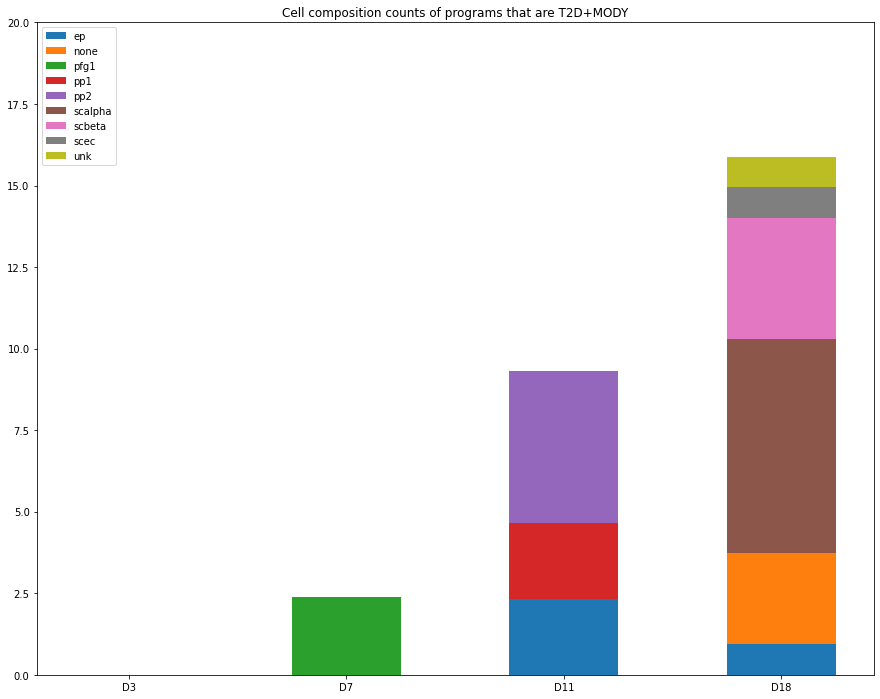

In [392]:
days = ["D3", "D7", "D11", "D18"]

len_poly_mono_prog = []
poly_mono_prog = []
for d in days:
    len_poly_mono_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==True)] ) )
    poly_mono_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==True)])/len(ko_df[(ko_df["day"]==d)]) *100)

df_t2d_mody = ko_df[(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==True)]
cts = sorted(set(df_t2d_mody["ct"]))

ct_counts = {}
for c in cts:
    temp = []
    for en, d in enumerate(days):
        x = len(df_t2d_mody[(df_t2d_mody["day"]==d)&(df_t2d_mody["ct"]==c)])
        if x > 0:
            x = (x/len_poly_mono_prog[en])*poly_mono_prog[en]
        temp.append(x)
    ct_counts[c] = temp
"""
ct_counts = {
    "pfg1": [0, 1, 0, 0],
    "ep": [0, 0, 1, 1],
    "pp1": [0, 0, 1, 0],
    "pp2": [0, 0, 2, 0],
    "none": [0, 0, 0, 5],
    "scalpha": [0, 0, 0, 10],
    "scbeta": [0, 0, 0, 5],
    "scec": [0, 0, 0, 3],
    "unk": [0, 0, 0, 1]
}"""
width = 0.5

fig, ax = plt.subplots(figsize=(15,12))
bottom = np.zeros(4)

for boolean, ct_count in ct_counts.items():
    p = ax.bar(days, ct_count, width, label=boolean, bottom=bottom)
    bottom += ct_count

print(poly_mono_prog)
ax.set(ylim=(0, 20))
ax.set_title("Cell composition counts of programs that are T2D+MODY")
ax.legend(loc="upper left")
plt.show()

In [ ]:
weight_counts = {
    "Below": np.array([70, 31, 58]),
    "Above": np.array([82, 37, 66]),
}
width = 0.5

fig, ax = plt.subplots()
bottom = np.zeros(3)

for boolean, weight_count in weight_counts.items():
    p = ax.bar(species, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count

ax.set_title("Number of penguins with above average body mass")
ax.legend(loc="upper right")

plt.show()

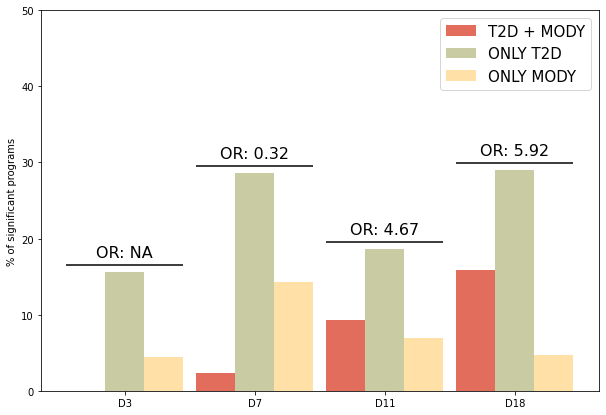

In [64]:
days = ["D3", "D7", "D11", "D18"]

poly_mono_prog = []
poly_prog = []
mono_prog = []
none_prog = []
for d in days:
    poly_mono_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==True)])/len(ko_df[(ko_df["day"]==d)]) *100)
    poly_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==False)&(ko_df["Prog T2D"]==True)])/len(ko_df[(ko_df["day"]==d)]) *100)
    mono_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==True)&(ko_df["Prog T2D"]==False)])/len(ko_df[(ko_df["day"]==d)]) *100)
    none_prog.append( len(ko_df[(ko_df["day"]==d)&(ko_df["Prog MODY"]==False)&(ko_df["Prog T2D"]==False)])/len(ko_df[(ko_df["day"]==d)]) *100)

fig = plt.figure(figsize=(10,7))
x_axis = np.arange(len(days))

plt.ylabel("% of significant programs")

b1 = plt.bar(x_axis - 0.3, poly_mono_prog, 0.3, label = 'T2D + MODY', color="#e26d5c", capsize=20) 
b2 = plt.bar(x_axis, poly_prog, 0.3, label = 'ONLY T2D', color="#c9cba3", capsize=20) 
b3 = plt.bar(x_axis + 0.3, mono_prog, 0.3, label = 'ONLY MODY', color="#ffe1a8", capsize=20)

targets = [poly_prog[i]+1 for i in range(4)]
x_start = [i-0.45 for i in range(4)]
x_end = [i+0.45 for i in range(4)]
plt.hlines(targets, x_start, x_end, color="black")

day_ors = (np.array(poly_mono_prog) * np.array(none_prog))/(np.array(poly_prog) * np.array(mono_prog))
for en, o in enumerate(day_ors):
    if en == 0:
        plt.annotate(f"OR: NA", (en, targets[en]+1), size=16, ha="center")
    else:
        plt.annotate(f"OR: {o:.2f}", (en, targets[en]+1), size=16, ha="center")

plt.ylim(0, 50)
plt.xticks(x_axis, days)
plt.legend(fontsize=15) 
#plt.show()
plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_or_plot.png", bbox_inches="tight", dpi=900)

## heatmap

In [152]:
ko_df

,Feature,ko,ko-type,ct,day,Prog MODY,Prog MODY P,Prog T2D,Prog T2D P,Prog MODY neglog10P,Prog T2D neglog10P
0,D3_sample_H_de1_ARX,ARX,t2d,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
1,D3_sample_H_de1_FOXA1,FOXA1,t2d,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
2,D3_sample_H_de1_FOXA2,FOXA2,mody,de1,D3,False,0.340168,True,0.033905,0.468307,1.469740
3,D3_sample_H_de1_GATA4,GATA4,mody,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
4,D3_sample_H_de1_GATA4het,GATA4het,t2d,de1,D3,False,1.000000,False,1.000000,-0.000000,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...
249,D18_sample_L_unk_NKX6-1,NKX6-1,t2d,unk,D18,False,1.000000,False,1.000000,-0.000000,-0.000000
250,D18_sample_L_unk_PDX1,PDX1,mody,unk,D18,False,0.354097,False,0.267039,0.450878,0.573425
251,D18_sample_L_unk_PROSER1,PROSER1,t2d,unk,D18,False,0.130572,False,0.098360,0.884151,1.007181
252,D18_sample_L_unk_RFX6,RFX6,mody,unk,D18,False,0.306884,False,1.000000,0.513026,-0.000000


In [153]:
ko_df_sumarized = ko_df.groupby("ko").sum()[["Prog MODY","Prog T2D"]]

In [154]:
ko_df_sumarized

,Prog MODY,Prog T2D
ko,,
ARX,1,6
BCOR,2,1
BMPR1A,0,1
FOXA1,4,3
FOXA2,1,2
GATA4,0,2
GATA4het,0,4
GATA6,0,2
GATA6het,0,1


In [113]:
ko_df_sumarized = ko_df[["ko","Prog MODY neglog10P","Prog T2D neglog10P"]].groupby("ko").mean()

In [137]:
mody_prog_sig = dict()
for group, gdf in ko_df[ko_df["Prog MODY"]==True].groupby("ko"):
    mody_prog_sig[group] = np.mean(gdf["Prog MODY neglog10P"])
    
t2d_prog_sig = dict()
for group, gdf in ko_df[ko_df["Prog T2D"]==True].groupby("ko"):
    t2d_prog_sig[group] = np.mean(gdf["Prog T2D neglog10P"])

hm = []
temp = []
for ko in sorted(all_kos):
    if ko in mody_prog_sig:
        temp.append(mody_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)
temp = []
for ko in sorted(all_kos):
    if ko in t2d_prog_sig:
        temp.append(t2d_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)

hm = pd.DataFrame(hm)
hm.columns = sorted(all_kos)

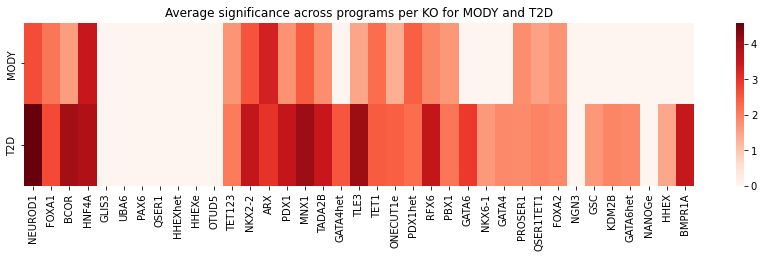

In [138]:
cm = ['vlag', 'Blues', 'Reds']
f, axs = plt.subplots(1, 1, gridspec_kw={'wspace': 0}, figsize=(15,3))

#hm = pd.DataFrame([ko_df_sumarized["Prog MODY neglog10P"].to_list(), ko_df_sumarized["Prog T2D neglog10P"].to_list()])
sns.heatmap(hm[order], yticklabels=["MODY","T2D"], xticklabels=order, annot=False, fmt='.2f', cmap='Reds')

plt.title("Average significance across programs per KO for MODY and T2D")
plt.show()
#plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_ko_heatmap_plot.png", bbox_inches="tight", dpi=900)

In [184]:
mody_prog_sig = dict()
for group, gdf in ko_df.groupby("ko"):
    mody_prog_sig[group] = np.max(gdf["Prog MODY neglog10P"])
    
t2d_prog_sig = dict()
for group, gdf in ko_df.groupby("ko"):
    t2d_prog_sig[group] = np.max(gdf["Prog T2D neglog10P"])

hm = []
temp = []
for ko in sorted(all_kos):
    if ko in mody_prog_sig:
        temp.append(mody_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)
temp = []
for ko in sorted(all_kos):
    if ko in t2d_prog_sig:
        temp.append(t2d_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)

hm = pd.DataFrame(hm)
hm.columns = sorted(all_kos)

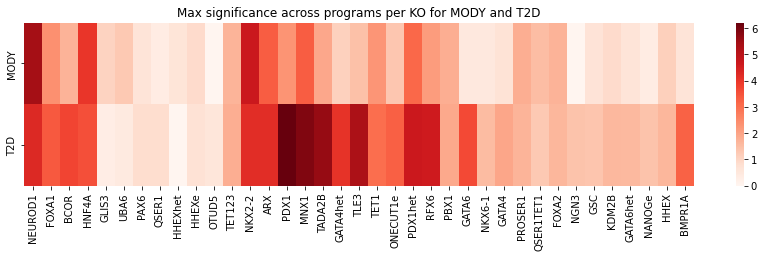

In [185]:
cm = ['vlag', 'Blues', 'Reds']
f, axs = plt.subplots(1, 1, gridspec_kw={'wspace': 0}, figsize=(15,3))

#hm = pd.DataFrame([ko_df_sumarized["Prog MODY neglog10P"].to_list(), ko_df_sumarized["Prog T2D neglog10P"].to_list()])
sns.heatmap(hm[order], yticklabels=["MODY","T2D"], xticklabels=order, annot=False, fmt='.2f', cmap='Reds')

plt.title("Max significance across programs per KO for MODY and T2D")
plt.show()
#plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_ko_heatmap_plot.png", bbox_inches="tight", dpi=900)

In [155]:
mody_prog_sig = dict()
for group, gdf in ko_df[ko_df["Prog MODY"]==True].groupby("ko"):
    mody_prog_sig[group] = len(gdf["Prog MODY neglog10P"])
    
t2d_prog_sig = dict()
for group, gdf in ko_df[ko_df["Prog T2D"]==True].groupby("ko"):
    t2d_prog_sig[group] = len(gdf["Prog T2D neglog10P"])

hm = []
temp = []
for ko in sorted(all_kos):
    if ko in mody_prog_sig:
        temp.append(mody_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)
temp = []
for ko in sorted(all_kos):
    if ko in t2d_prog_sig:
        temp.append(t2d_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)

hm = pd.DataFrame(hm)
hm.columns = sorted(all_kos)
#temp_hm = hm.T
#temp_hm[2] = temp_hm[0]-temp_hm[1]
#hm = hm[list(temp_hm.sort_values(2, ascending=False).index)]
#xlabel = [sorted(all_kos)[i] for i in list(temp_hm.sort_values(2, ascending=False).index)]

In [156]:
order = ["NEUROD1", "FOXA1", "BCOR", "HNF4A", "GLIS3", "UBA6", "PAX6",
         "QSER1", "HHEXhet", "HHEXe", "OTUD5", "TET123", "NKX2-2",
         "ARX", "PDX1", "MNX1", "TADA2B",
         "GATA4het", "TLE3", "TET1", "ONECUT1e", "PDX1het", "RFX6", "PBX1", 
         "GATA6", "NKX6-1", "GATA4", 
         "PROSER1", "QSER1TET1", "FOXA2", 
         "NGN3", "GSC", "KDM2B", "GATA6het", "NANOGe", "HHEX", "BMPR1A"]


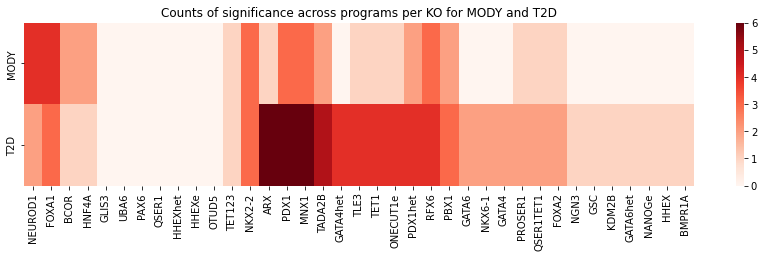

In [157]:
cm = ['vlag', 'Blues', 'Reds']
f, axs = plt.subplots(1, 1, gridspec_kw={'hspace': 0}, figsize=(15,3))

#hm = pd.DataFrame([ko_df_sumarized["Prog MODY neglog10P"].to_list(), ko_df_sumarized["Prog T2D neglog10P"].to_list()])
sns.heatmap(hm[order], yticklabels=["MODY","T2D"], xticklabels=order, annot=False, fmt='.2f', cmap='Reds')

plt.title("Counts of significance across programs per KO for MODY and T2D")
plt.show()
#plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_ko_heatmap_plot.png", bbox_inches="tight", dpi=900)

In [158]:
mody_prog_sig = dict()
for group, gdf in ko_df[(ko_df["day"]=="D18")&(ko_df["Prog MODY"]==True)].groupby("ko"):
    mody_prog_sig[group] = len(gdf["Prog MODY neglog10P"])
    
t2d_prog_sig = dict()
for group, gdf in ko_df[(ko_df["day"]=="D18")&(ko_df["Prog T2D"]==True)].groupby("ko"):
    t2d_prog_sig[group] = len(gdf["Prog T2D neglog10P"])

hm = []
temp = []
for ko in sorted(all_kos):
    if ko in mody_prog_sig:
        temp.append(mody_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)
temp = []
for ko in sorted(all_kos):
    if ko in t2d_prog_sig:
        temp.append(t2d_prog_sig[ko])
    else:
        temp.append(0)
hm.append(temp)

hm = pd.DataFrame(hm)
hm.columns = sorted(all_kos)
#temp_hm = hm.T
#temp_hm[2] = temp_hm[0]-temp_hm[1]
#hm = hm[list(temp_hm.sort_values(2, ascending=False).index)]
#xlabel = [sorted(all_kos)[i] for i in list(temp_hm.sort_values(2, ascending=False).index)]

In [179]:
order = ["NEUROD1", "HNF4A", "GLIS3", "UBA6", "PAX6", "GATA6", 
         "FOXA2", "GSC", "KDM2B", "NANOGe", "HHEX", "BMPR1A", 
         "QSER1", "HHEXhet", "HHEXe", "OTUD5", "QSER1TET1", "ONECUT1e", "NKX2-2",
         "MNX1", "ARX", "TLE3", "PBX1", "TET1", "PDX1", "PDX1het", "TADA2B",
         "NKX6-1", "FOXA1", "RFX6", "PROSER1", 
         "GATA4het", "GATA4", 
         "GATA6het", 
         "BCOR", "NGN3", "TET123", ]


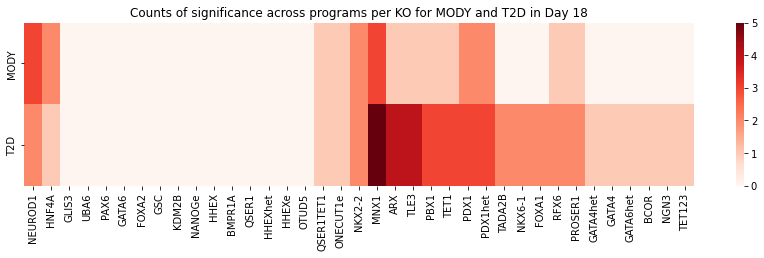

In [182]:
cm = ['vlag', 'Blues', 'Reds']
f, axs = plt.subplots(1, 1, gridspec_kw={'hspace': 0}, figsize=(15,3))

#hm = pd.DataFrame([ko_df_sumarized["Prog MODY neglog10P"].to_list(), ko_df_sumarized["Prog T2D neglog10P"].to_list()])
sns.heatmap(hm[order], yticklabels=["MODY","T2D"], xticklabels=order, annot=False, fmt='.2f', cmap='Reds')

plt.title("Counts of significance across programs per KO for MODY and T2D in Day 18")
#plt.show()
plt.savefig(f"/lila/home/fabihat/msk_labwork/20231112_dingyu/all_days_celltypes_d18_ko_heatmap_plot.png", bbox_inches="tight", dpi=900)

In [139]:
mody_kos

['NGN3',
 'ONECUT1e',
 'FOXA2',
 'GATA4',
 'NEUROD1',
 'GATA6',
 'PAX6',
 'PDX1',
 'RFX6',
 'HNF4A',
 'NKX2-2',
 'GLIS3',
 'MNX1']

# run models figure 2

In [222]:
#df_chrm = df.loc[sorted(set(df.index).intersection(set(gene_nomenclature["HGNC"])))][list(ko_df[(ko_df["Prog MODY"]==True)|(ko_df["Prog T2D"]==True)]["Feature"])]
df_chrm = df[list(ko_df[(ko_df["Prog MODY"]==True)|(ko_df["Prog T2D"]==True)]["Feature"])]
df_chrm = df_chrm.loc[(df_chrm!=0).any(axis=1),:]

In [223]:
df_chrm

,D3_sample_H_de1_FOXA2,D3_sample_H_de1_GATA6,D3_sample_H_de1_QSER1TET1,D3_sample_H_de2_GATA6,D3_sample_H_de2_GSC,D3_sample_H_de2_HHEX,D3_sample_H_de2_KDM2B,D3_sample_H_de2_PBX1,D3_sample_H_de2_TET123,D7_sample_I_liver_FOXA1,...,D18_sample_L_scec_NKX6-1,D18_sample_L_scec_PBX1,D18_sample_L_scec_PDX1,D18_sample_L_scec_PDX1het,D18_sample_L_scec_PROSER1,D18_sample_L_scec_RFX6,D18_sample_L_scec_TADA2B,D18_sample_L_scec_TET1,D18_sample_L_scec_TLE3,D18_sample_L_unk_MNX1
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.684519,0.000000,0.0,...,0.0,0.0,0.546837,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,-0.621601,0.000000,0.0,0.0,0.0
A4GALT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
AACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,-0.799963,0.000000,0.0,0.0,0.0
AAK1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,-0.590498,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZPLD1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,-2.385193,-1.714510,0.0,0.0,0.0
ZRANB3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
ZSWIM5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.974327,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0
ZSWIM6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.967452,0.000000,0.0,0.0,0.0


In [127]:
#df_pmd = pd.read_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_log2fc_u.tsv", sep="\t")
#df_pmd.index = df.index
#df_chrm = df_pmd.loc[sorted(set(df_pmd.index).intersection(set(gene_nomenclature["HGNC"])))]

## polygenic - MAGMA

### GLM

In [129]:
magma = pd.read_csv("/data/deyk/kushal/PolyPerturb/Gene_Scores/MAGMA-v108/MAGMA_v108_GENE_0_ZSTAT.txt", sep="\t")
magma = magma.fillna(0)

#trait = 'PASS_Type_1_Diabetes'
#trait = 'PASS_Type_2_Diabetes'
trait = 'UKB_460K.disease_T2D'

magma = list(magma[(magma[trait]>3)|(magma[trait]<-3)][trait].index)

In [130]:
auroc = []
auprc = []
for chrm in range(1,12):
    print(chrm)
    train_genes = sorted(set(df_chrm.index)-set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"]))
    test_genes = sorted(set(df_chrm.index).intersection(set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"])))

    magma_binary_train = [1 if g in magma else 0 for g in train_genes]
    magma_binary_test = [1 if g in magma else 0 for g in test_genes]

    bin_model = sm.GLM(magma_binary_train, df_chrm.loc[train_genes], family=sm.families.Binomial())
    bin_results = bin_model.fit()

    bin_predictions = bin_results.predict(df_chrm.loc[test_genes])

    auroc.append(sklearn.metrics.roc_auc_score(magma_binary_test, bin_predictions.to_list()))
    
    pr = sklearn.metrics.precision_recall_curve(magma_binary_test, bin_predictions.to_list())
    auprc.append(sklearn.metrics.auc(pr[1], pr[0]))

1
2
3
4
5
6
7
8
9
10
11


In [132]:
magma_auroc = auroc
magma_auprc = auprc

In [133]:
np.mean(magma_auroc)

0.5036623235041644

In [114]:
np.mean(magma_auroc)

0.5052010427806454

In [113]:
magma_auprc

[0.21944357231189168,
 0.11745496127511505,
 0.1766440534237863,
 0.14767763073365026,
 0.14275933490593176,
 0.14584775232687236,
 0.23522016137900784,
 0.20974758324382384,
 0.18785387713083235,
 0.2360485493606802,
 0.2917627262368498]

## polygenic - OpenTargets T2D

### GLM

In [264]:
opentargets = pd.read_csv("/lila/data/deyk/thahmina/diabetes/Type2Diabetes_disease_OpenTargets_L2G.Cleaned.03Jun24.csv")

In [265]:
opentargets = set(opentargets[opentargets["L2G"]>0.5]["gene_name"])

In [286]:
auroc = []
auprc = []
for chrm in range(1,12):
    print(chrm)
    train_genes = sorted(set(df_chrm.index)-set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"]))
    test_genes = sorted(set(df_chrm.index).intersection(set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"])))

    opentargets_binary_train = [1 if g in opentargets else 0 for g in train_genes]
    opentargets_binary_test = [1 if g in opentargets else 0 for g in test_genes]

    #bin_model = sm.GLM(opentargets_binary_train, df_chrm.loc[train_genes], family=sm.families.Binomial())
    bin_model = sm.GLM(opentargets_binary_train, df_chrm.loc[train_genes], family=sm.families.Binomial(sm.families.links.logit()))
    bin_results = bin_model.fit()

    bin_predictions = bin_results.predict(df_chrm.loc[test_genes])
    #bin_predictions = bin_results.predict(df_chrm.loc[train_genes])
    
    auroc.append(sklearn.metrics.roc_auc_score(opentargets_binary_test, bin_predictions.to_list()))
    #auroc.append(sklearn.metrics.roc_auc_score(opentargets_binary_train, 1-bin_predictions.to_numpy()))
    
    pr = sklearn.metrics.precision_recall_curve(opentargets_binary_test, bin_predictions.to_list())
    #pr = sklearn.metrics.precision_recall_curve(opentargets_binary_train, 1-bin_predictions.to_numpy())
    auprc.append(sklearn.metrics.auc(pr[1], pr[0]))

1


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



2


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



3


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



4


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



5


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



6


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



7


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



8


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



9


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



10


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



11


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning:

The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.



In [288]:
ot_auroc = auroc
ot_auprc = auprc

In [289]:
np.mean(ot_auroc), np.std(ot_auroc)

(0.47242846559889423, 0.059451928143623906)

In [302]:
from sklearn.linear_model import Ridge, BayesianRidge, Lasso, ElasticNet
import random

In [275]:
ld_blocks = pd.read_csv("/data/deyk/extras/loci_files/LAVA_LDblocks_published.txt", sep="\t")
ld_blocks

,LOC,CHR,START,STOP
0,1,1,10539,1376204
1,2,1,1376205,2215495
2,3,1,2215496,2983519
3,4,1,2983520,3582047
4,5,1,3582048,4281476
...,...,...,...,...
2490,2491,22,47299626,48269177
2491,2492,22,48269178,48977538
2492,2493,22,48977539,49559207
2493,2494,22,49559208,50347996


In [276]:
pca_results = pd.DataFrame(deg_components)
pca_results.index = df.index
pca_results.columns = [f"PCA_{i}" for i in range(len(pca_results.columns))]

pmd_results = pd.read_csv("/lila/data/deyk/fabiha/20231112_dingyu/all_days_celltypes/all_days_celltypes_log2fc_v.tsv", sep="\t")
pmd_results.index = df.index
pmd_results.columns = [f"PMD_{i}" for i in range(len(pmd_results.columns))]

In [300]:
gene_nomenclature[gene_nomenclature["HGNC"].isin(set(df.index))]

,NCBI,chr,start,end,strand,HGNC,Ensembl
4,148398,1,859993,879961,+,SAMD11,ENSG00000187634
9,57801,1,934342,936608,-,HES4,ENSG00000188290
10,9636,1,948847,949920,+,ISG15,ENSG00000187608
18,126792,1,1167629,1170421,+,B3GALT6,ENSG00000176022
21,116983,1,1227764,1243304,-,ACAP3,ENSG00000131584
...,...,...,...,...,...,...,...
18278,266,Y,6733959,6742068,-,AMELY,ENSG00000099721
18279,90665,Y,6778727,6959977,+,TBL1Y,ENSG00000092377
18287,7404,Y,15360259,15592550,-,UTY,ENSG00000183878
18291,22829,Y,16634488,16956825,+,NLGN4Y,ENSG00000165246


In [297]:
df_chrm

,D3_sample_H_de1_FOXA2,D3_sample_H_de1_GATA6,D3_sample_H_de1_QSER1TET1,D3_sample_H_de2_GATA6,D3_sample_H_de2_GSC,D3_sample_H_de2_HHEX,D3_sample_H_de2_KDM2B,D3_sample_H_de2_PBX1,D3_sample_H_de2_TET123,D7_sample_I_liver_FOXA1,...,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.684519,0.000000,0.0,...,-0.009393,-0.000592,0.026179,0.004343,-0.016917,-0.002705,0.001204,-0.010105,0.006112,-0.005048
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,-0.005777,0.017063,-0.007240,0.018075,0.010621,-0.004221,-0.002792,0.000799,0.021759,0.042949
A4GALT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.003417,-0.003311,0.003473,-0.006276,0.001209,0.001825,0.000264,0.000333,0.003374,0.001128
AACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000080,-0.001678,0.002341,0.000697,0.003136,0.000821,-0.000751,-0.003060,-0.004221,-0.001554
AAK1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.006019,-0.022523,-0.010980,0.012095,-0.001280,-0.003964,-0.006203,-0.008829,0.004011,0.002036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,-0.000222,0.000534,-0.000298,-0.000272,-0.000767,-0.000406,-0.000249,0.000784,-0.000278,0.000105
ZSWIM5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.974327,0.0,...,-0.000851,-0.000699,0.005830,0.001344,-0.002286,-0.001685,0.000619,-0.001030,-0.000088,0.001993
ZSWIM6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,-0.024172,0.033197,-0.017626,0.017272,0.010832,0.002655,-0.013112,0.011706,-0.025535,0.026815
ZYG11A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.002577,-0.000276,-0.008462,-0.001853,0.003246,0.003488,0.003949,0.002422,0.005446,-0.017073


In [293]:
#df_chrm = df
df_chrm = df.loc[sorted(set(df.index).intersection(set(gene_nomenclature["HGNC"])))]

#df_chrm = df_chrm[list(ko_df[(ko_df["Prog MODY"]==True)]["Feature"])]
#df_chrm = df_chrm[list(ko_df[(ko_df["Prog T2D"]==True)]["Feature"])]
df_chrm = df_chrm[list(ko_df[(ko_df["Prog MODY"]==True)|(ko_df["Prog T2D"]==True)]["Feature"])]

df_chrm = pd.concat([df_chrm, pca_results.loc[df_chrm.index]], axis=1)
df_chrm = df_chrm.loc[(df_chrm!=0).any(axis=1),:]

In [348]:
auroc = []
auprc = []
for chrm in range(1,12):
    train_genes = sorted(set(df_chrm.index)-set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"]))
    test_genes = sorted(set(df_chrm.index).intersection(set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"])))

    opentargets_binary_train = [1 if g in opentargets else 0 for g in train_genes]
    #opentargets_binary_train = [1 if g in mody else 0 for g in train_genes]
    temp_train = [g for en, g in enumerate(train_genes) if opentargets_binary_train[en]==1]
    temp_train += random.sample(sorted(set(train_genes) - set(temp_train)), len(temp_train))
    train_genes = temp_train
    opentargets_binary_train = [1 if g in opentargets else 0 for g in train_genes]
    #opentargets_binary_train = [1 if g in mody else 0 for g in train_genes]
    
    opentargets_binary_test = [1 if g in opentargets else 0 for g in test_genes]
    #opentargets_binary_test = [1 if g in mody else 0 for g in test_genes]
    temp_test = [g for en, g in enumerate(test_genes) if opentargets_binary_test[en]==1]
    temp_test += random.sample(sorted(set(test_genes) - set(temp_test)), len(temp_test))
    test_genes = temp_test
    opentargets_binary_test = [1 if g in opentargets else 0 for g in test_genes]
    #opentargets_binary_test = [1 if g in mody else 0 for g in test_genes]
    
    print(chrm, len(opentargets_binary_train), sum(opentargets_binary_train), len(opentargets_binary_test), sum(opentargets_binary_test))
    #bin_model = sm.GLM(opentargets_binary_train, df_chrm.loc[train_genes], family=sm.families.Binomial())
    bin_model = Ridge(alpha=70.0)
    bin_results = bin_model.fit(df_chrm.loc[train_genes], opentargets_binary_train)

    bin_predictions = bin_results.predict(df_chrm.loc[test_genes])
    
    auroc.append(sklearn.metrics.roc_auc_score(opentargets_binary_test, bin_predictions))
    
    pr = sklearn.metrics.precision_recall_curve(opentargets_binary_test, bin_predictions)
    auprc.append(sklearn.metrics.auc(pr[1], pr[0]))

1 530 265 24 12
2 500 250 54 27
3 484 242 70 35
4 520 260 34 17
5 514 257 40 20
6 500 250 54 27
7 498 249 56 28
8 482 241 72 36
9 516 258 38 19
10 510 255 44 22
11 486 243 68 34


In [349]:
ot_auroc = auroc
ot_auprc = auprc

In [350]:
np.mean(ot_auroc), np.std(ot_auroc)

(0.5533098572040513, 0.08837921764837539)

In [314]:
auroc = []
auprc = []
for chrm in range(1,12):
    train_genes = sorted(set(df_chrm.index)-set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"]))
    test_genes = sorted(set(df_chrm.index).intersection(set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"])))

    opentargets_binary_train = [1 if g in opentargets else 0 for g in train_genes]
    #opentargets_binary_train = [1 if g in mody else 0 for g in train_genes]
    
    opentargets_binary_test = [1 if g in opentargets else 0 for g in test_genes]
    #opentargets_binary_test = [1 if g in mody else 0 for g in test_genes]
    
    print(chrm, len(opentargets_binary_train), sum(opentargets_binary_train), len(opentargets_binary_test), sum(opentargets_binary_test))
    #bin_model = sm.GLM(opentargets_binary_train, df_chrm.loc[train_genes], family=sm.families.Binomial())
    bin_model = Ridge(alpha=70.0)
    bin_results = bin_model.fit(df_chrm.loc[train_genes], opentargets_binary_train)

    bin_predictions = bin_results.predict(df_chrm.loc[test_genes])
    
    auroc.append(sklearn.metrics.roc_auc_score(opentargets_binary_test, bin_predictions))
    
    pr = sklearn.metrics.precision_recall_curve(opentargets_binary_test, bin_predictions)
    auprc.append(sklearn.metrics.auc(pr[1], pr[0]))

1 4915 265 653 12
2 5096 250 472 27
3 5038 242 530 35
4 5052 260 516 17
5 5186 257 382 20
6 5011 250 557 27
7 5057 249 511 28
8 5169 241 399 36
9 5164 258 404 19
10 5213 255 355 22
11 4969 243 599 34


In [307]:
ot_auroc = auroc
ot_auprc = auprc

In [308]:
np.mean(ot_auroc), np.std(ot_auroc)

(0.550803363119189, 0.046843840293306474)

## monogenic - MODY

### GLM

In [226]:
mody = pd.read_csv(f"/data/deyk/kushal/extras/mendelian_gene_sets/MODY_genes.gs", header=None, sep="\t")[0].to_list()

In [252]:
auroc = []
auprc = []
for chrm in range(1,12):
    print(chrm)
    train_genes = sorted(set(df_chrm.index)-set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"]))
    test_genes = sorted(set(df_chrm.index).intersection(set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"])))

    mody_binary_train = [1 if g in mody else 0 for g in train_genes]
    mody_binary_test = [1 if g in mody else 0 for g in test_genes]

    bin_model = sm.GLM(mody_binary_train, df_chrm.loc[train_genes], family=sm.families.Binomial())
    bin_results = bin_model.fit()

    bin_predictions = bin_results.predict(df_chrm.loc[test_genes])

    auroc.append(sklearn.metrics.roc_auc_score(mody_binary_test, bin_predictions.to_list()))
    
    pr = sklearn.metrics.precision_recall_curve(mody_binary_test, bin_predictions.to_list())
    auprc.append(sklearn.metrics.auc(pr[1], pr[0]))
    print(sklearn.metrics.average_precision_score(mody_binary_test, bin_predictions.to_list()))

1


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.035619124866078725
2


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.06830934138224595
3


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.04370252389120313
4


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.02774353226860932
5


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.056056628585116425
6


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.02890840931573037
7


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.04198059360730594
8


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.04029601486841501
9


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.03622498041171024
10


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.03941029353692247
11


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


0.03194781357511137


/home/fabihat/.local/lib/python3.9/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


In [232]:
df_chrm

,D3_sample_H_de1_ARX,D3_sample_H_de1_FOXA1,D3_sample_H_de1_FOXA2,D3_sample_H_de1_GATA4,D3_sample_H_de1_GATA4het,D3_sample_H_de1_GATA6,D3_sample_H_de1_GATA6het,D3_sample_H_de1_GSC,D3_sample_H_de1_MNX1,D3_sample_H_de1_NKX6-1,...,D18_sample_L_unk_FOXA1,D18_sample_L_unk_HNF4A,D18_sample_L_unk_MNX1,D18_sample_L_unk_NEUROD1,D18_sample_L_unk_NKX2-2,D18_sample_L_unk_NKX6-1,D18_sample_L_unk_PDX1,D18_sample_L_unk_PROSER1,D18_sample_L_unk_RFX6,D18_sample_L_unk_TLE3
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A1CF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A4GALT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAK1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZSWIM2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZSWIM5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZSWIM6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZYG11A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [235]:
deg = []
for col in df_chrm:
    deg.append(len(df_chrm[df_chrm[col]!=0]))

In [236]:
np.mean(deg)

93.15748031496064

In [244]:
for i in df_chrm.sum(axis=1):
    if i == 0:
        print(list(df_chrm.index)[i])

In [246]:
auroc = []
auprc = []
for chrm in range(1,12):
    print(chrm)
    train_genes = sorted(set(df_chrm.index)-set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"]))
    test_genes = sorted(set(df_chrm.index).intersection(set(gene_nomenclature[(gene_nomenclature["chr"]==f"{chrm}")|(gene_nomenclature["chr"]==f"{23-chrm}")]["HGNC"])))

    mody_binary_train = [1 if g in mody else 0 for g in train_genes]
    mody_binary_test = [1 if g in mody else 0 for g in test_genes]
    
    print(chrm, sum(mody_binary_train), len(mody_binary_train)-sum(mody_binary_train))

1
1 190 4725
2
2 186 4910
3
3 189 4849
4
4 198 4854
5
5 195 4991
6
6 196 4815
7
7 192 4865
8
8 196 4973
9
9 197 4967
10
10 198 5015
11
11 193 4776


In [229]:
mody_auroc = auroc
mody_auprc = auprc

In [116]:
np.mean(mody_auroc)

0.4883853618291005

In [230]:
mody_auroc

[0.5056590752242925,
 0.5716604244694132,
 0.47875494071146246,
 0.47165668662674654,
 0.5697496947496947,
 0.4634531590413944,
 0.5105442176870748,
 0.4621958731136434,
 0.4184922680412371,
 0.44705882352941173,
 0.473013816925734]

In [231]:
mody_auprc

[0.20358031342118163,
 0.27920794314165565,
 0.16146165155599118,
 0.15604044083309984,
 0.26892467283597554,
 0.14104519192996698,
 0.20224029680365296,
 0.15022930824721564,
 0.12063047581736593,
 0.13092010003948928,
 0.15133302280965513]